**Alice - initial analysis**


# Setup

This project requires Python 3.7 or above:

In [1]:
import sys

assert sys.version_info >= (3, 7)

Scikit-Learn ≥1.0.1 is required:

In [2]:
from packaging import version
import sklearn

assert version.parse(sklearn.__version__) >= version.parse("1.0.1")

Let's define the default font sizes, to plot pretty figures:

In [3]:
import matplotlib.pyplot as plt

plt.rc('font', size=12)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=12)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

Make this notebook's output stable across runs:

In [4]:
import numpy as np

np.random.seed(42)

In [5]:
# extra code – code to save the figures as high-res PNGs for the book
from pathlib import Path

IMAGES_PATH = Path() / "alice_data" / "02_2023"
IMAGES_PATH.mkdir(parents=True, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = IMAGES_PATH / f"{fig_id}.{fig_extension}"
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)


# Alice basic analysis

In [6]:

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
import json


# import os
# for dirname, _, filenames in os.walk('/kaggle/input/alice-data-02-2023'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# import os
# print(os.listdir("/kaggle/input/"))
# Download and prepare the data
data_root = "./"
# mon_jobs = pd.read_csv(data_root + "mon_jobs_data_v3.csv")
mon_jdls = pd.read_csv(data_root + "mon_jdls.csv")
job_info = pd.read_csv(data_root + "job_info.csv")
trace = pd.read_csv(data_root + "trace.csv")
hosts = pd.read_json(data_root + "site-sonar-latest", lines=True)
df3 = pd.json_normalize(hosts['test_results_json'])
hosts_without_json = hosts[['host_id', 'hostname','ce_name','addr','last_updated']]
hosts_parsed = hosts_without_json.join(df3)

hosts_parsed = hosts_parsed.assign(is_hyper_threading = hosts_parsed['cpu_info.CPU_flags'].str.contains('ht', regex=False))
mon_jdls = mon_jdls.join(mon_jdls['full_jdl'].apply(json.loads).apply(pd.Series))

In [7]:
# Get the column data types as a dictionary
col_types = hosts_parsed.dtypes.to_dict()

# Print the column names and data types
for col, dtype in col_types.items():
    print(f'{col}: {dtype}')

host_id: int64
hostname: object
ce_name: object
addr: object
last_updated: int64
taskset_own_process.TASKSET: object
taskset_own_process.EXITCODE: float64
taskset_own_process.USING_PINNING: float64
taskset_own_process.EXECUTION_TIME: float64
taskset_own_process.PERCENTAGE_PINNED: float64
lhcbmarks.EXITCODE: float64
lhcbmarks.LHCbMarks: float64
lhcbmarks.EXECUTION_TIME: float64
os.OS_ID: object
os.OS_NAME: object
os.EXITCODE: float64
os.OS_ID_LIKE: object
os.OS_VERSION: object
os.OS_CPE_NAME: object
os.OS_HOME_URL: object
os.OS_ANSI_COLOR: object
os.OS_VERSION_ID: object
os.EXECUTION_TIME: float64
os.OS_PRETTY_NAME: object
os.OS_BUG_REPORT_URL: object
os.OS_REDHAT_SUPPORT_PRODUCT: object
os.OS_CENTOS_MANTISBT_PROJECT: object
os.OS_REDHAT_SUPPORT_PRODUCT_VERSION: object
os.OS_CENTOS_MANTISBT_PROJECT_VERSION: object
cpulimit_checking.CGROUP: object
cpulimit_checking.EXITCODE: float64
cpulimit_checking.ACCOUNTING: object
cpulimit_checking.ACCESS_QUOTA: object
cpulimit_checking.ACCESS_PERIO

In [8]:
# Get the numeric column names as a list
num_cols = list(hosts_parsed.select_dtypes(include=['number']).columns)

# Print the numeric column names and data types
for col in num_cols:
    print(f'{col}: {hosts_parsed[col].dtype}')

host_id: int64
last_updated: int64
taskset_own_process.EXITCODE: float64
taskset_own_process.USING_PINNING: float64
taskset_own_process.EXECUTION_TIME: float64
taskset_own_process.PERCENTAGE_PINNED: float64
lhcbmarks.EXITCODE: float64
lhcbmarks.LHCbMarks: float64
lhcbmarks.EXECUTION_TIME: float64
os.EXITCODE: float64
os.EXECUTION_TIME: float64
cpulimit_checking.EXITCODE: float64
cpulimit_checking.EXECUTION_TIME: float64
profiling_checking.EXITCODE: float64
profiling_checking.EXECUTION_TIME: float64
underlay.EXITCODE: float64
underlay.EXECUTION_TIME: float64
uname.EXITCODE: float64
uname.EXECUTION_TIME: float64
cvmfs_version.EXITCODE: float64
cvmfs_version.EXECUTION_TIME: float64
cpuset_checking.EXITCODE: float64
cpuset_checking.EXECUTION_TIME: float64
cpu_info.EXITCODE: float64
cpu_info.CPU_model: float64
cpu_info.CPU_apicid: float64
cpu_info.CPU_core_id: float64
cpu_info.CPU_cpu_MHz: float64
cpu_info.CPU_bogomips: float64
cpu_info.CPU_siblings: float64
cpu_info.CPU_stepping: float64
c

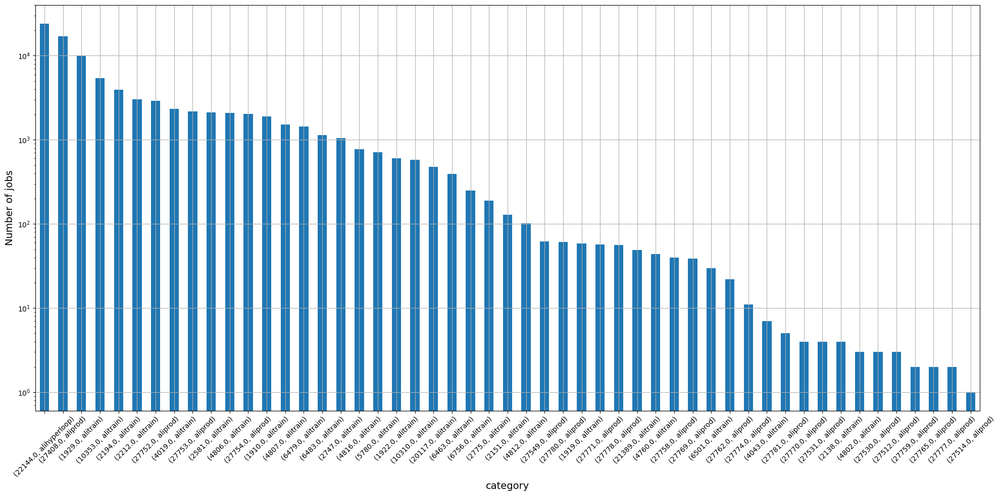

In [9]:
# jobs per category

jobs_per_category = mon_jdls.groupby(['lpmjobtypeid', 'User'])['job_id']\
.count().sort_values(ascending=False) 



jobs_per_category.plot.bar(figsize=(20,10), rot=45, grid=True, logy= True)
plt.xlabel("category")
plt.ylabel("Number of jobs")
save_fig("number_of_jobs_per_category")  # extra code
plt.show()

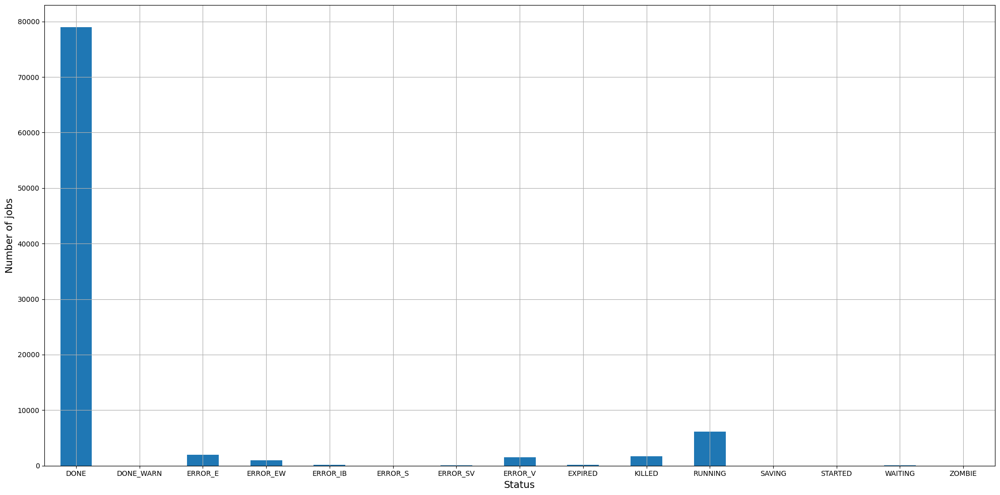

In [10]:

# get statuses
# select count(*), status from job_info GROUP BY status order by count DESC;
job_info.groupby("status")["job_id"].count().reset_index(name='count').sort_values(['count'], ascending=False) 
    

job_info["status"].value_counts().sort_index().plot.bar(figsize=(20,10), rot=0, grid=True)
plt.xlabel("Status")
plt.ylabel("Number of jobs")
save_fig("number_of_jobs_per_status")  # extra code
plt.show()


In [11]:
# filter on status
job_info.where((job_info.status == 'ERROR_IB')).count()

job_id                  178
jdl_set                 178
trace_set               178
status                  178
job_submit_timestamp    178
last_update             178
dtype: int64

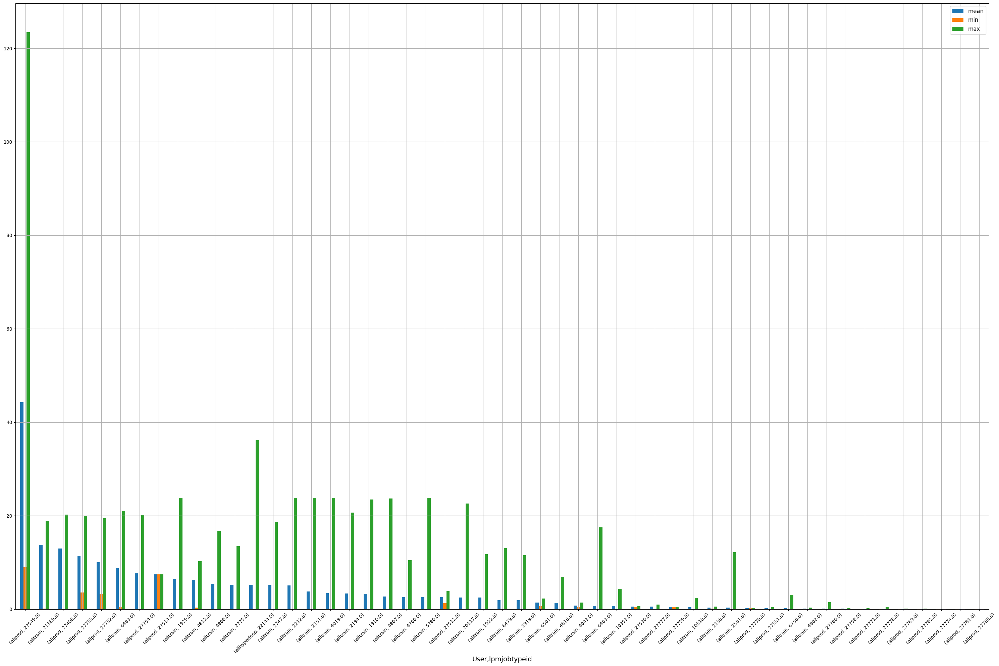

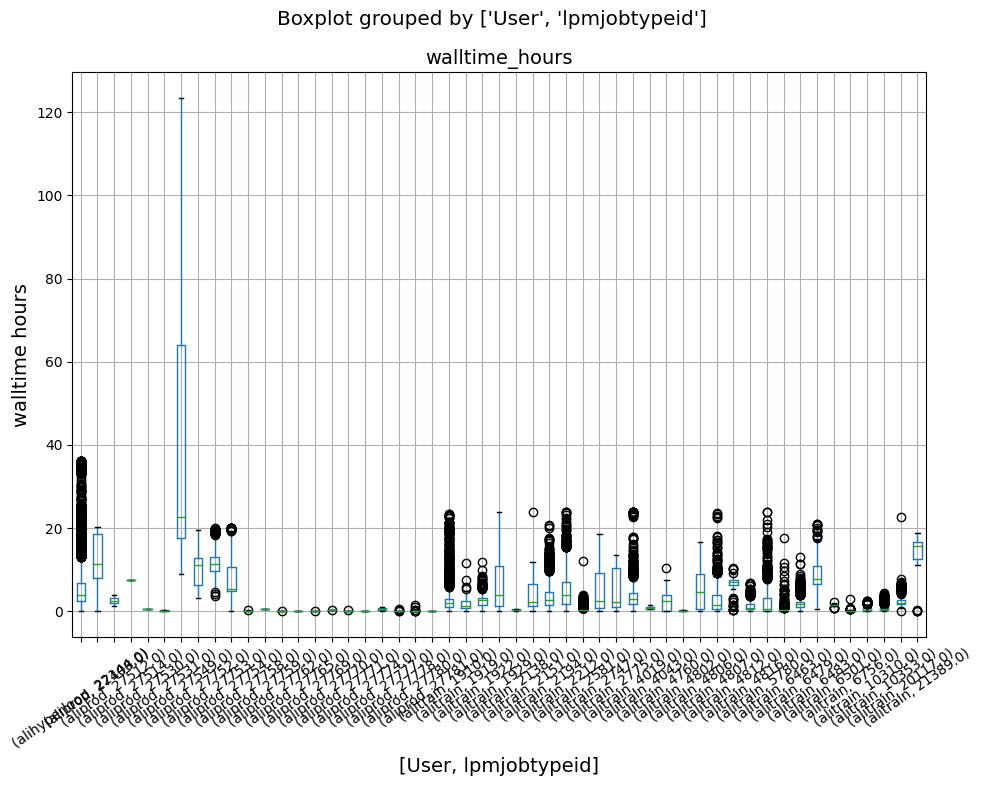

In [12]:
# Durations based on the Trace wall_time value
# running_timestamp - finished_timestamp

job_info_with_trace = job_info.where(job_info.status == 'DONE').set_index("job_id").join(trace.set_index('job_id'), how='inner')\
.join(mon_jdls.set_index('job_id'), how='inner').reset_index()

job_info_with_trace['walltime'].head()

job_info_with_trace = job_info_with_trace.assign(walltime_minutes = job_info_with_trace['walltime'] / 60, walltime_hours = job_info_with_trace['walltime'] / 3600).sort_values(['walltime_minutes'], ascending=False)

# all calculations in minutes now
# then create a sub group of ['value','lpmjobtypeid'] and get mean duration for all jobs within a group.
mean_walltime_per_group = job_info_with_trace.groupby(['User','lpmjobtypeid'])['walltime_hours'].agg(['mean', 'min', 'max'])\
.sort_values(['mean'], ascending=False) 


mean_walltime_per_group.plot.bar(figsize=(30,20), rot=45, grid=True)
save_fig("mean_wall_time_per_category_bar [HOURS]")

# Draw all values within a category on the boxplot
fig, ax = plt.subplots(figsize=(10,8))
plt.suptitle('Wall times per category box plot ALL values')
ax.set_xlabel('Category')
ax.set_ylabel('walltime hours')
job_info_with_trace.boxplot(figsize=(50,50), by=['User','lpmjobtypeid'], column=['walltime_hours'], ax=ax, rot=35)
save_fig("walltimes_per_category_ALL_boxplot [HOURS]")

In [13]:
job_info_with_trace['walltime_hours'].describe

<bound method NDFrame.describe of 58746    123.454444
58748    119.810556
58768    113.123889
58747    109.738611
58753    106.381389
            ...    
32270     -0.000278
32280     -0.000278
11202     -0.000278
33701     -0.000278
6146      -0.000278
Name: walltime_hours, Length: 78747, dtype: float64>

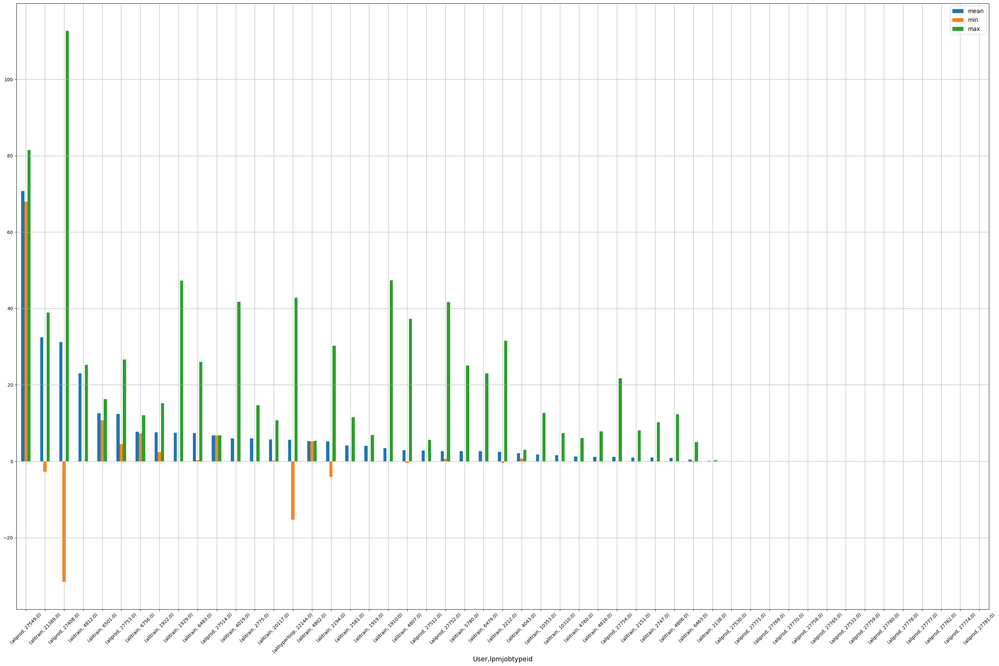

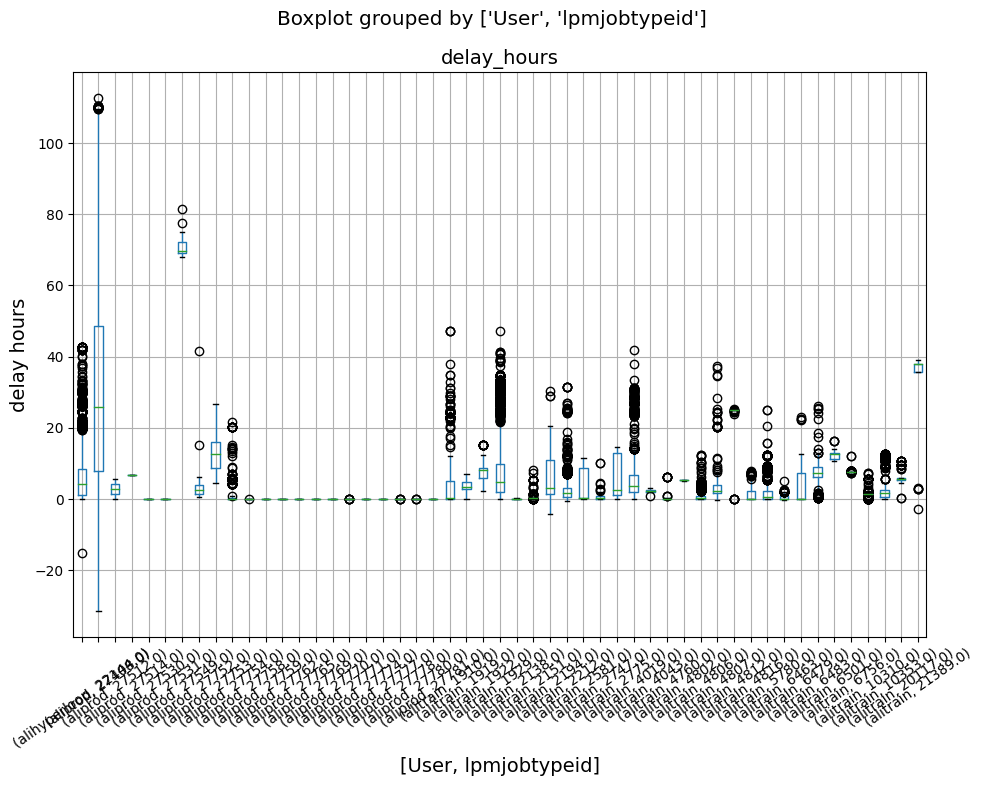

In [14]:
# delay between submit and start
# 1. `job_info.job_submit_timestamp` - when the job is submitted to the queue
#    <delay of minutes to hours is normal here>

# 2. `Trace.started_timestamp` - when the job is picked up and is being set up on the node

job_info_with_trace = job_info.where(job_info.status == 'DONE').set_index("job_id").join(trace.set_index('job_id'), how='inner')\
.join(mon_jdls.set_index('job_id'), how='inner').reset_index()

job_info_with_trace = job_info_with_trace.where(job_info_with_trace['startedtimestamp'] > 0)

# job_info_with_trace_with_delay[['startedtimestamp','job_submit_timestamp']].head()

job_info_with_trace_with_delay= job_info_with_trace.assign(delay = job_info_with_trace['startedtimestamp'] - (job_info_with_trace['job_submit_timestamp']*1000))

job_info_with_trace_with_delay[['startedtimestamp','job_submit_timestamp', 'delay']].head()

job_info_with_trace_with_delay = job_info_with_trace_with_delay.assign(delay_minutes = job_info_with_trace_with_delay['delay'] / 1000 / 60, delay_hours = job_info_with_trace_with_delay['delay'] / 1000 / 3600).sort_values(['delay_minutes'], ascending=True)

job_info_with_trace_with_delay.head()


# job_info.info()
# trace.info()
# mon_jdls.info()
# job_info_with_trace_with_delay.head()

job_info_with_trace_with_delay_group = job_info_with_trace_with_delay.groupby(['User','lpmjobtypeid'])['delay_hours'].agg(['mean', 'min', 'max'])\
.sort_values(['mean'], ascending=False) 


job_info_with_trace_with_delay_group.plot.bar(figsize=(30,20), rot=45, grid=True)
save_fig("mean_delays_between_job_submission_and_start_per_category_bar [HOURS]")


fig, ax = plt.subplots(figsize=(10,8))
plt.suptitle('Delays between job submission and start')
ax.set_xlabel('Category')
ax.set_ylabel('delay hours')
job_info_with_trace_with_delay.boxplot(figsize=(50,50), by=['User','lpmjobtypeid'], column=['delay_hours'], ax=ax, rot=35)
save_fig("delays between job submission and start_boxplot [Hours]")



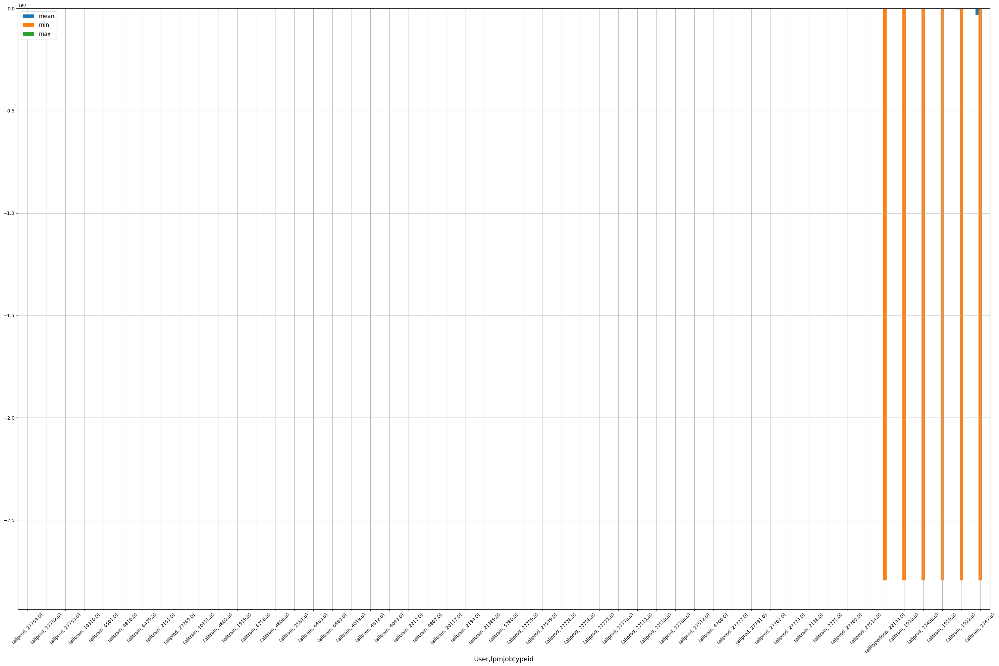

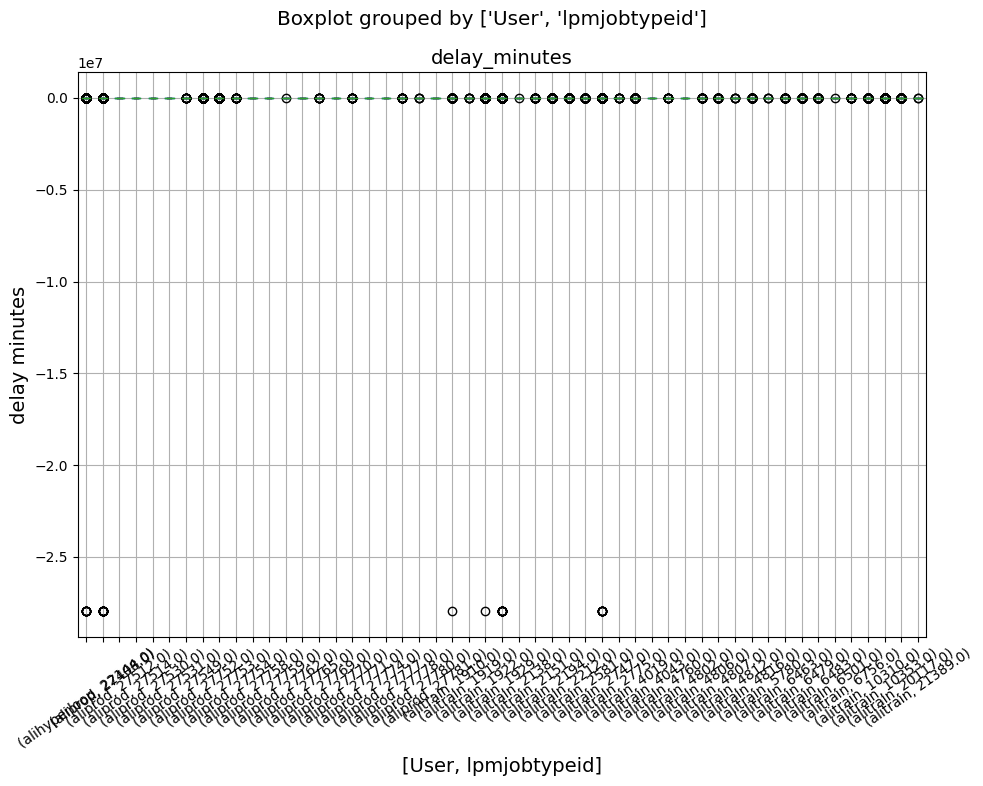

In [15]:
# Delay between:
#
# 2. `Trace.started_timestamp` - when the job is picked up and is being set up on the node
# 
# 3. `Trace.running_timestamp` - when the processing starts
#       and all prerequisites are met (package environment, input data downloaded, sandbox created etc),
#       typically <1min

job_info_with_trace = job_info.set_index("job_id").join(trace.set_index('job_id'), how='inner')\
.join(mon_jdls.set_index('job_id'), how='inner').reset_index()

# job_info_with_trace['runningtimestamp_int'] = job_info_with_trace['runningtimestamp'].apply(lambda x: int(x))
# job_info_with_trace['job_info_with_trace'].head()
job_info_with_trace = job_info_with_trace.where(job_info_with_trace['startedtimestamp'] > 0)

# job_info_with_trace_with_delay[['startedtimestamp','job_submit_timestamp']].head()

job_info_with_trace_with_delay= job_info_with_trace.assign(delay = job_info_with_trace['runningtimestamp'] - (job_info_with_trace['startedtimestamp']))


job_info_with_trace_with_delay = job_info_with_trace_with_delay.assign(delay_minutes = job_info_with_trace_with_delay['delay'] / 1000 / 60, delay_hours = job_info_with_trace_with_delay['delay'] / 1000 / 3600).sort_values(['delay_minutes'], ascending=True)

# job_info_with_trace_with_delay.head()


# job_info.info()
# trace.info()
# mon_jdls.info()
# job_info_with_trace_with_delay.head()

job_info_with_trace_with_delay_group = job_info_with_trace_with_delay.groupby(['User','lpmjobtypeid'])['delay_minutes'].agg(['mean', 'min', 'max'])\
.sort_values(['mean'], ascending=False) 


job_info_with_trace_with_delay_group.plot.bar(figsize=(30,20), rot=45, grid=True)
save_fig("mean_delays_between_job_start_and_running_per_category_bar")


fig, ax = plt.subplots(figsize=(10,8))
plt.suptitle('Delays between job start and running')
ax.set_xlabel('Category')
ax.set_ylabel('delay minutes')
job_info_with_trace_with_delay.boxplot(figsize=(50,50), by=['User','lpmjobtypeid'], column=['delay_minutes'], ax=ax, rot=35)
save_fig("delays between job start and running_boxplot [MINUTES]")



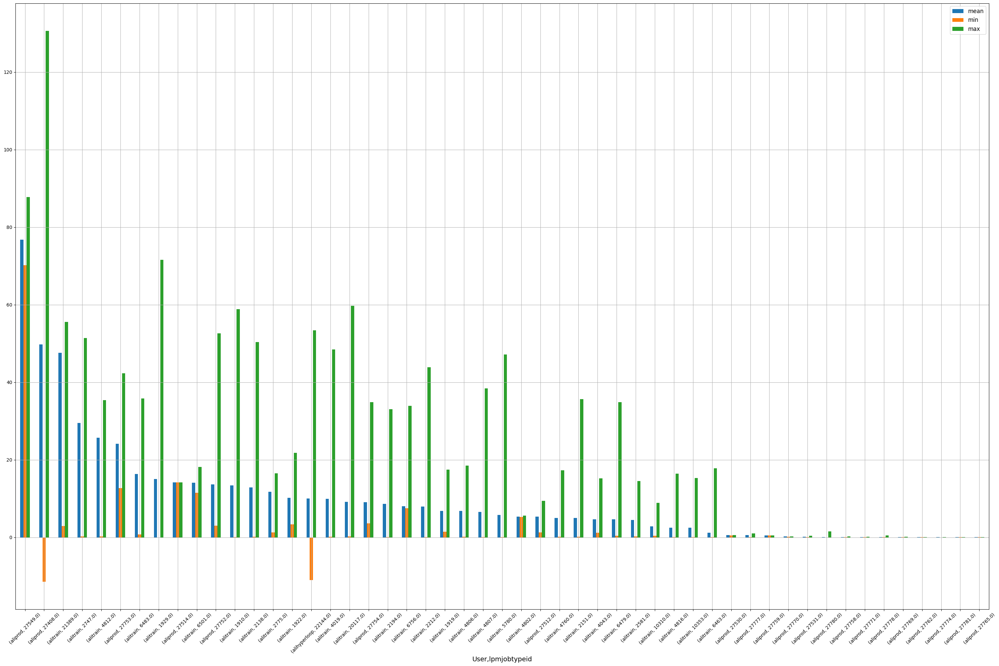

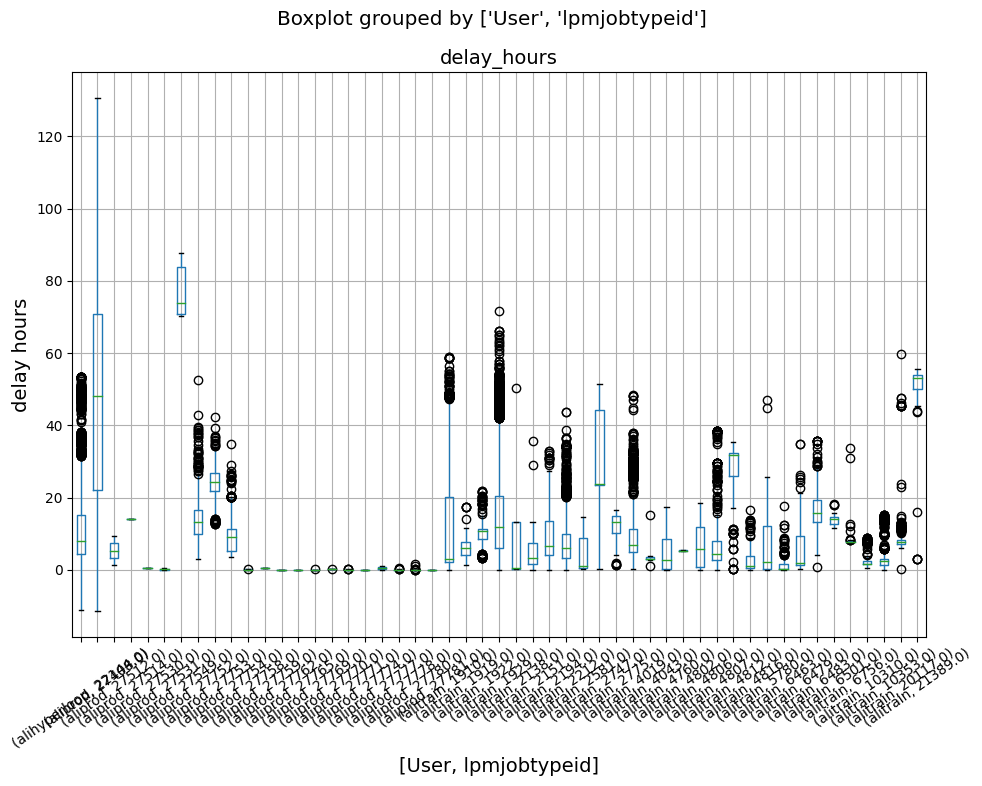

In [16]:
# delay between submit and finished (inlcude job in the queue time)
# 1. `job_info.job_submit_timestamp` - when the job is submitted to the queue
#    <delay of minutes to hours is normal here>

# 2. `Trace.final_timestamp` - when the job is finished

job_info_with_trace = job_info.set_index("job_id").join(trace.set_index('job_id'), how='inner')\
.join(mon_jdls.set_index('job_id'), how='inner').reset_index()

job_info_with_trace = job_info_with_trace.where(job_info_with_trace['finaltimestamp'] > 0)

job_info_with_trace_with_delay= job_info_with_trace.assign(delay = job_info_with_trace['finaltimestamp'] - (job_info_with_trace['job_submit_timestamp']*1000))


job_info_with_trace_with_delay = job_info_with_trace_with_delay.assign(delay_minutes = job_info_with_trace_with_delay['delay'] / 1000 / 60, delay_hours = job_info_with_trace_with_delay['delay'] / 1000 / 3600).sort_values(['delay_minutes'], ascending=True)

job_info_with_trace_with_delay.head()


# job_info.info()
# trace.info()
# mon_jdls.info()
# job_info_with_trace_with_delay.head()

job_info_with_trace_with_delay_group = job_info_with_trace_with_delay.groupby(['User','lpmjobtypeid'])['delay_hours'].agg(['mean', 'min', 'max'])\
.sort_values(['mean'], ascending=False) 


job_info_with_trace_with_delay_group.plot.bar(figsize=(30,20), rot=45, grid=True)
save_fig("mean_delays_between_job_submission_and_final_per_category_bar [HOURS]")


fig, ax = plt.subplots(figsize=(10,8))
plt.suptitle('Delays between job submission and final')
ax.set_xlabel('Category')
ax.set_ylabel('delay hours')
job_info_with_trace_with_delay.boxplot(figsize=(50,50), by=['User','lpmjobtypeid'], column=['delay_hours'], ax=ax, rot=35)
save_fig("delays between job submission and final [Hours]")

In [17]:
# correlations using Trace data (not mon alice)

job_info_with_trace = job_info.where(job_info.status == 'DONE').set_index("job_id").join(trace.set_index('job_id'), how='inner')\
.join(mon_jdls.set_index('job_id'), how='inner').reset_index()

job_info_with_trace = job_info_with_trace.where(job_info_with_trace['finaltimestamp'] > 0).where(job_info_with_trace['startedtimestamp'] > 0)

job_info_with_trace_with_delay = job_info_with_trace.assign(delay_submission_to_final = job_info_with_trace['finaltimestamp'] - (job_info_with_trace['job_submit_timestamp']*1000))

job_info_with_trace_with_delay = job_info_with_trace_with_delay.assign(delay_submission_to_final_minutes = job_info_with_trace_with_delay['delay_submission_to_final'] / 1000 / 60, delay_submission_to_final_hours = job_info_with_trace_with_delay['delay_submission_to_final'] / 1000 / 3600).sort_values(['delay_submission_to_final_minutes'], ascending=True)

job_info_with_trace_with_delay= job_info_with_trace_with_delay.assign(delay_submission_to_started = job_info_with_trace['startedtimestamp'] - (job_info_with_trace['job_submit_timestamp']*1000))

job_info_with_trace_with_delay = job_info_with_trace_with_delay.assign(delay_submission_to_started_minutes = job_info_with_trace_with_delay['delay_submission_to_started'] / 1000 / 60, delay_submission_to_started_hours = job_info_with_trace_with_delay['delay_submission_to_started'] / 1000 / 3600).sort_values(['delay_submission_to_started_minutes'], ascending=True)

job_info_with_trace_with_delay = job_info_with_trace_with_delay.assign(walltime_minutes = job_info_with_trace_with_delay['walltime'] / 60, walltime_hours = job_info_with_trace_with_delay['walltime'] / 3600).sort_values(['walltime_minutes'], ascending=False)

job_info_with_trace_with_delay.head()


,job_id,jdl_set,trace_set,status,job_submit_timestamp,last_update,aliencpuefficiency,cputime,host,maxrss,...,Email,MaxInitFailed,delay_submission_to_final,delay_submission_to_final_minutes,delay_submission_to_final_hours,delay_submission_to_started,delay_submission_to_started_minutes,delay_submission_to_started_hours,walltime_minutes,walltime_hours
58746,2.808882e+09,t,t,DONE,1.677254e+09,2023-02-28 07:05:11.477423,85.36,379357.28,alice-cray016,16840704,...,NaN,NaN,310738000.0,5178.966667,86.316111,255151000.0,4252.516667,70.875278,7407.266667,123.454444
58748,2.808882e+09,t,t,DONE,1.677254e+09,2023-02-28 06:23:54.055184,87.31,376572.78,alice-cray016,16650240,...,NaN,NaN,309077000.0,5151.283333,85.854722,255171000.0,4252.850000,70.880833,7188.633333,119.810556
58768,2.808883e+09,t,t,DONE,1.677254e+09,2023-02-28 06:29:56.89394,93.93,382509.44,alice-cray012,15569920,...,NaN,NaN,307569000.0,5126.150000,85.435833,256678000.0,4277.966667,71.299444,6787.433333,113.123889
58747,2.808882e+09,t,t,DONE,1.677254e+09,2023-02-28 06:20:45.689934,86.44,341504.25,alice-cray016,15580160,...,NaN,NaN,304532000.0,5075.533333,84.592222,255154000.0,4252.566667,70.876111,6584.316667,109.738611
58753,2.808882e+09,t,t,DONE,1.677254e+09,2023-02-28 06:22:26.113211,92.60,354642.88,alice-cray012,17556480,...,NaN,NaN,303141000.0,5052.350000,84.205833,255281000.0,4254.683333,70.911389,6382.883333,106.381389


In [18]:
# Categorization by duration_minutes

# prepare train and test data sets

from sklearn.model_selection import train_test_split


train_set, test_set = train_test_split(job_info_with_trace_with_delay, test_size=0.2, random_state=42)
train_set.head()
len(test_set)

job_info_with_trace_with_delay["walltime_hours_cat"] = pd.cut(job_info_with_trace_with_delay["walltime_hours"],
                               bins=[0., 5, 10, 15, 20, 25., np.inf],
                               labels=[1,2,3,4,5,6])

# count nans in the duration_minutes
# durations['duration_minutes'].isna().sum()

In [19]:
len(test_set)

15750

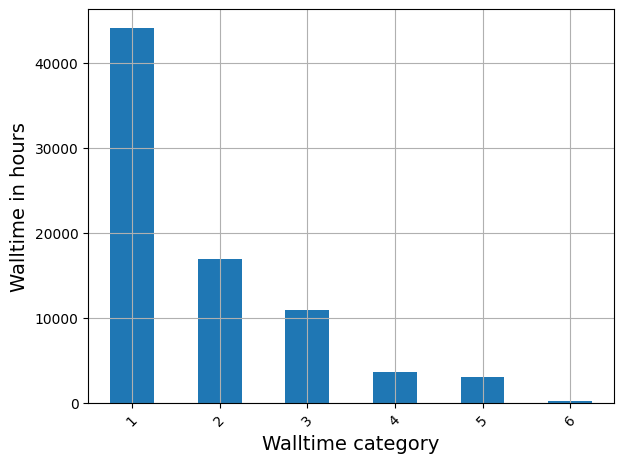

In [20]:
job_info_with_trace_with_delay["walltime_hours_cat"].value_counts().sort_index().plot.bar(rot=45, grid=True)
plt.xlabel("Walltime category")
plt.ylabel("Walltime in hours")
save_fig("waltime_hours_cat_bar_plot")  # extra code
plt.show()


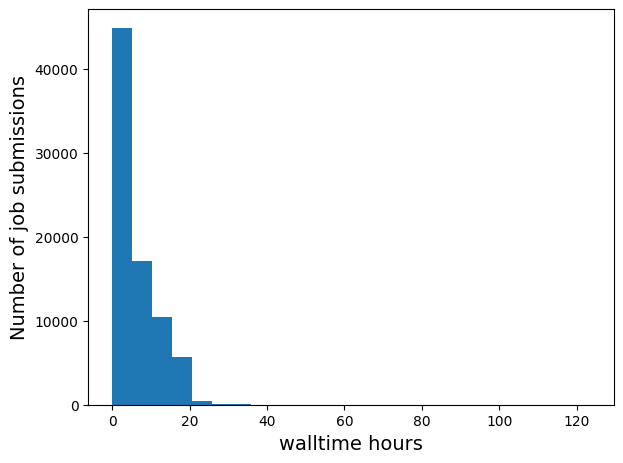

In [21]:
# draw all walltime hours order by job_submit_timestamp
job_info_with_trace_with_delay['job_submit_timestamp_date_time'] = pd.to_datetime(job_info_with_trace_with_delay['job_submit_timestamp'], unit='s')

# job_info_with_trace_with_delay.sort_values(by = 'job_submit_timestamp_date_time', ascending=True)

plt.hist(job_info_with_trace_with_delay['walltime_hours'], bins=24)
plt.xlabel('walltime hours')
plt.ylabel('Number of job submissions')
save_fig("walltime_hours_sorted_all_categories")
plt.show()

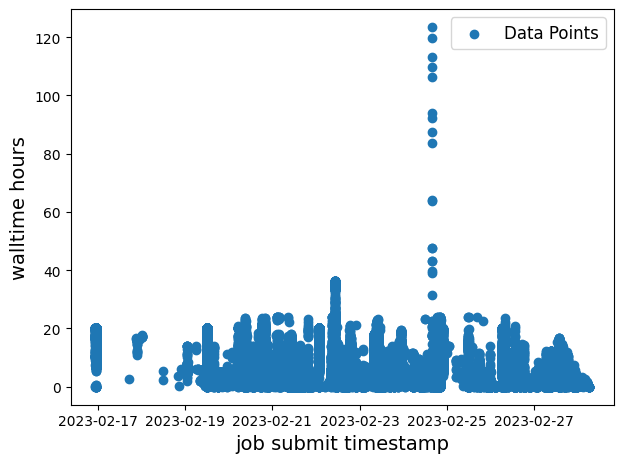

In [22]:
import pandas as pd
import matplotlib.pyplot as plt


# create a new DataFrame with a copy of the submit_time column
X = pd.DataFrame(job_info_with_trace_with_delay['job_submit_timestamp_date_time'])
y = pd.DataFrame(job_info_with_trace_with_delay['walltime_hours'])

plt.scatter(X, y, label='Data Points')
plt.xlabel('job submit timestamp')
plt.ylabel('walltime hours')
plt.legend()
save_fig("walltime_hours_per_job_submit_timestamp_scatter")
plt.show()

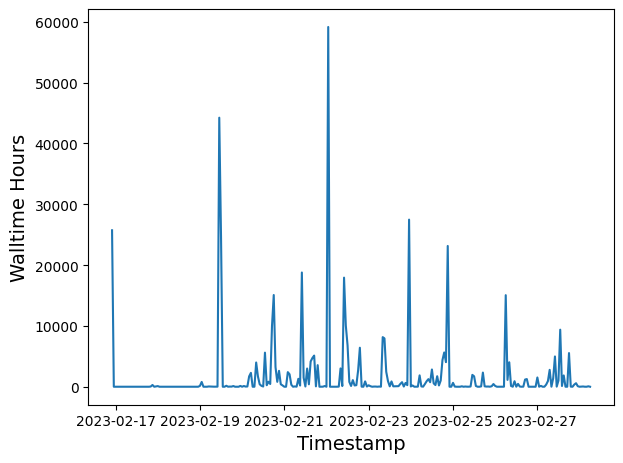

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.DataFrame(job_info_with_trace_with_delay, columns=['job_submit_timestamp_date_time', 'walltime_hours'])


# Convert the timestamp column to a DatetimeIndex and set it as the index
df['timestamp'] = pd.to_datetime(df['job_submit_timestamp_date_time'])
df.set_index('timestamp', inplace=True)

# Resample the data by hour and sum the walltime hours
df_hourly = df.resample('H').sum()

# Plot the data
plt.plot(df_hourly.index, df_hourly['walltime_hours'])
plt.xlabel('Timestamp')
plt.ylabel('Walltime Hours')
save_fig("walltime_hours_per_job_submit_timestamp_plot_hourly")
plt.show()


In [24]:

# import matplotlib.pyplot as plt

# def draw_boxplot_gruped_by_field(job_info_with_trace, fields_to_group, category = 'ALL'):
#     fig, ax = plt.subplots(figsize=(10, 8))
#     plt.suptitle(f'Wall times per {fields_to_group} box plot ALL values')
#     ax.set_xlabel('Category')
#     ax.set_ylabel('walltime hours')
#     job_info_with_trace.boxplot(figsize=(50, 50), by=fields_to_group, column=['walltime_hours'], ax=ax, rot=35)
#     save_fig(f"walltimes_per_{fields_to_group}_{category}_boxplot [HOURS]")
    
    
    
# import matplotlib.pyplot as plt

# def draw_boxplot_grouped_by_field_with_count(job_info_with_trace, fields_to_group, category='ALL'):
#     fig, ax = plt.subplots(figsize=(10, 8))
#     plt.suptitle(f'Wall times per {fields_to_group} box plot ALL values')
#     ax.set_xlabel('Category')
#     ax.set_ylabel('walltime hours')

#     # Plot boxplot
#     job_info_with_trace.boxplot(figsize=(50, 50), by=fields_to_group, column=['walltime_hours'], ax=ax, rot=35)

#     # Add count plot to secondary y-axis
#     counts = job_info_with_trace.groupby(fields_to_group)['walltime_hours'].apply(lambda x: x[x.notnull()].count())
#     ax2 = ax.twinx()
#     ax2.set_ylabel('Count of elements')
#     ax2.bar(counts.index, counts.values, alpha=0.5, color='yellow', width=0.3)

#     # Adjust the position of the count plot
#     ax2.spines['right'].set_position(('axes', 1.05))

#     save_fig(f"walltimes_per_{fields_to_group}_{category}_boxplot [HOURS] and count")

    


In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

def draw_boxplot_gruped_by_field(job_info_with_trace, field_to_group, category='ALL'):
    group_counts = job_info_with_trace.groupby(field_to_group).size()
    large_groups = group_counts[group_counts > 100].index.tolist()
    filtered_data = job_info_with_trace[job_info_with_trace[field_to_group].isin(large_groups)]

    fig, ax = plt.subplots(figsize=(10, 8))
    plt.suptitle(f'Wall times per {field_to_group} box plot {category} values with count > 100')
    ax.set_xlabel('Category')
    ax.set_ylabel('Walltime Hours')
    filtered_data.boxplot(column=['walltime_hours'], by=[field_to_group], ax=ax, rot=35)

    save_fig(f"walltimes_per_{field_to_group}_{category}_boxplot [HOURS]")
    
    # draw barplot
    plt.figure(figsize=(10, 8))
    plt.title(f'Wall times per {field_to_group} bar plot {category} values with count > 100')
    plt.xlabel('Category')
    plt.ylabel('Walltime Hours')
    ax = sns.barplot(x=field_to_group, y='walltime_hours', data=filtered_data)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=35)
    
    save_fig(f"walltimes_per_{field_to_group}_{category}_barplot [HOURS]")
    


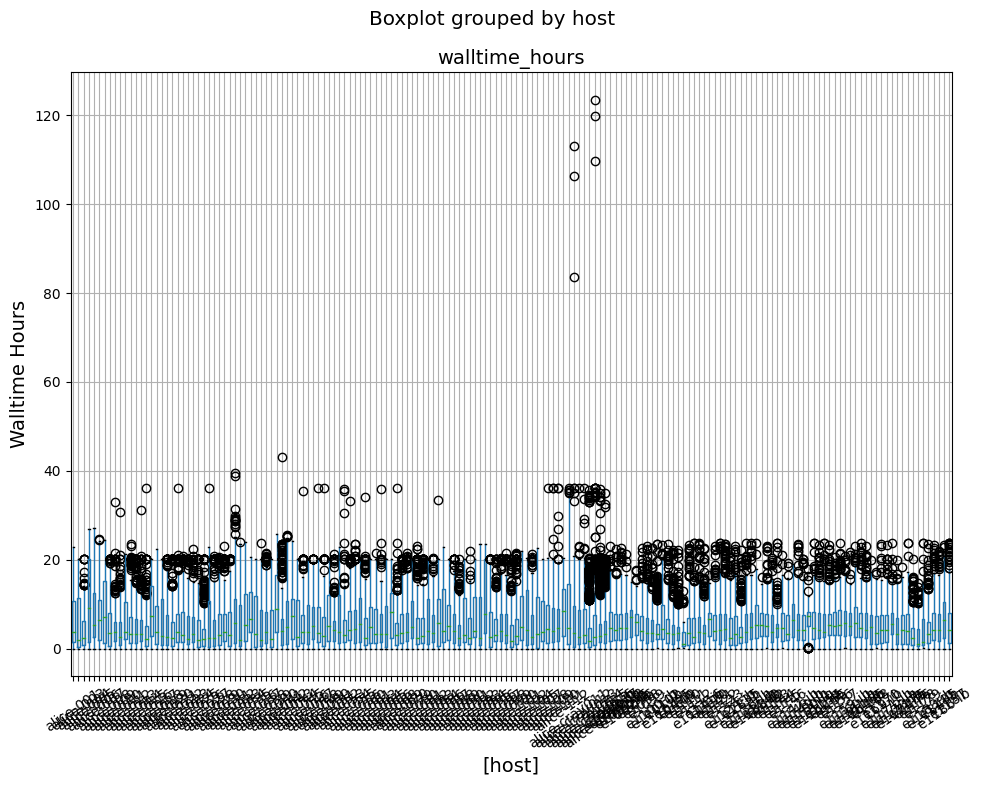

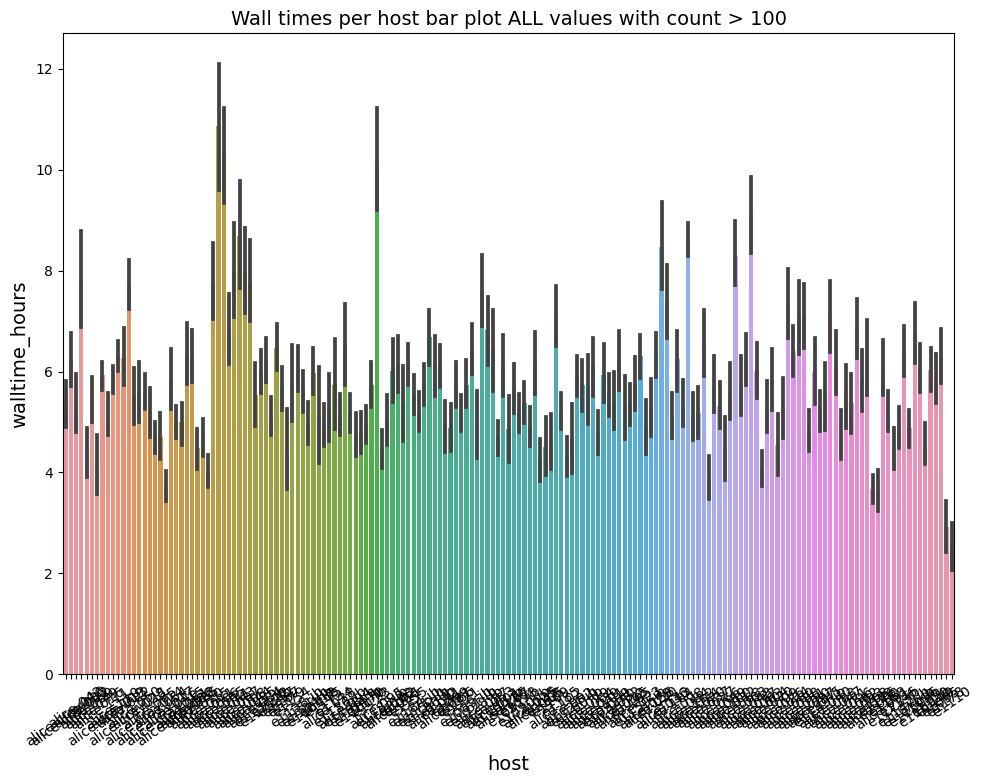

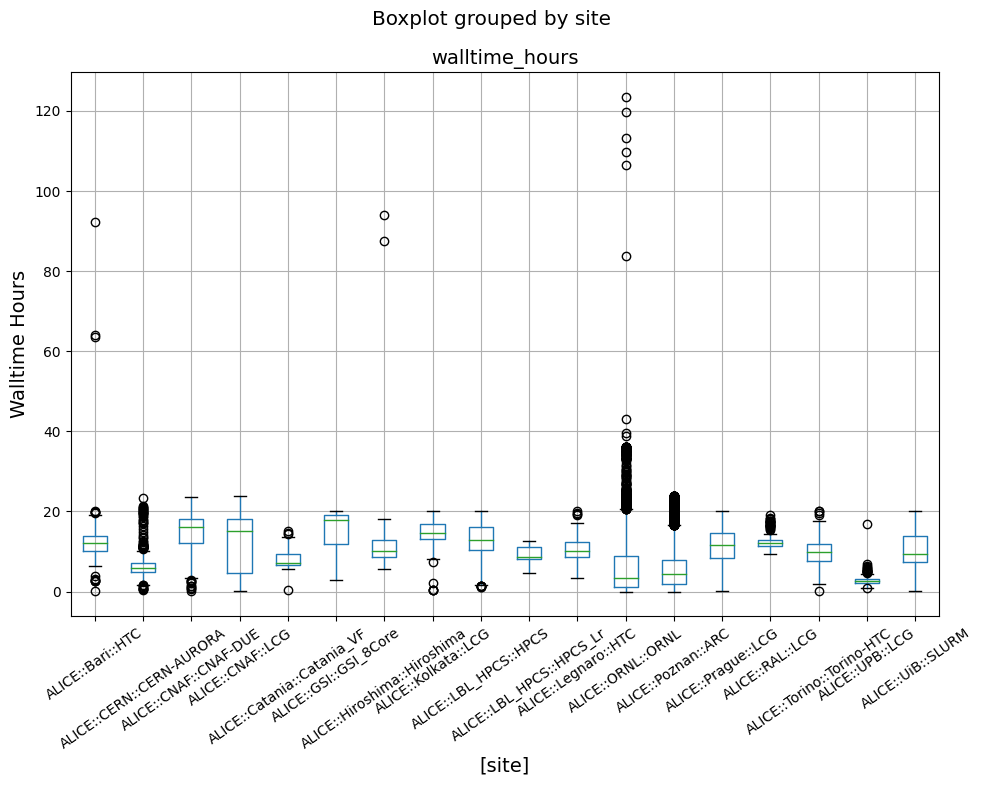

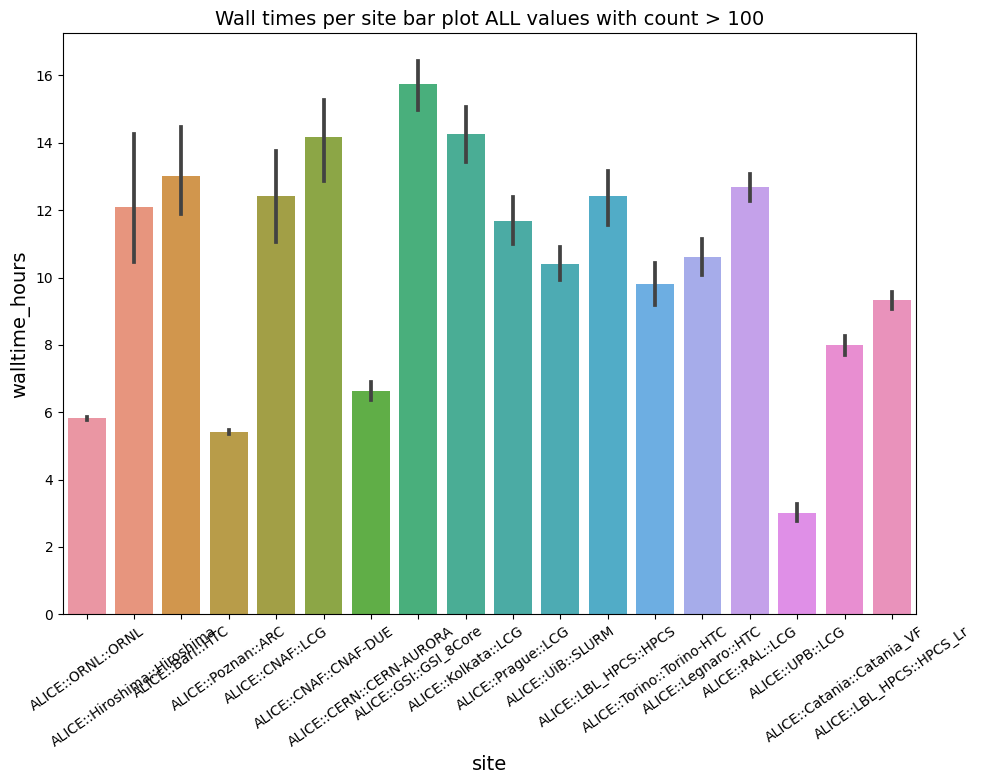

In [28]:
# walltime hours per host 


# job_info_with_trace.head()

# job_info_with_trace_with_delay['walltime_hours'].head()

draw_boxplot_gruped_by_field(job_info_with_trace_with_delay, 'host')
draw_boxplot_gruped_by_field(job_info_with_trace_with_delay, 'site')


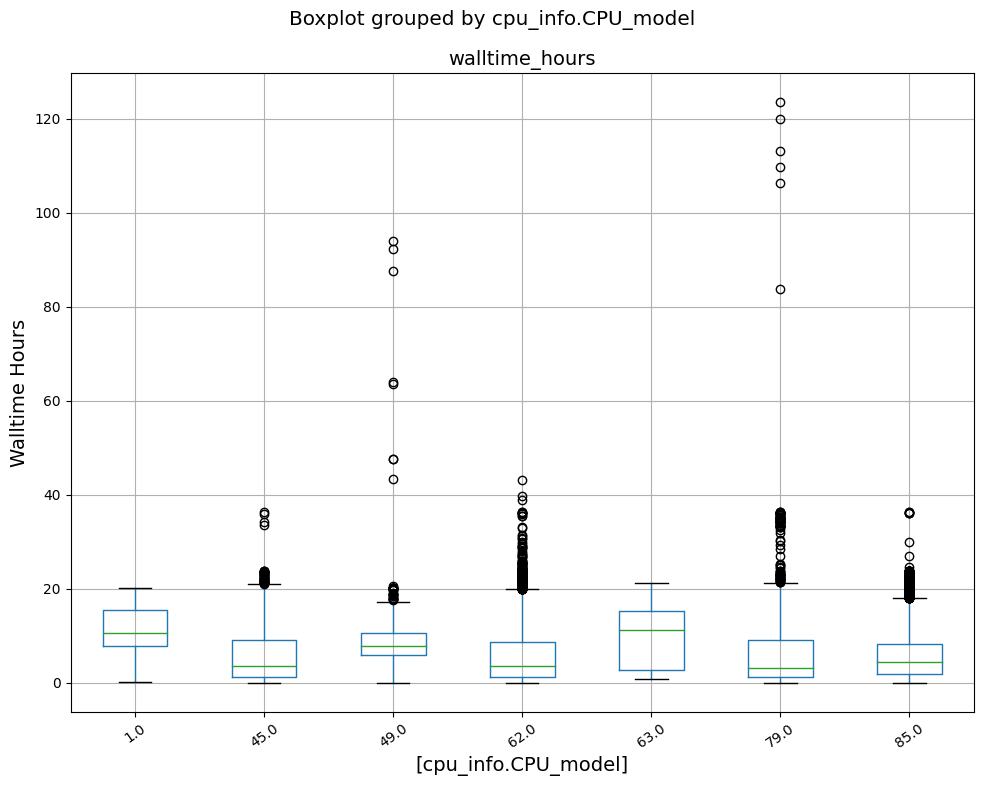

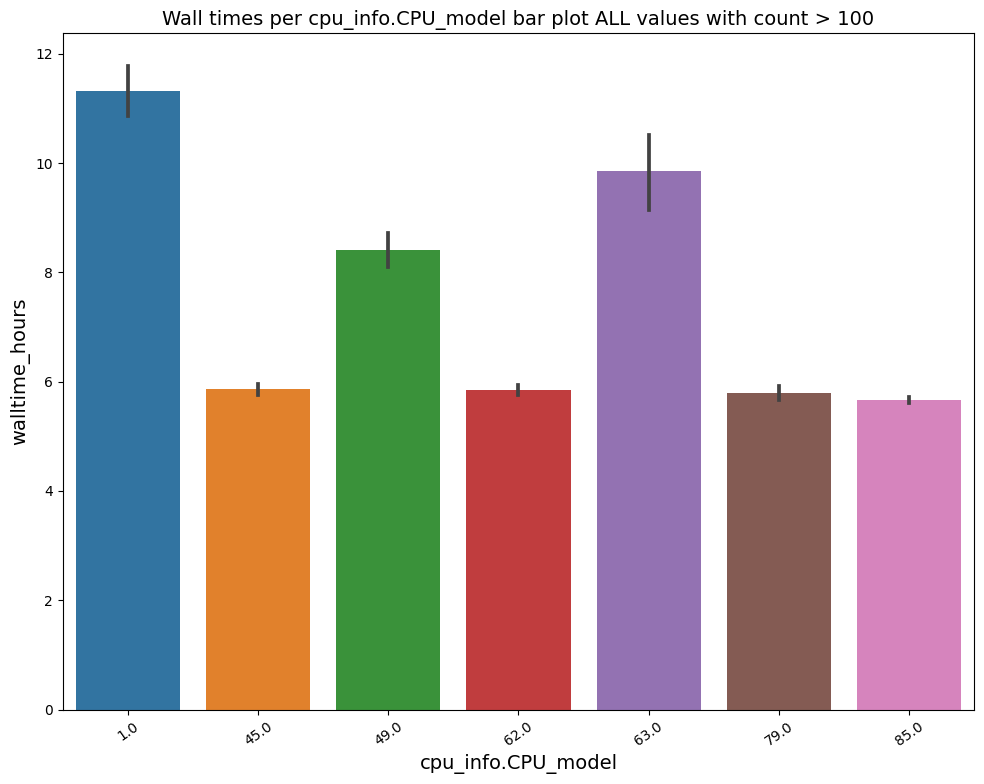

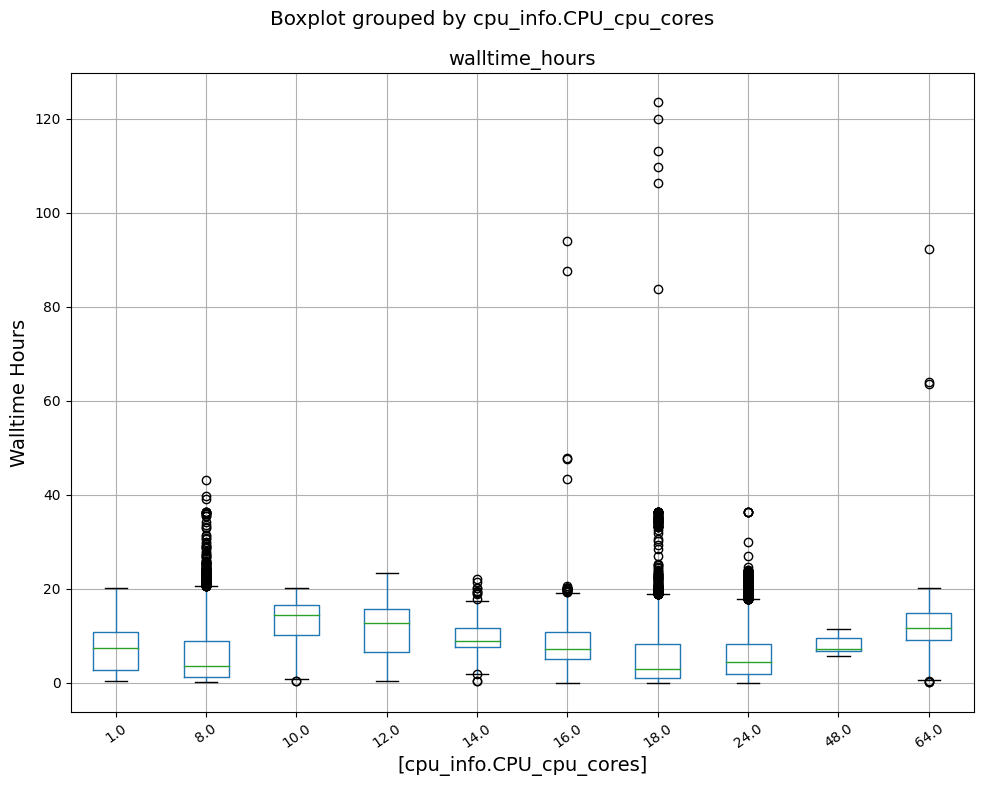

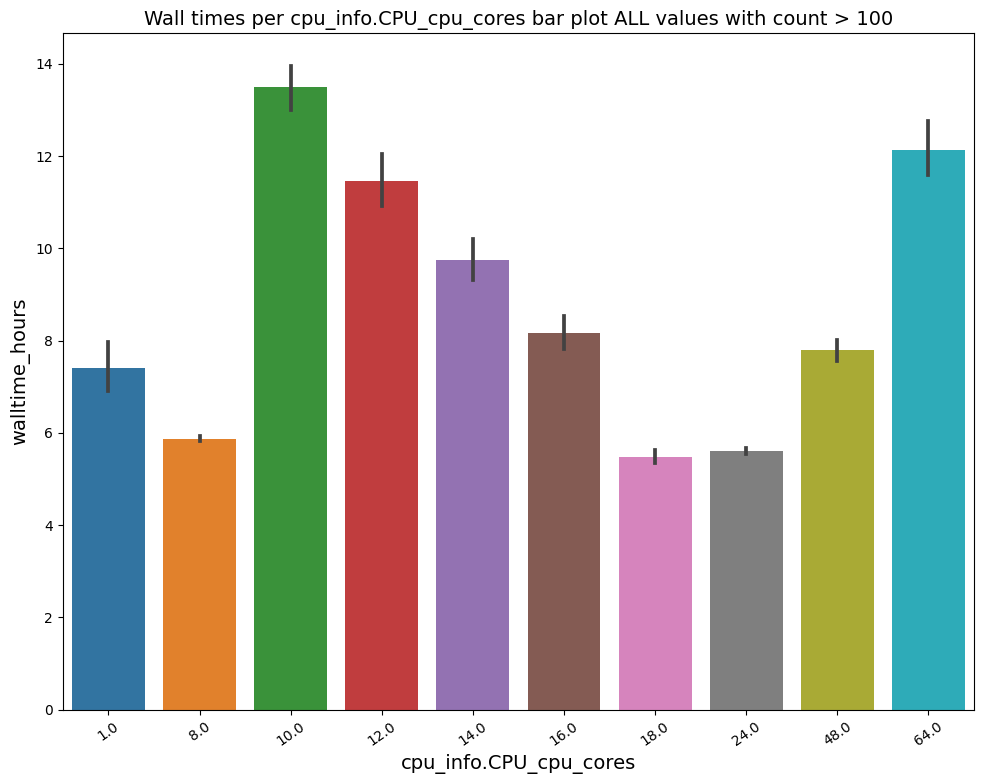

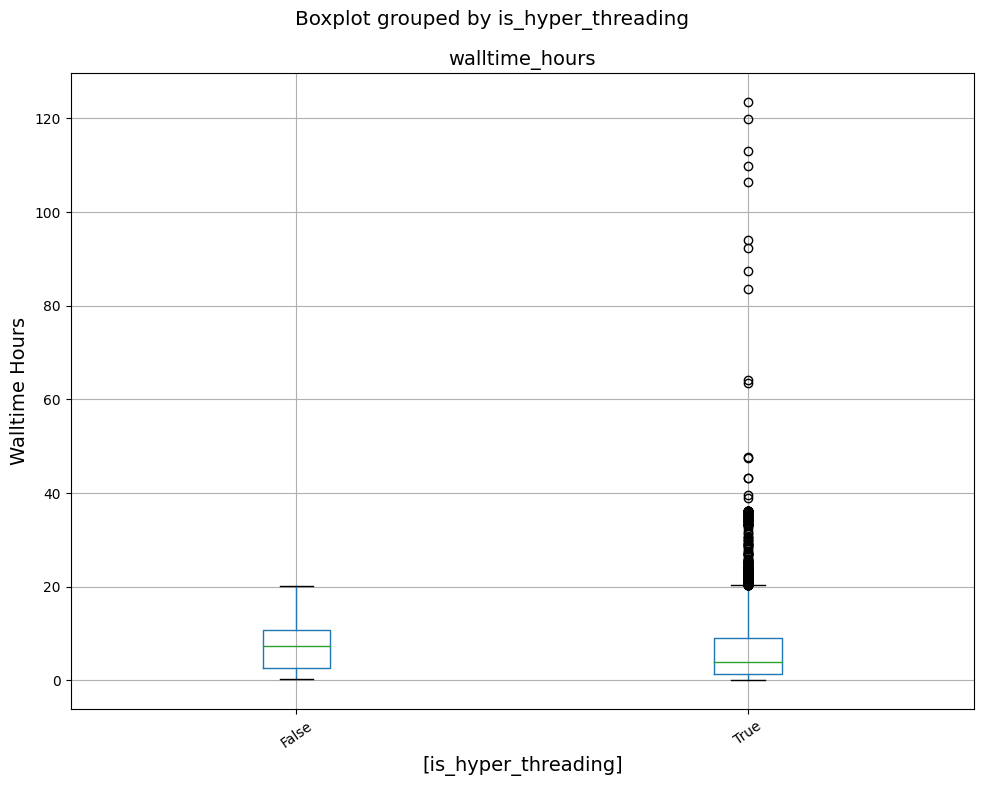

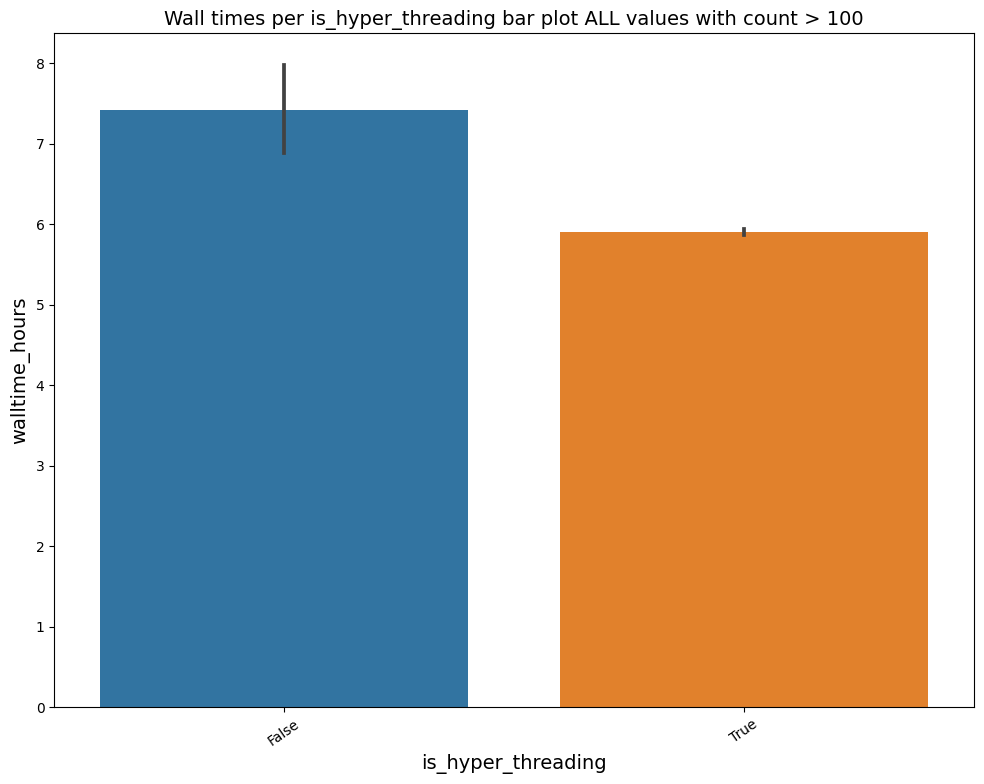

In [29]:

job_info_with_trace_with_delay_with_host = job_info_with_trace_with_delay.set_index("host", drop = False).join(hosts_parsed.set_index('hostname'), how='inner').reset_index()

draw_boxplot_gruped_by_field(job_info_with_trace_with_delay_with_host, 'cpu_info.CPU_model')

draw_boxplot_gruped_by_field(job_info_with_trace_with_delay_with_host, 'cpu_info.CPU_cpu_cores')

draw_boxplot_gruped_by_field(job_info_with_trace_with_delay_with_host, 'is_hyper_threading')

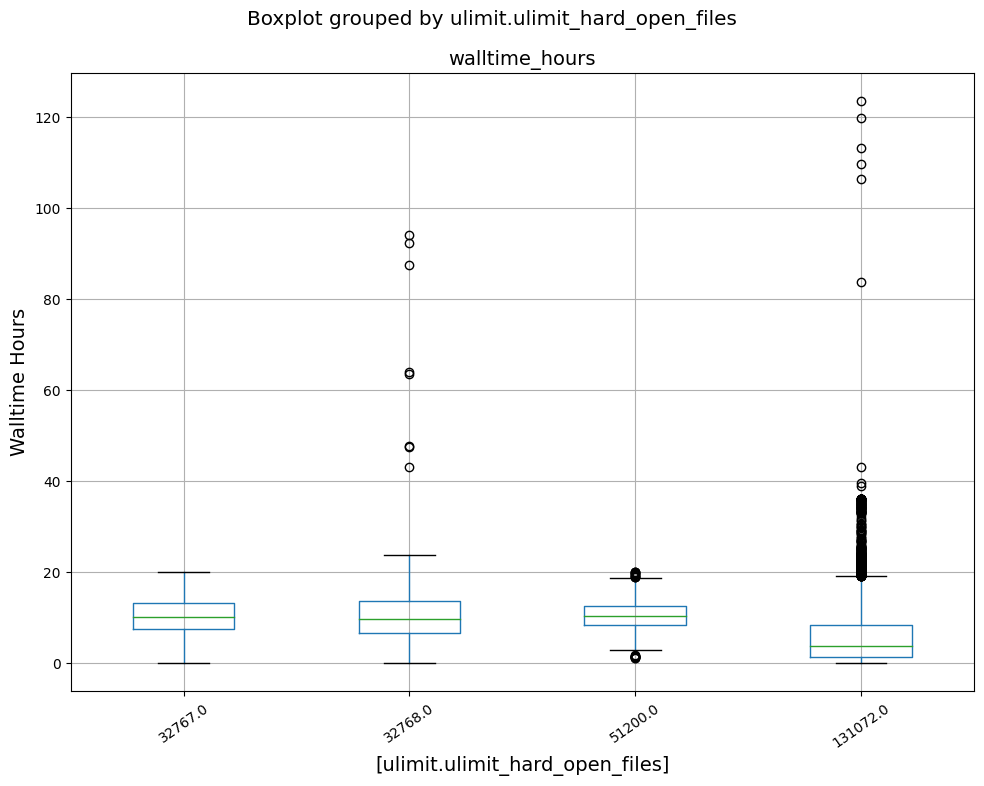

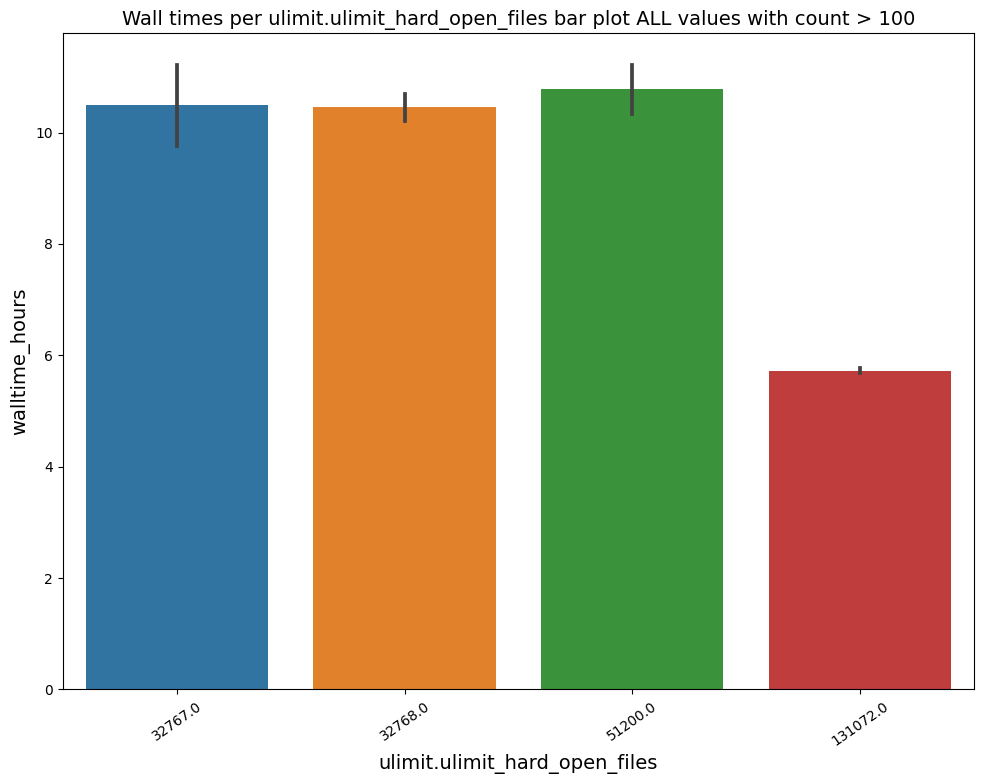

In [30]:
draw_boxplot_gruped_by_field(job_info_with_trace_with_delay_with_host, 'ulimit.ulimit_hard_open_files')

In [31]:

# per category aliprod,27408 

job_info_with_trace_per_category = job_info_with_trace_with_delay_with_host.where(job_info_with_trace.User == 'aliprod').where(job_info_with_trace.lpmjobtypeid == 27408)


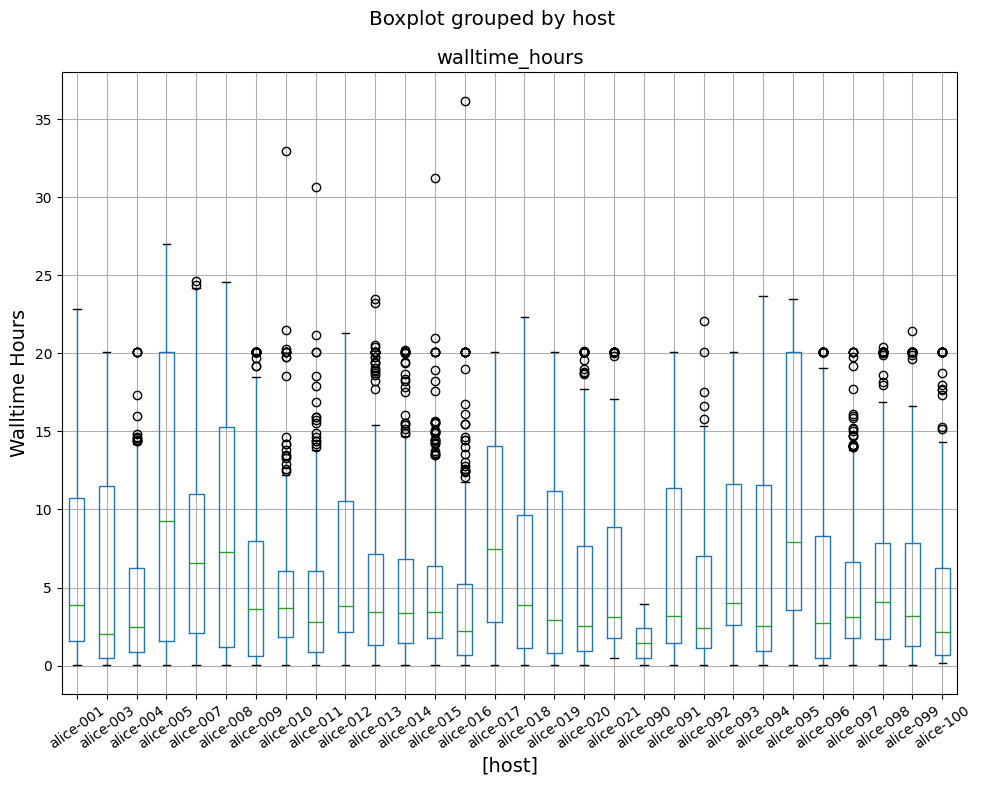

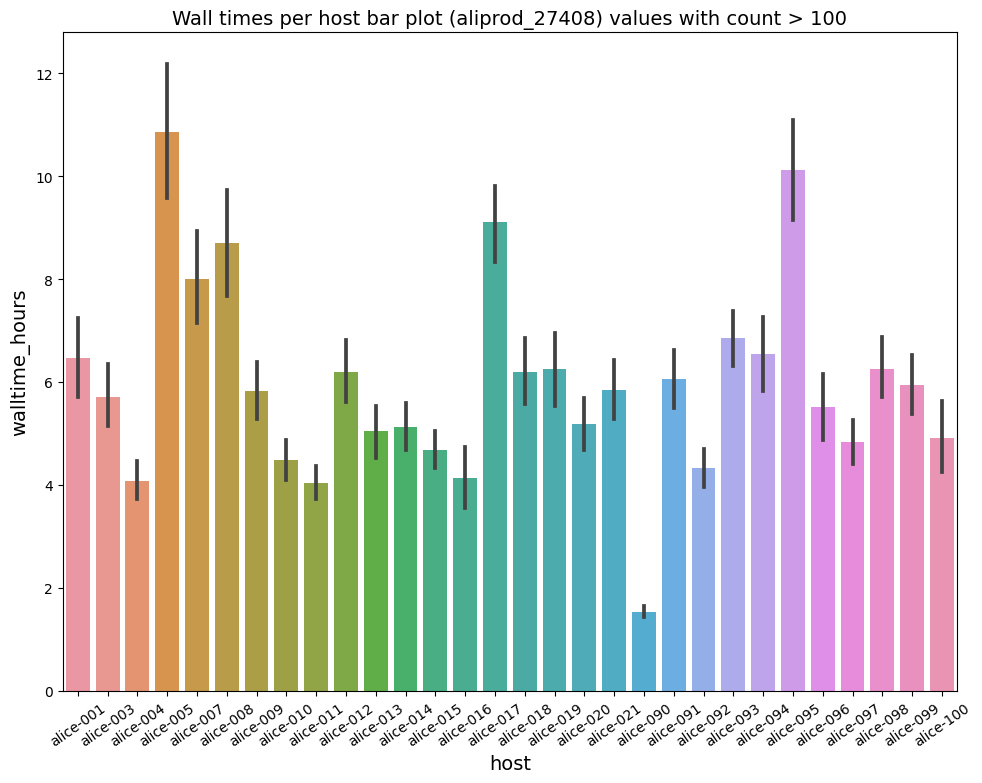

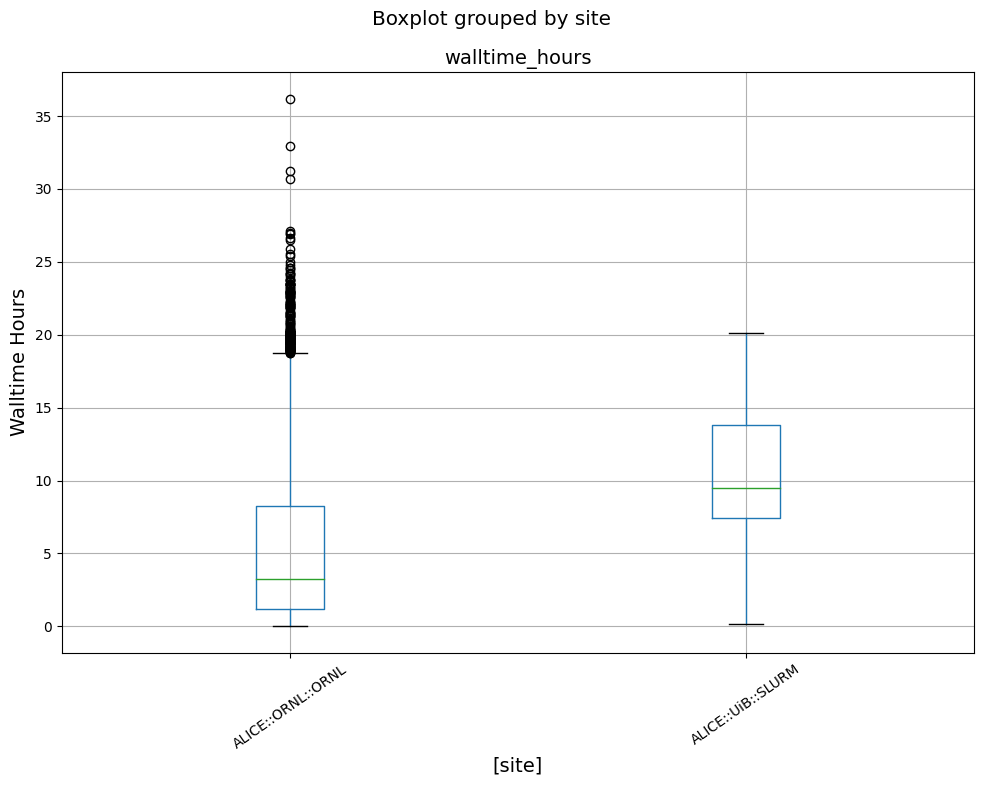

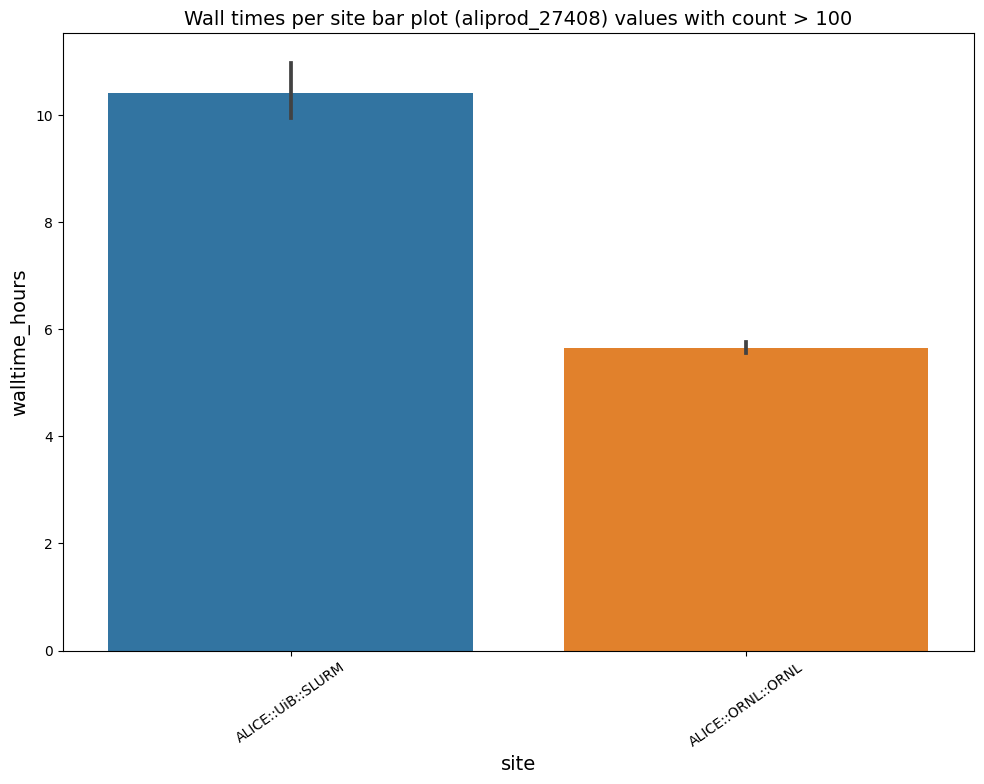

In [32]:

# job_info_with_trace.head()
draw_boxplot_gruped_by_field(job_info_with_trace_per_category, 'host', "(aliprod_27408)")

draw_boxplot_gruped_by_field(job_info_with_trace_per_category, 'site', "(aliprod_27408)")


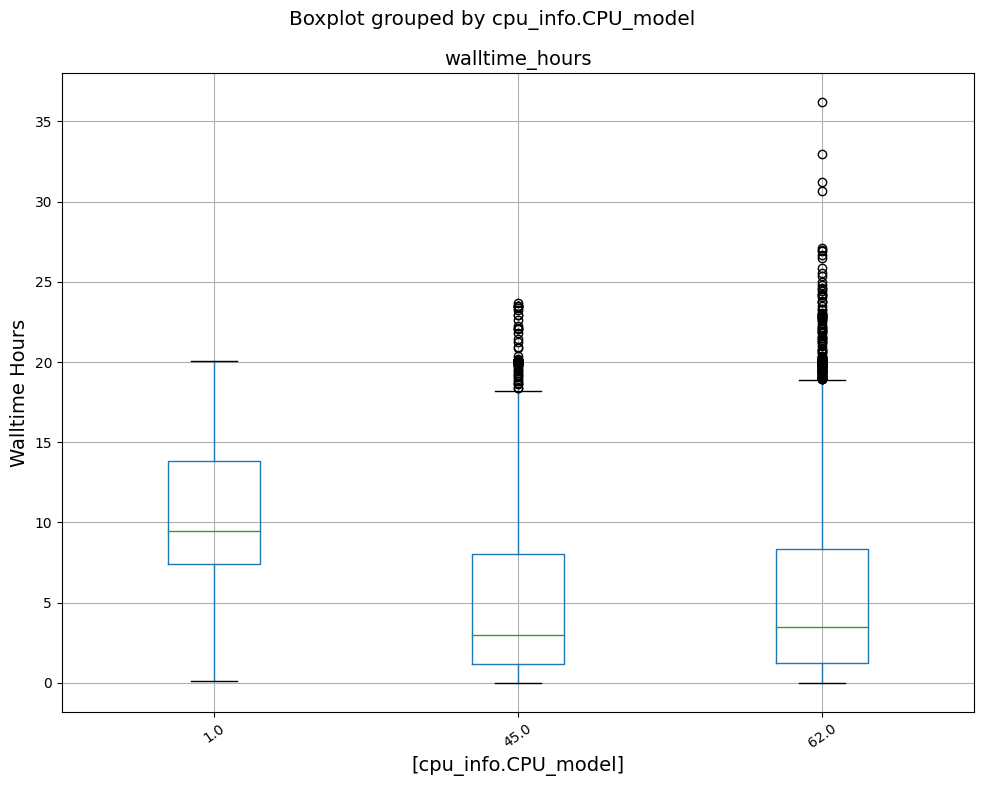

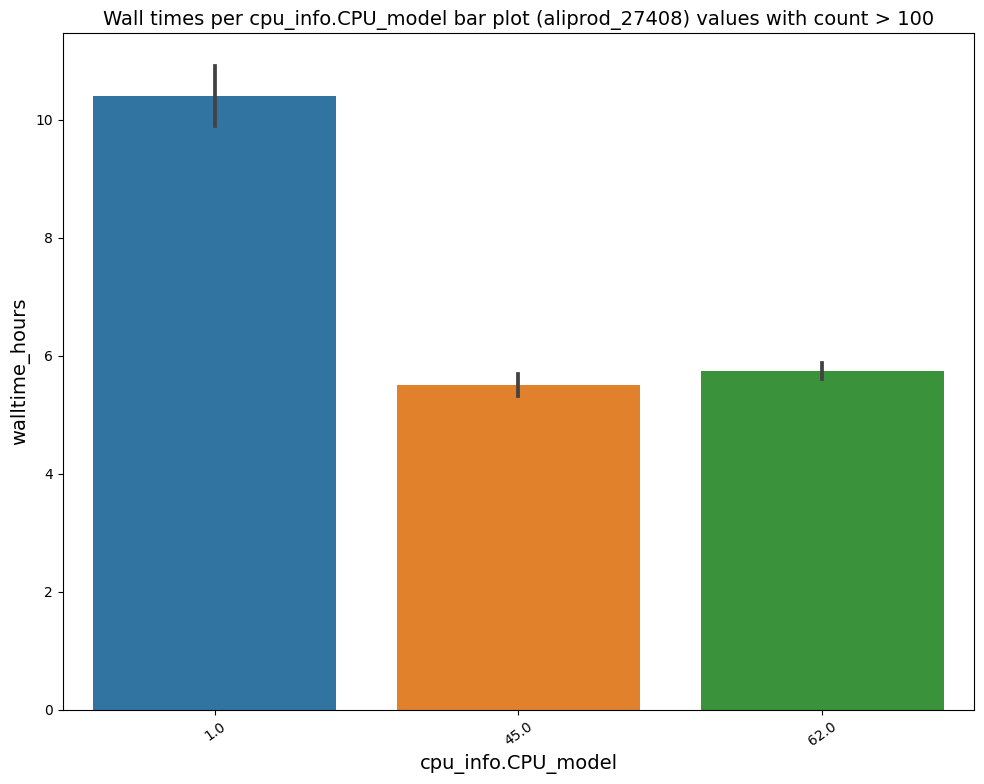

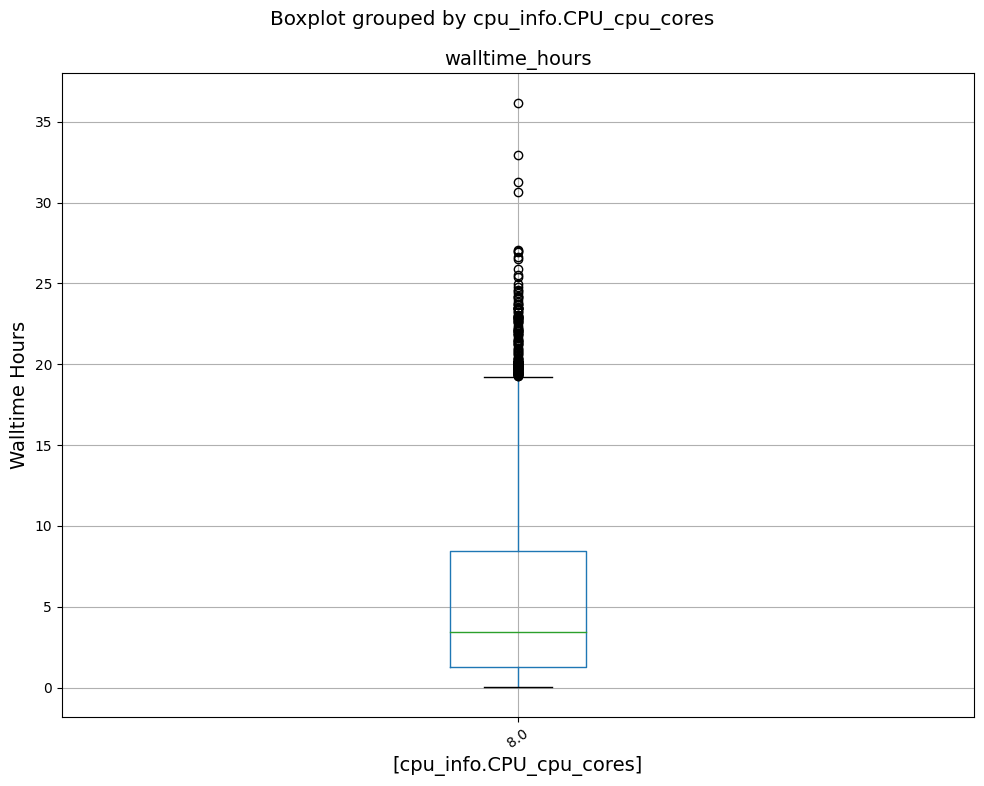

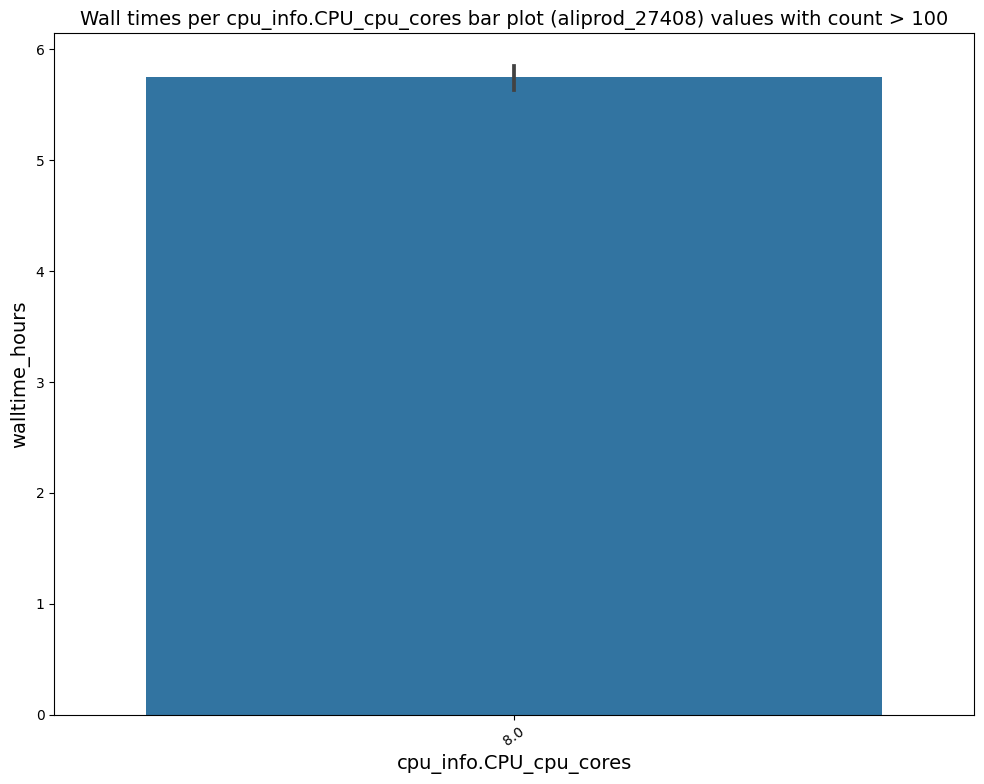

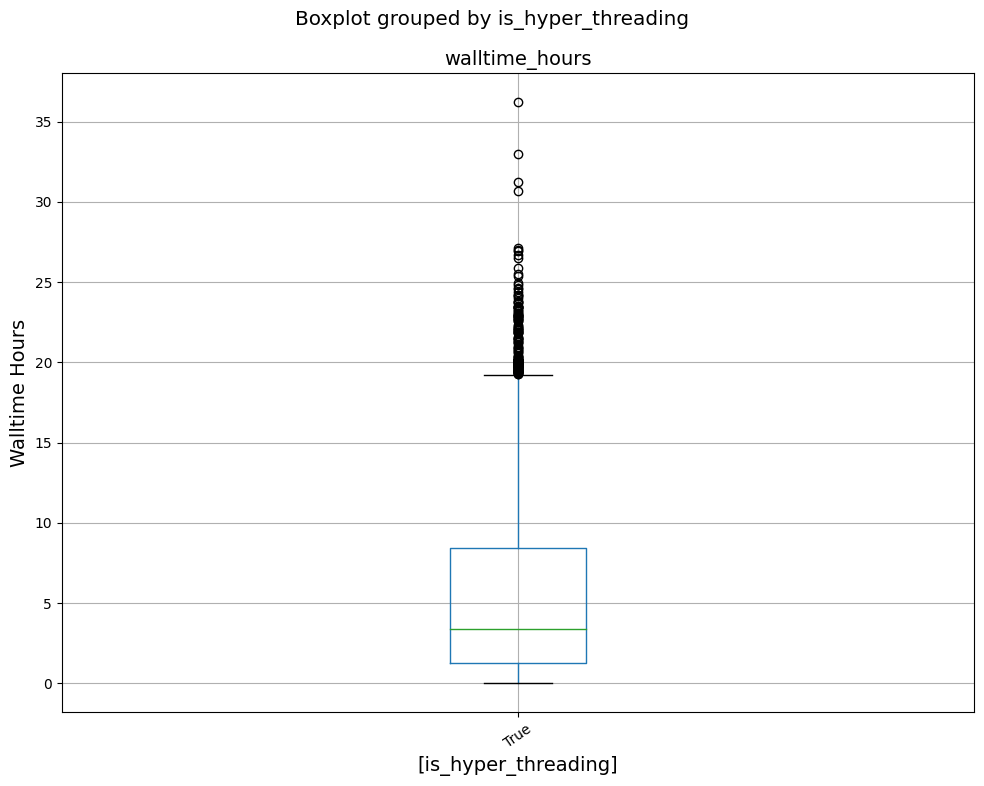

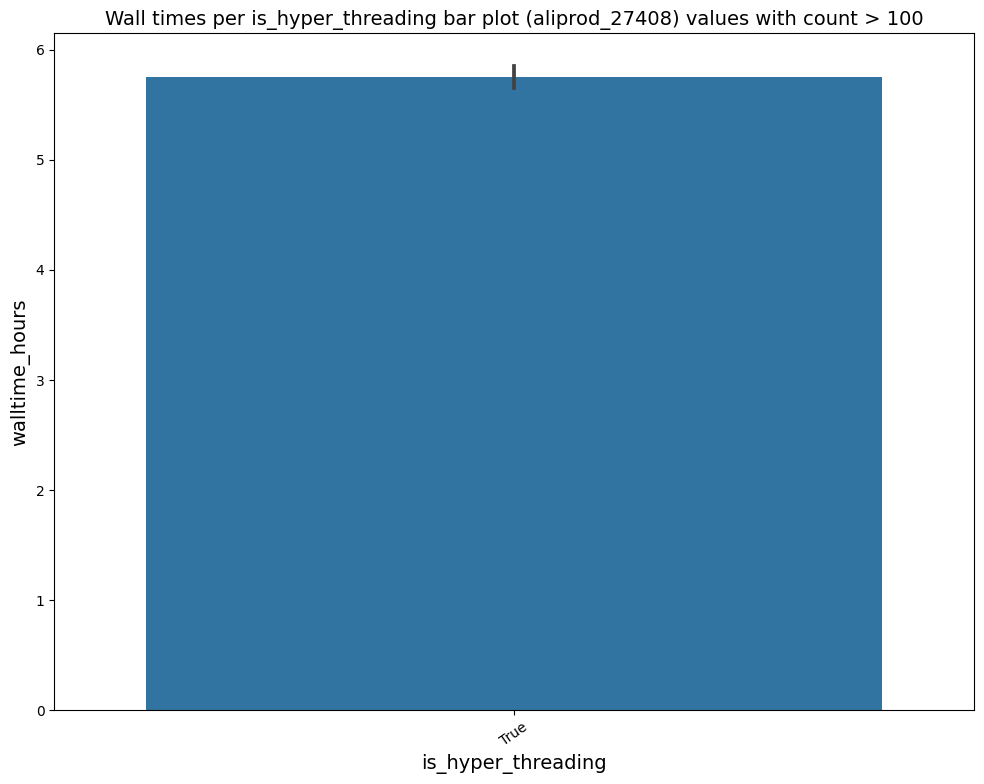

In [33]:


draw_boxplot_gruped_by_field(job_info_with_trace_per_category, 'cpu_info.CPU_model', "(aliprod_27408)")

draw_boxplot_gruped_by_field(job_info_with_trace_per_category, 'cpu_info.CPU_cpu_cores', "(aliprod_27408)")

draw_boxplot_gruped_by_field(job_info_with_trace_per_category, 'is_hyper_threading', "(aliprod_27408)")


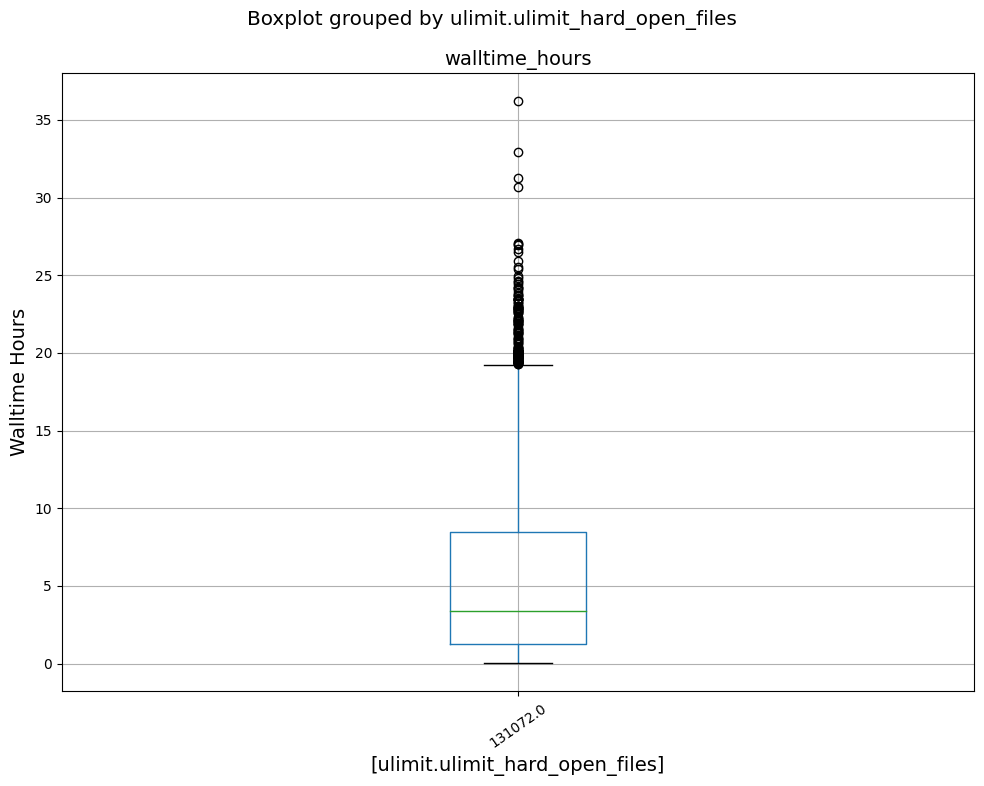

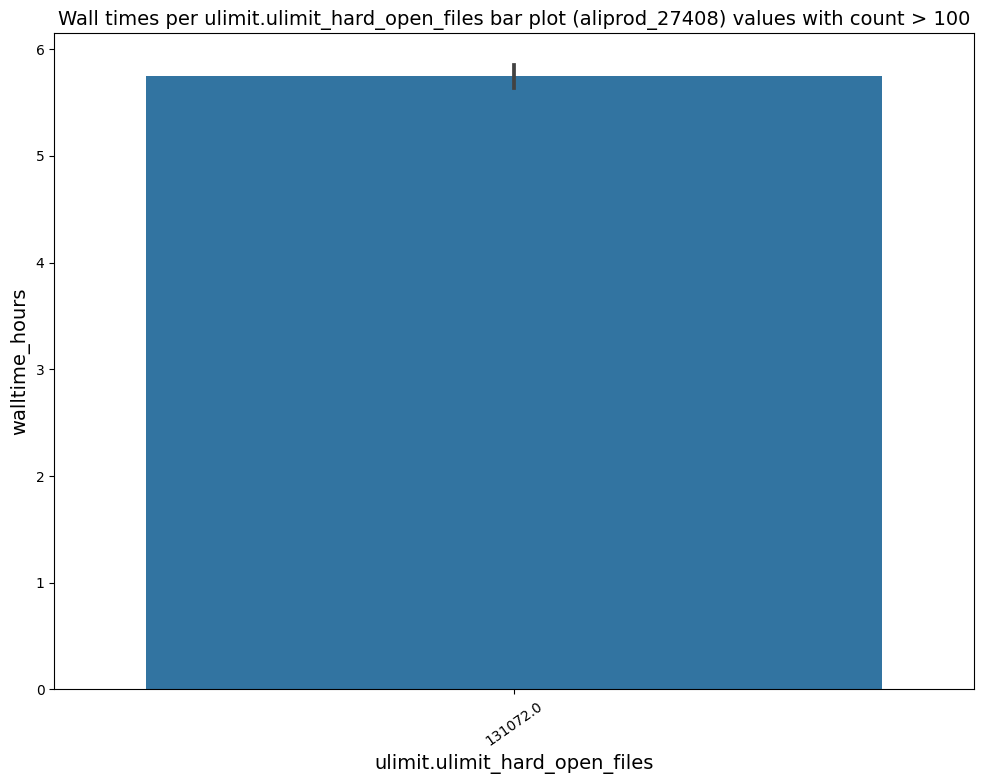

In [34]:
draw_boxplot_gruped_by_field(job_info_with_trace_per_category, 'ulimit.ulimit_hard_open_files', "(aliprod_27408)")

In [35]:
# Get the numeric column names as a list
num_cols = list(hosts_parsed.select_dtypes(include=['number']).columns)

# TODO if you want to draw distribution for all site fields
# # Print the numeric column names and data types
# for col in num_cols:
#     print(f'{col}: {hosts_parsed[col].dtype}')
#     draw_boxplot_gruped_by_field(job_info_with_trace_per_category, col, "(aliprod_27408)")

In [36]:
# use 10 splits for cross-validation

from sklearn.model_selection import StratifiedShuffleSplit

job_info_with_trace_with_delay = job_info_with_trace_with_delay[job_info_with_trace_with_delay['walltime_hours'].notna()]

strat_train_set, strat_test_set = train_test_split(
    job_info_with_trace_with_delay, test_size=0.2, random_state=42)



In [37]:
strat_test_set["walltime_hours_cat"].value_counts() / len(strat_test_set)

1    0.562349
2    0.214667
3    0.137333
4    0.045397
5    0.038349
6    0.000762
Name: walltime_hours_cat, dtype: float64

In [38]:
# map to number values
# mon_jdls['InputFileSize'] = mon_jdls.InputFile.apply(lambda x: len(x))
job_info_with_trace_with_delay['MemorySize_GB'] = job_info_with_trace_with_delay.MemorySize.str.extract('(\d+)').astype(float)
job_info_with_trace_with_delay['CPUCores_number'] = job_info_with_trace_with_delay.CPUCores.astype(int)

# drop records with NaNs
job_info_with_trace_with_delay = job_info_with_trace_with_delay[job_info_with_trace_with_delay['CPUCores_number'].notna()]
job_info_with_trace_with_delay = job_info_with_trace_with_delay[job_info_with_trace_with_delay['MemorySize_GB'].notna()]


# todo extract
# mon_jdls['WorkDirectorySize_MB'] = mon_jdls.WorkDirectorySize.apply(lambda x: x[0].extract('(\d+)'))

job_info_with_trace_with_delay.info()

job_info_with_trace_with_delay['MemorySize_GB'].sort_values()

# todo which other values we can extract?

# mon_jdls.plot.scatter(grid=True, x='InputFileSize', y="MemorySize", alpha=0.2)
# plt.show()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 78747 entries, 58746 to 63751
Columns: 118 entries, job_id to CPUCores_number
dtypes: category(1), datetime64[ns](1), float64(17), int32(1), int64(13), object(85)
memory usage: 70.7+ MB


76103       2.0
72170       2.0
63751       8.0
66878       8.0
11660       8.0
          ...  
39009    1000.0
40009    1000.0
40741    1000.0
21200    1000.0
27632    1000.0
Name: MemorySize_GB, Length: 78747, dtype: float64

In [39]:
# find correlations:
#  Na slacku pisałem o VIF: Zerknij na współczynnik Variance Inflation Factor (VIF) - pozwala wyłowić korelację między wieloma zmiennymi. 
# W Pythonie dostępna w pakiecie statsmodels (statsmodels.stats.outliers_influence.variance_inflation_factor).  Tu więcej na ten temat: https://towardsdatascience.com/targeting-multicollinearity-with-python-3bd3b4088d0b
#  Ale też jakieś proste macierze korelacji: Feature Selection with sklearn and Pandas | by Abhini Shetye | Towards Data Science

corr_matrix = job_info_with_trace_with_delay.corr()

corr_matrix.head

corr_matrix["Price"].sort_values(ascending=False)




Price                                  1.000000
TTL                                    0.322235
requestedttl                           0.321557
finaltimestamp                         0.104814
laststatuschangetimestamp              0.104808
savingtimestamp                        0.104806
cputime                                0.101119
startedtimestamp                       0.093564
delay_submission_to_final_minutes      0.088980
delay_submission_to_final              0.088980
delay_submission_to_final_hours        0.088980
job_id                                 0.071511
pid                                    0.071511
job_submit_timestamp                   0.070484
delay_submission_to_started_minutes    0.069693
delay_submission_to_started            0.069693
delay_submission_to_started_hours      0.069693
walltime_minutes                       0.053643
walltime                               0.053643
walltime_hours                         0.053643
aliencpuefficiency                     0

In [40]:
# cpu cores

# job_info_with_trace_with_delay.head()
# hosts_parsed['get_jdl_cores.ALIEN_JDL_CPUCORES'].head()


mon_jdls.groupby(['CPUCores'])['CPUCores'].count().sort_values(ascending=False) 





CPUCores
1    84704
2    11409
8       62
Name: CPUCores, dtype: int64

In [41]:
job_info_with_trace_with_delay['host'].head(10)

# job_info_with_trace_with_delay["host"].value_counts().sort_index().plot.bar(rot=45, grid=True)
# plt.xlabel("host")
# plt.ylabel("number of jobs")
# save_fig("number of jobs per host")  # extra code
# plt.show()


58746                      alice-cray016
58748                      alice-cray016
58768                      alice-cray012
58747                      alice-cray016
58753                      alice-cray012
58751    qx314.aligrid.hiroshima-u.ac.jp
58767         wn-7-6-28.recas.ba.infn.it
58752    qx314.aligrid.hiroshima-u.ac.jp
58766                      alice-cray012
58769          wn-8-8-7.recas.ba.infn.it
Name: host, dtype: object

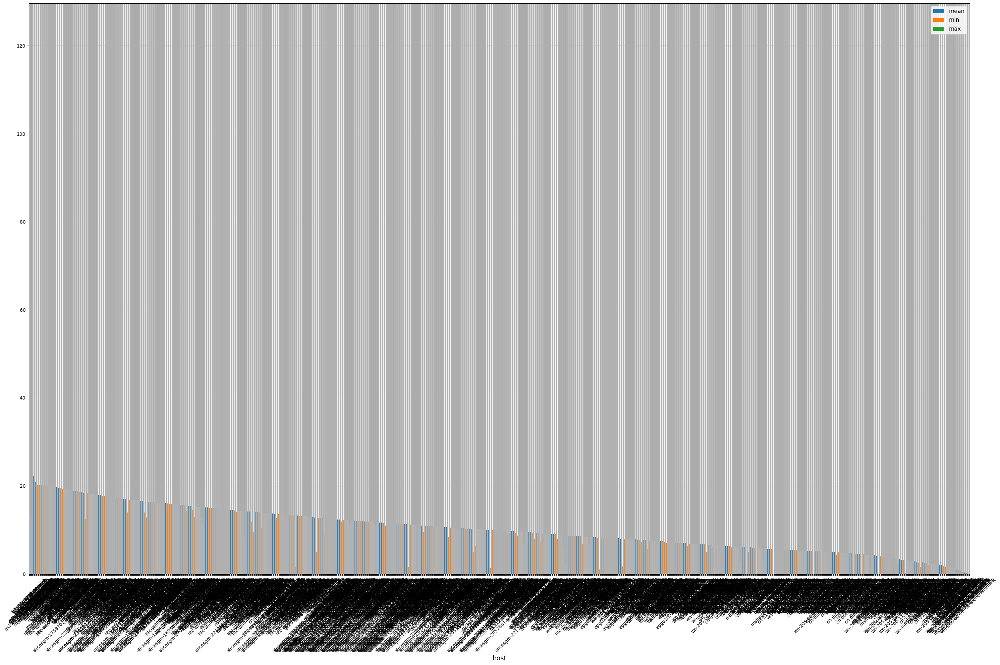

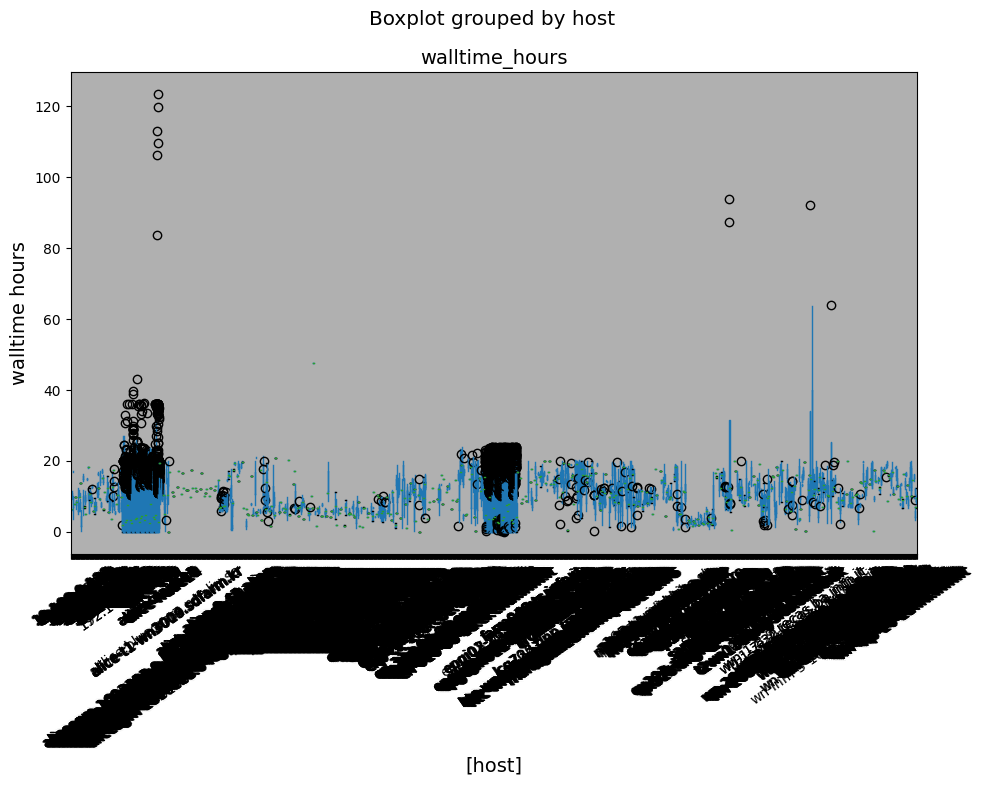

In [42]:
job_info_walltime_per_host = job_info_with_trace_with_delay.groupby(['host'])['walltime_hours'].agg(['mean', 'min', 'max'])\
.sort_values(['mean'], ascending=False) 


job_info_walltime_per_host.plot.bar(figsize=(30,20), rot=45, grid=True)
save_fig("mean_walltime_per_host [HOURS]")


fig, ax = plt.subplots(figsize=(10,8))
plt.suptitle('walltime_per_host')
ax.set_xlabel('host')
ax.set_ylabel('walltime hours')
job_info_with_trace_with_delay.boxplot(figsize=(50,50), by=['host'], column=['walltime_hours'], ax=ax, rot=35)
save_fig("walltime_per_host [Hours]")

In [43]:
job_info_with_trace_with_delay

,job_id,jdl_set,trace_set,status,job_submit_timestamp,last_update,aliencpuefficiency,cputime,host,maxrss,...,delay_submission_to_final_hours,delay_submission_to_started,delay_submission_to_started_minutes,delay_submission_to_started_hours,walltime_minutes,walltime_hours,walltime_hours_cat,job_submit_timestamp_date_time,MemorySize_GB,CPUCores_number
58746,2.808882e+09,t,t,DONE,1.677254e+09,2023-02-28 07:05:11.477423,85.36,379357.28,alice-cray016,16840704,...,86.316111,255151000.0,4252.516667,70.875278,7407.266667,123.454444,6,2023-02-24 15:52:16,64.0,8
58748,2.808882e+09,t,t,DONE,1.677254e+09,2023-02-28 06:23:54.055184,87.31,376572.78,alice-cray016,16650240,...,85.854722,255171000.0,4252.850000,70.880833,7188.633333,119.810556,6,2023-02-24 15:52:19,64.0,8
58768,2.808883e+09,t,t,DONE,1.677254e+09,2023-02-28 06:29:56.89394,93.93,382509.44,alice-cray012,15569920,...,85.435833,256678000.0,4277.966667,71.299444,6787.433333,113.123889,6,2023-02-24 15:52:30,64.0,8
58747,2.808882e+09,t,t,DONE,1.677254e+09,2023-02-28 06:20:45.689934,86.44,341504.25,alice-cray016,15580160,...,84.592222,255154000.0,4252.566667,70.876111,6584.316667,109.738611,6,2023-02-24 15:52:17,64.0,8
58753,2.808882e+09,t,t,DONE,1.677254e+09,2023-02-28 06:22:26.113211,92.60,354642.88,alice-cray012,17556480,...,84.205833,255281000.0,4254.683333,70.911389,6382.883333,106.381389,6,2023-02-24 15:52:22,64.0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60674,2.809055e+09,t,t,DONE,1.677267e+09,2023-02-26 14:37:40.882975,-1.00,-1.00,alice.bluegrass.nsc.liu.se,-1,...,57.105833,148779000.0,2479.650000,41.327500,-0.016667,-0.000278,NaN,2023-02-24 19:21:50,8.0,1
16425,2.806386e+09,t,t,DONE,1.676918e+09,2023-02-21 22:03:49.013917,-1.00,-1.00,alice.bluegrass.nsc.liu.se,-1,...,41.562222,93269000.0,1554.483333,25.908056,-0.016667,-0.000278,NaN,2023-02-20 18:27:16,8.0,1
58179,2.808851e+09,t,t,DONE,1.677241e+09,2023-02-25 15:36:26.417593,-1.00,-1.00,alice.bluegrass.nsc.liu.se,-1,...,28.082778,93139000.0,1552.316667,25.871944,-0.016667,-0.000278,NaN,2023-02-24 12:17:00,8.0,1
3885,2.805802e+09,t,t,DONE,1.676808e+09,2023-02-20 16:09:07.734125,-1.00,-1.00,alice.bluegrass.nsc.liu.se,-1,...,34.676944,93110000.0,1551.833333,25.863889,-0.016667,-0.000278,NaN,2023-02-19 11:57:58,8.0,1


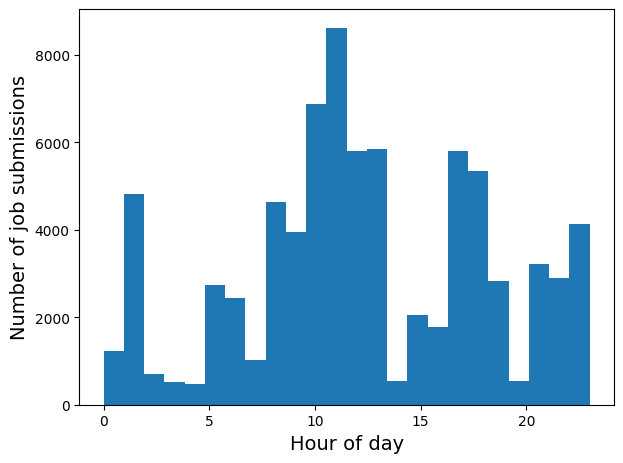

In [44]:
# draw time patterns
job_info_with_trace_with_delay['job_submit_timestamp_date_time'] = pd.to_datetime(job_info_with_trace_with_delay['job_submit_timestamp'], unit='s')

job_info_with_trace_with_delay['hour'] = job_info_with_trace_with_delay['job_submit_timestamp_date_time'].dt.hour

plt.hist(job_info_with_trace_with_delay['hour'], bins=24)
plt.xlabel('Hour of day')
plt.ylabel('Number of job submissions')
save_fig("number_of_jobs_histogram_per_hour")
plt.show()



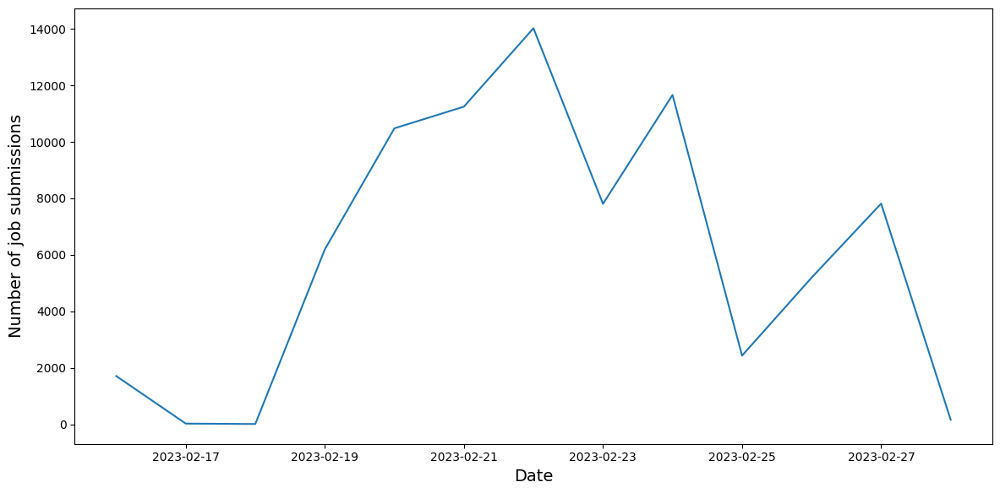

In [45]:
import pandas as pd
import matplotlib.pyplot as plt


# create a new DataFrame with a copy of the submit_time column
new_df = pd.DataFrame(job_info_with_trace_with_delay['job_submit_timestamp_date_time'])

# add new columns to the new DataFrame for year, month, and day
new_df['year'] = new_df['job_submit_timestamp_date_time'].dt.year
new_df['month'] = new_df['job_submit_timestamp_date_time'].dt.month
new_df['day'] = new_df['job_submit_timestamp_date_time'].dt.day

# group the DataFrame by year, month, and day and count the number of submissions for each day
grouped_df = new_df.groupby(['year', 'month', 'day']).size().reset_index(name='count')

# set the index of the DataFrame to the datetime object representing the job submission date
grouped_df = grouped_df.set_index(pd.to_datetime(grouped_df[['year', 'month', 'day']]))

# drop the year, month, and day columns from the DataFrame
grouped_df = grouped_df.drop(columns=['year', 'month', 'day'])

# plot the number of submissions by date
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(grouped_df.index, grouped_df['count'])
ax.set_xlabel('Date')
ax.set_ylabel('Number of job submissions')
save_fig("number of jobs per date")
plt.show()

# grouped_df




In [46]:
job_info_with_trace_with_delay[(job_info_with_trace_with_delay['host'] == "lxbk1154.gsi.de")].count()


job_id                            7
jdl_set                           7
trace_set                         7
status                            7
job_submit_timestamp              7
                                 ..
walltime_hours_cat                7
job_submit_timestamp_date_time    7
MemorySize_GB                     7
CPUCores_number                   7
hour                              7
Length: 119, dtype: int64

In [47]:
hosts_parsed['hostname'].head(10)

0      t2-cwn-097.to.infn.it
1         b7s05p0547.cern.ch
2      t2-cwn-026.to.infn.it
3         b7s08p3733.cern.ch
4            grid310.kfki.hu
5    epgg05-00.ph.bham.ac.uk
6         b7s03p6566.cern.ch
7              twin110.alice
8         b7s02p3502.cern.ch
9         b7s02p0106.cern.ch
Name: hostname, dtype: object

In [48]:
hosts_parsed.groupby(['os.OS_REDHAT_SUPPORT_PRODUCT_VERSION'])['os.OS_REDHAT_SUPPORT_PRODUCT_VERSION'].count()

os.OS_REDHAT_SUPPORT_PRODUCT_VERSION
7      5954
7.9    1549
8        24
8.7     330
Name: os.OS_REDHAT_SUPPORT_PRODUCT_VERSION, dtype: int64

In [49]:
hosts_parsed.where(hosts_parsed['host_id'] == 493376228).count()


host_id                                     1
hostname                                    1
ce_name                                     1
addr                                        1
last_updated                                1
                                           ..
os.OS_ALMALINUX_MANTISBT_PROJECT            0
os.OS_ALMALINUX_MANTISBT_PROJECT_VERSION    0
os.OS_ROCKY_SUPPORT_PRODUCT                 1
os.OS_ROCKY_SUPPORT_PRODUCT_VERSION         1
is_hyper_threading                          1
Length: 264, dtype: int64

In [50]:
hosts_parsed.groupby(['hostname'])['hostname'].count()

hostname
10.109.0.100    1
10.109.0.101    1
10.109.0.104    1
10.109.0.105    1
10.109.0.107    1
               ..
xwin01.alice    1
xwin05.alice    1
xwin07.alice    1
xwin10.alice    1
xwin11.alice    1
Name: hostname, Length: 8070, dtype: int64

In [51]:
job_info_with_trace_with_delay_with_host = job_info_with_trace_with_delay.set_index("host", drop = False).join(hosts_parsed.set_index('hostname'), how='inner').reset_index()

# job_info_with_trace_with_delay_with_host.count()


In [52]:
corr_matrix = job_info_with_trace_with_delay_with_host.corr()

corr_matrix.head

corr_matrix["walltime_hours"].sort_values(ascending=False)

walltime                             1.000000
walltime_hours                       1.000000
walltime_minutes                     1.000000
cputime                              0.872343
delay_submission_to_final_minutes    0.643234
                                       ...   
ram_info.RAM_kB_Hugetlb                   NaN
ram_info.RAM_kB_Zswapped                  NaN
ram_info.RAM_kB_FileHugePages             NaN
ram_info.RAM_kB_FilePmdMapped             NaN
ram_info.RAM_kB_SecPageTables             NaN
Name: walltime_hours, Length: 216, dtype: float64

In [53]:
# clean the data

from sklearn.model_selection import train_test_split


train_set, test_set = train_test_split(job_info_with_trace_with_delay, test_size=0.2, random_state=42)
train_set.head()

job_info_with_trace_with_delay_without_label = train_set.drop("walltime_hours", axis=1)
job_info_with_trace_with_delay_labels = test_set["walltime_hours"].copy()

# median = job_info_with_trace_with_delay_without_label["InputFileSize"].median()  # option 3
# job_info_with_trace_with_delay_without_label["InputFileSize"].fillna(median, inplace=True)
# job_info_with_trace_with_delay_without_label.head()

job_info_with_trace_with_delay["status"].fillna('RUNNING', inplace=True)


from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy="median")

job_info_with_trace_with_delay_num = job_info_with_trace_with_delay.select_dtypes(include=[np.number])

job_info_with_trace_with_delay_num.info()


imputer.fit(job_info_with_trace_with_delay_num)

job_info_with_trace_with_delay_num.median().values

X = imputer.transform(job_info_with_trace_with_delay_num)


#Scikit-Learn transformers output NumPy arrays (or sometimes SciPy sparse matrices) even when they 
#are fed Pandas DataFrames as input.⁠11 So, the output of imputer.transform(housing_num) is a NumPy array:
#X has neither column names nor index. Luckily, it’s not too hard to wrap X in a DataFrame and 
# recover the column names and index from housing_num:
job_info_with_trace_with_delay_num_tr = pd.DataFrame(X, columns=job_info_with_trace_with_delay_num.columns,
                          index=job_info_with_trace_with_delay_num.index)

# job_info_with_trace_with_delay_num_tr.corr()['status_int'].sort_values(ascending=False)






<class 'pandas.core.frame.DataFrame'>
Int64Index: 78747 entries, 58746 to 63751
Data columns (total 32 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   job_id                               78747 non-null  float64
 1   job_submit_timestamp                 78747 non-null  float64
 2   aliencpuefficiency                   78747 non-null  float64
 3   cputime                              78747 non-null  float64
 4   maxrss                               78747 non-null  int64  
 5   finaltimestamp                       78747 non-null  int64  
 6   masterjobid                          78747 non-null  int64  
 7   pid                                  78747 non-null  int64  
 8   requestedcpus                        78747 non-null  int64  
 9   requestedttl                         78747 non-null  int64  
 10  runningtimestamp                     78747 non-null  int64  
 11  savingtimestamp         

In [54]:
# reload the data

# correlations using Trace data (not mon alice)

job_info_with_trace = job_info.set_index("job_id").join(trace.set_index('job_id'), how='inner')\
.join(mon_jdls.set_index('job_id'), how='inner').reset_index()


# drop columns that are contains all or mostly nulls 
job_info_with_trace = job_info_with_trace.drop(['IterationTimestamp'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['SeNumber'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['OutputErrorE'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['LPMAnchorPassName'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['OCDBReferenceProduction'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['OutputArchive'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['GUIDFile'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['LegoRunPathSubSelection'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['LPMCollectionEntity'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['OutputFileType'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['FilesToCheck'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['LPMHighPriority'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['MasterResubmitThreshold'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['HYRun'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['HYTrain'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['DataframeSize'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['MaxOutputSize'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['CollisionSystem'], axis=1).copy() # drop NANs
# job_info_with_trace = job_info_with_trace.drop(['cpuIsolation'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['MCAnchor'], axis=1).copy() # drop NANs
# job_info_with_trace = job_info_with_trace.drop(['Monitoring'], axis=1).copy() # drop NANs
job_info_with_trace = job_info_with_trace.drop(['MaxInitFailed'], axis=1).copy() # drop NANs

job_info_with_trace = job_info_with_trace.where(job_info_with_trace['finaltimestamp'] > 0).where(job_info_with_trace['startedtimestamp'] > 0)

job_info_with_trace_with_delay = job_info_with_trace.assign(delay_submission_to_final = job_info_with_trace['finaltimestamp'] - (job_info_with_trace['job_submit_timestamp']*1000))

job_info_with_trace_with_delay = job_info_with_trace_with_delay.assign(delay_submission_to_final_minutes = job_info_with_trace_with_delay['delay_submission_to_final'] / 1000 / 60, delay_submission_to_final_hours = job_info_with_trace_with_delay['delay_submission_to_final'] / 1000 / 3600).sort_values(['delay_submission_to_final_minutes'], ascending=True)

job_info_with_trace_with_delay= job_info_with_trace_with_delay.assign(delay_submission_to_started = job_info_with_trace['startedtimestamp'] - (job_info_with_trace['job_submit_timestamp']*1000))

job_info_with_trace_with_delay = job_info_with_trace_with_delay.assign(delay_submission_to_started_minutes = job_info_with_trace_with_delay['delay_submission_to_started'] / 1000 / 60, delay_submission_to_started_hours = job_info_with_trace_with_delay['delay_submission_to_started'] / 1000 / 3600).sort_values(['delay_submission_to_started_minutes'], ascending=True)

job_info_with_trace_with_delay = job_info_with_trace_with_delay.assign(walltime_minutes = job_info_with_trace_with_delay['walltime'] / 60, walltime_hours = job_info_with_trace_with_delay['walltime'] / 3600).sort_values(['walltime_minutes'], ascending=False)

# job_info_with_trace_with_delay.head()


In [55]:
job_info_with_trace_with_delay = job_info_with_trace_with_delay.set_index("host", drop = False).join(hosts_parsed.set_index('hostname'), how='inner').reset_index()

In [56]:
# More correlations on Trace

# find correlations:
#  Na slacku pisałem o VIF: Zerknij na współczynnik Variance Inflation Factor (VIF) - pozwala wyłowić korelację między wieloma zmiennymi. 
# W Pythonie dostępna w pakiecie statsmodels (statsmodels.stats.outliers_influence.variance_inflation_factor).  Tu więcej na ten temat: https://towardsdatascience.com/targeting-multicollinearity-with-python-3bd3b4088d0b
#  Ale też jakieś proste macierze korelacji: Feature Selection with sklearn and Pandas | by Abhini Shetye | Towards Data Science

# https://www.skytowner.com/explore/converting_string_categories_or_labels_to_numeric_values_in_pandas

# trzeba jakoś wektoryzować te atrybuty, które nie są numeryczne 6.2. Feature extraction — scikit-learn 1.1.3 documentation
# https://scikit-learn.org/stable/modules/feature_extraction.html

# [13/11 21:02] Bartosz Baliś
# Może spróbować użyć metodologii z tego artykułu: Targeting Multicollinearity With Python | by Aashish Nair | Towards Data Science
# https://towardsdatascience.com/targeting-multicollinearity-with-python-3bd3b4088d0b
# [13/11 21:04] Bartosz Baliś
# następnie wyrzucają po jednej i znowu liczą VIF dla pozostałych

# job_info_with_trace_with_delay.info(verbose=True, show_counts=True)

job_info_with_trace_with_delay["status"].fillna('RUNNING', inplace=True)
job_info_with_trace_with_delay['status_int'] = pd.Categorical(job_info_with_trace_with_delay['status']).codes
job_info_with_trace_with_delay['MemorySize_GB'] = job_info_with_trace_with_delay.MemorySize.str.extract('(\d+)').astype(float)
job_info_with_trace_with_delay['CPUCores_int'] = pd.Categorical(job_info_with_trace_with_delay['CPUCores']).codes
job_info_with_trace_with_delay['user_int'] = pd.Categorical(job_info_with_trace_with_delay['User']).codes
job_info_with_trace_with_delay['host_int'] = pd.Categorical(job_info_with_trace_with_delay['host']).codes
job_info_with_trace_with_delay['site_int'] = pd.Categorical(job_info_with_trace_with_delay['site']).codes
job_info_with_trace_with_delay['type_int'] = pd.Categorical(job_info_with_trace_with_delay['Type']).codes
job_info_with_trace_with_delay['InputDataList_int'] = pd.Categorical(job_info_with_trace_with_delay['InputDataList']).codes


# the resulting df will have column_name_int with a categorical value
def categorize_string_list(column_name, df):
    df = df.dropna(subset=[column_name]).copy() # TODO decide if to drop NA or will with empty
#     df[[column_name]] = df[[column_name]].fillna('')
    df[column_name+'_joined'] = df[column_name].str.join(",")
    df[column_name+'_int'] = pd.Categorical(df[column_name+'_joined']).codes
    return df


#     df = df.dropna(subset=[column_name]).copy()
#     df.head()
#     df[column_name+'_joined'] = df[column_name].str.join(",")
#     df[column_name+'_int'] = pd.Categorical(df[column_name+'_joined']).codes
#     return df



job_info_with_trace_with_delay = categorize_string_list('InputData', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JobTag', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Packages', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Executable', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Arguments', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('InputFile', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JDLPath', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JDLArguments', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JDLProcessor', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('ValidationCommand', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('OutputDir', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Output', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Requirements', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('WorkDirectorySize', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JDLVariables', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('LPMMetaData', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('LPMInteractionType', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('LPMProductionTag', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('PWG', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Type', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Activity', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('InputDataType', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('InputDataListFormat', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('OrigRequirements', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('RunList', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('MaxWaitingTime', job_info_with_trace_with_delay)


# don't use:
# job_info_with_trace_with_delay = categorize_string_list('LPMAnchorPassName', job_info_with_trace_with_delay) # its empty
# job_info_with_trace_with_delay = categorize_string_list('LPMAnchorPassName', job_info_with_trace_with_delay) # its empty



# job_info_with_trace_with_delay.info(verbose=True, show_counts=True)

job_info_with_trace_with_delay.count()

# vectorize list types
# for (columnName, columnData) in job_info_with_trace_with_delay.iteritems():
#     print('Column Name : ', columnName)
#     print('Column Contents : ', columnData.values)
#     print('is list : ', type(columnData.values) == list)


index                    17675
job_id                   17675
jdl_set                  17675
trace_set                17675
status                   17675
                         ...  
OrigRequirements_int     17675
RunList_joined           17675
RunList_int              17675
MaxWaitingTime_joined    17675
MaxWaitingTime_int       17675
Length: 418, dtype: int64

In [57]:

import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)


job_info_with_trace_with_delay.corr()['delay_submission_to_started_hours'].sort_values(ascending=False)

delay_submission_to_started_hours                     1.000000
delay_submission_to_started                           1.000000
delay_submission_to_started_minutes                   1.000000
delay_submission_to_final_hours                       0.883567
delay_submission_to_final_minutes                     0.883567
delay_submission_to_final                             0.883567
ram_info.RAM_kB_Cached                                0.538771
cvmfs_cache_size.CVMFS_CACHE_SIZE                     0.498065
ram_info.RAM_kB_Committed_AS                          0.477572
ram_info.RAM_kB_Active(file)                          0.467909
ram_info.RAM_kB_Inactive                              0.459486
cpu_info.CPU_cpu_family                               0.452653
ram_info.RAM_kB_Active                                0.450282
ram_info.RAM_kB_PageTables                            0.421097
ram_info.RAM_kB_SReclaimable                          0.418879
ram_info.RAM_kB_Mapped                                0

In [58]:
# More correlations on Trace

# find correlations:
#  Na slacku pisałem o VIF: Zerknij na współczynnik Variance Inflation Factor (VIF) - pozwala wyłowić korelację między wieloma zmiennymi. 
# W Pythonie dostępna w pakiecie statsmodels (statsmodels.stats.outliers_influence.variance_inflation_factor).  Tu więcej na ten temat: https://towardsdatascience.com/targeting-multicollinearity-with-python-3bd3b4088d0b
#  Ale też jakieś proste macierze korelacji: Feature Selection with sklearn and Pandas | by Abhini Shetye | Towards Data Science

# https://www.skytowner.com/explore/converting_string_categories_or_labels_to_numeric_values_in_pandas

# trzeba jakoś wektoryzować te atrybuty, które nie są numeryczne 6.2. Feature extraction — scikit-learn 1.1.3 documentation
# https://scikit-learn.org/stable/modules/feature_extraction.html

# [13/11 21:02] Bartosz Baliś
# Może spróbować użyć metodologii z tego artykułu: Targeting Multicollinearity With Python | by Aashish Nair | Towards Data Science
# https://towardsdatascience.com/targeting-multicollinearity-with-python-3bd3b4088d0b
# [13/11 21:04] Bartosz Baliś
# następnie wyrzucają po jednej i znowu liczą VIF dla pozostałych

# job_info_with_trace_with_delay.info(verbose=True, show_counts=True)

job_info_with_trace_with_delay["status"].fillna('RUNNING', inplace=True)
job_info_with_trace_with_delay['status_int'] = pd.Categorical(job_info_with_trace_with_delay['status']).codes
job_info_with_trace_with_delay['MemorySize_GB'] = job_info_with_trace_with_delay.MemorySize.str.extract('(\d+)').astype(float)
job_info_with_trace_with_delay['CPUCores_int'] = pd.Categorical(job_info_with_trace_with_delay['CPUCores']).codes
job_info_with_trace_with_delay['user_int'] = pd.Categorical(job_info_with_trace_with_delay['User']).codes
job_info_with_trace_with_delay['host_int'] = pd.Categorical(job_info_with_trace_with_delay['host']).codes
job_info_with_trace_with_delay['site_int'] = pd.Categorical(job_info_with_trace_with_delay['site']).codes
job_info_with_trace_with_delay['type_int'] = pd.Categorical(job_info_with_trace_with_delay['Type']).codes
job_info_with_trace_with_delay['InputDataList_int'] = pd.Categorical(job_info_with_trace_with_delay['InputDataList']).codes


# the resulting df will have column_name_int with a categorical value
def categorize_string_list(column_name, df):
    df = df.dropna(subset=[column_name]).copy() # TODO decide if to drop NA or will with empty
#     df[[column_name]] = df[[column_name]].fillna('')
    df[column_name+'_joined'] = df[column_name].str.join(",")
    df[column_name+'_int'] = pd.Categorical(df[column_name+'_joined']).codes
    return df


#     df = df.dropna(subset=[column_name]).copy()
#     df.head()
#     df[column_name+'_joined'] = df[column_name].str.join(",")
#     df[column_name+'_int'] = pd.Categorical(df[column_name+'_joined']).codes
#     return df



job_info_with_trace_with_delay = categorize_string_list('InputData', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JobTag', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Packages', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Executable', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Arguments', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('InputFile', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JDLPath', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JDLArguments', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JDLProcessor', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('ValidationCommand', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('OutputDir', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Output', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Requirements', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('WorkDirectorySize', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JDLVariables', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('LPMMetaData', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('LPMInteractionType', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('LPMProductionTag', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('PWG', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Type', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Activity', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('InputDataType', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('InputDataListFormat', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('OrigRequirements', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('RunList', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('MaxWaitingTime', job_info_with_trace_with_delay)


# don't use:
# job_info_with_trace_with_delay = categorize_string_list('LPMAnchorPassName', job_info_with_trace_with_delay) # its empty
# job_info_with_trace_with_delay = categorize_string_list('LPMAnchorPassName', job_info_with_trace_with_delay) # its empty



# job_info_with_trace_with_delay.info(verbose=True, show_counts=True)

job_info_with_trace_with_delay.count()

# vectorize list types
# for (columnName, columnData) in job_info_with_trace_with_delay.iteritems():
#     print('Column Name : ', columnName)
#     print('Column Contents : ', columnData.values)
#     print('is list : ', type(columnData.values) == list)


index                                                                                         17675
job_id                                                                                        17675
jdl_set                                                                                       17675
trace_set                                                                                     17675
status                                                                                        17675
job_submit_timestamp                                                                          15565
last_update                                                                                   17675
aliencpuefficiency                                                                            17675
cputime                                                                                       17675
host                                                                                          17675


<Figure size 1000x700 with 0 Axes>

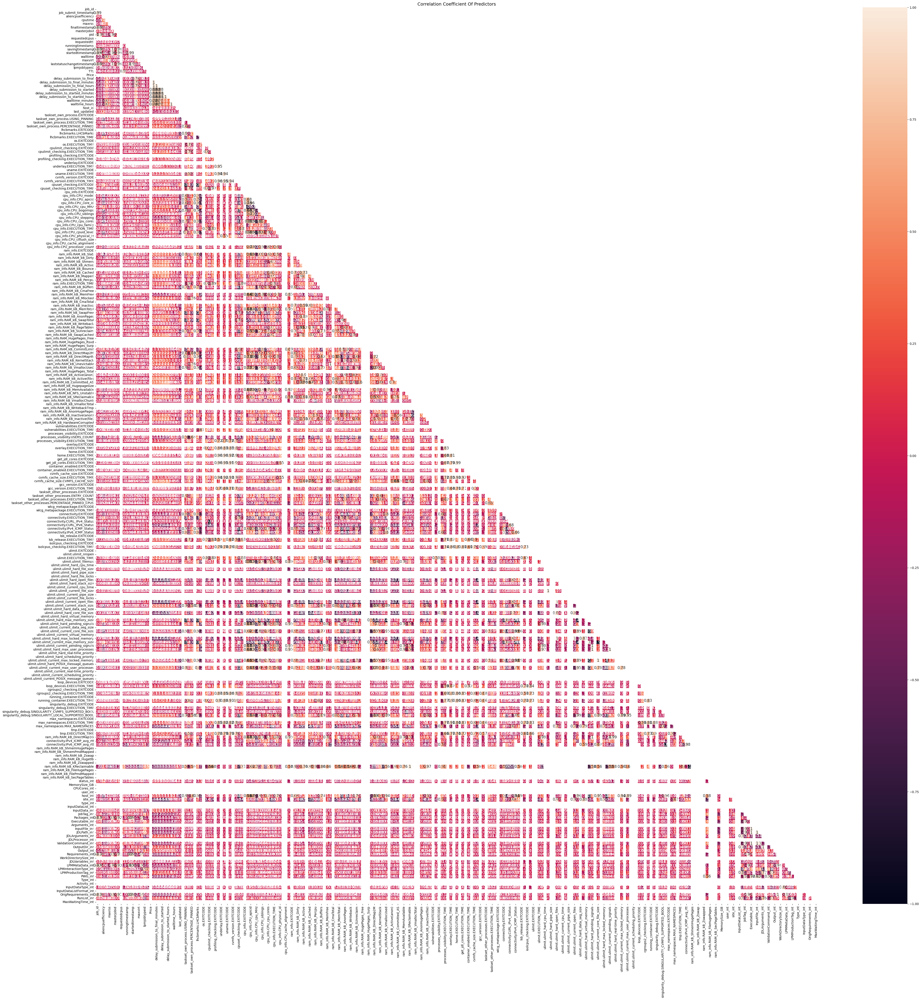

In [59]:

# vectorize one column
#job_info_with_trace_with_delay_na=job_info_with_trace_with_delay.dropna(subset=['InputData']).copy()

#job_info_with_trace_with_delay_na['InputData_joined'] = job_info_with_trace_with_delay_na['InputData'].str.join(",")

# import pandas as pd
# from sklearn.feature_extraction.text import TfidfVectorizer

# tfidf_vec = TfidfVectorizer()
# tfidf_dense = tfidf_vec.fit_transform(job_info_with_trace_with_delay_na['InputData_joined']).todense()
# new_cols = tfidf_vec.get_feature_names()
# job_info_with_trace_with_delay_na = job_info_with_trace_with_delay_na.join(pd.DataFrame(tfidf_dense, columns=new_cols))
# job_info_with_trace_with_delay_na.info()


# from sklearn.feature_extraction.text import CountVectorizer
# vectorizer = CountVectorizer()
# count_dense = vectorizer.fit_transform(job_info_with_trace_with_delay_na['InputData_joined']).todense()
# new_cols = tfidf_vec.get_feature_names()
# new_cols
# job_info_with_trace_with_delay_na = job_info_with_trace_with_delay_na.join(pd.DataFrame(count_dense, columns=new_cols))
# job_info_with_trace_with_delay_na.info()

# from sklearn.preprocessing import OneHotEncoder
# enc = OneHotEncoder(handle_unknown='ignore')
# enc.fit(job_info_with_trace_with_delay_na['InputData_joined'])


# # X.toarray()
# job_info_with_trace_with_delay_na = pd.DataFrame(X.toarray(), columns=job_info_with_trace_with_delay_na.columns,
#                           index=job_info_with_trace_with_delay_na.index)

# job_info_with_trace_with_delay_na.head()

import seaborn as sns

# set figure size
plt.figure(figsize=(10,7))

# Generate a mask to onlyshow the bottom triangle
mask = np.triu(np.ones_like(job_info_with_trace_with_delay.corr(), dtype=bool))

# generate heatmap
fig, ax = plt.subplots(figsize=(45,45))         # Sample figsize in inches
sns.heatmap(job_info_with_trace_with_delay.corr(), annot=True, mask=mask, vmin=-1, vmax=1, ax=ax)
plt.title('Correlation Coefficient Of Predictors')
save_fig("Correlation Coefficient Of Predictors")
plt.show()



In [60]:
job_info_with_trace_with_delay.corr()['walltime_hours'].sort_values(ascending=False)

walltime_hours                                        1.000000
walltime                                              1.000000
walltime_minutes                                      1.000000
delay_submission_to_final_hours                       0.778043
delay_submission_to_final                             0.778043
delay_submission_to_final_minutes                     0.778043
cputime                                               0.667712
delay_submission_to_started_hours                     0.397405
delay_submission_to_started_minutes                   0.397405
delay_submission_to_started                           0.397405
maxvirt                                               0.268053
maxrss                                                0.267436
taskset_own_process.PERCENTAGE_PINNED                 0.204126
Output_int                                            0.194356
ulimit.ulimit_current_max_user_processes              0.188322
singularity_debug.SINGULARITY_LOCAL_SUPPORTED_BOOL    0

In [61]:
# same correlations as before, but for a category aliprod 27408.0 that contains most of the jobs
## FOR (ALIPROD, 27408)

job_info_with_trace = job_info.where(job_info.status == 'DONE').set_index("job_id").join(trace.set_index('job_id'), how='inner')\
.join(mon_jdls.set_index('job_id'), how='inner').reset_index()

job_info_with_trace = job_info_with_trace.where(job_info_with_trace.User == 'aliprod').where(job_info_with_trace.lpmjobtypeid == 27408)

# drop columns that are contains all or mostly nulls (note that for this group it is a bit different than global!)
# InputData                       0
# InputDataList                   0
# InputDataListFormat             0
# OrigRequirements                0
# LPMParentPID                    0
# LPMActivity                     0
# MaxWaitingTime                  0
# MaxFailFraction                 0
# MaxResubmitFraction             0
# RunOnAODs                       0
# LegoDataSetType                 0
# LPMRAWPassID                    0
# LPMRawPass                      0
# LPMCPassMode                    0
# LPMAnchorRun                    0
# LPMAnchorProduction             0
# LPMAnchorYear                   0
# RunList                         0
# LegoResubmitZombies             0
# RunSublist                      0
# Splitted                        0
# LPMMaxResubmissions             0
# CanSpanMultipleRuns             0
# ProxyTTL                        0
# OutputArchive                   0
# GUIDFile                        0
# LegoRunPathSubSelection         0
# LPMCollectionEntity             0
# IterationTimestamp              0
# SeNumber                        0
# OutputFileType                  0
# FilesToCheck                    0
# LPMHighPriority                 0
# MasterResubmitThreshold         0
# HYRun                           0
# HYJobID                         0
# HYTrain                         0
# DataframeSize                   0
# MaxOutputSize                   0
# CollisionSystem                 0
# cpuIsolation                    0
# MCAnchor                        0
# Monitoring                      0
# MaxInitFailed                   0

job_info_with_trace = job_info_with_trace.dropna(axis=1, how='all')


job_info_with_trace = job_info_with_trace.where(job_info_with_trace['finaltimestamp'] > 0).where(job_info_with_trace['startedtimestamp'] > 0)

job_info_with_trace_with_delay = job_info_with_trace.assign(delay_submission_to_final = job_info_with_trace['finaltimestamp'] - (job_info_with_trace['job_submit_timestamp']*1000))

job_info_with_trace_with_delay = job_info_with_trace_with_delay.assign(delay_submission_to_final_minutes = job_info_with_trace_with_delay['delay_submission_to_final'] / 1000 / 60, delay_submission_to_final_hours = job_info_with_trace_with_delay['delay_submission_to_final'] / 1000 / 3600).sort_values(['delay_submission_to_final_minutes'], ascending=True)

job_info_with_trace_with_delay= job_info_with_trace_with_delay.assign(delay_submission_to_started = job_info_with_trace['startedtimestamp'] - (job_info_with_trace['job_submit_timestamp']*1000))

job_info_with_trace_with_delay = job_info_with_trace_with_delay.assign(delay_submission_to_started_minutes = job_info_with_trace_with_delay['delay_submission_to_started'] / 1000 / 60, delay_submission_to_started_hours = job_info_with_trace_with_delay['delay_submission_to_started'] / 1000 / 3600).sort_values(['delay_submission_to_started_minutes'], ascending=True)

job_info_with_trace_with_delay = job_info_with_trace_with_delay.assign(walltime_minutes = job_info_with_trace_with_delay['walltime'] / 60, walltime_hours = job_info_with_trace_with_delay['walltime'] / 3600).sort_values(['walltime_minutes'], ascending=False)


job_info_with_trace_with_delay.count()



job_id                                 11966
jdl_set                                11966
trace_set                              11966
status                                 11966
job_submit_timestamp                   11966
last_update                            11966
aliencpuefficiency                     11966
cputime                                11966
host                                   11936
maxrss                                 11966
cpuefficiency                          11917
finaltimestamp                         11966
masterjobid                            11966
pid                                    11966
requestedcpus                          11966
requestedttl                           11966
runningtimestamp                       11966
savingtimestamp                        11966
startedtimestamp                       11966
walltime                               11966
maxvirt                                11966
site                                   11945
laststatus

In [62]:
job_info_with_trace.select_dtypes(include=np.number)

,job_id,job_submit_timestamp,aliencpuefficiency,cputime,maxrss,finaltimestamp,masterjobid,pid,requestedcpus,requestedttl,runningtimestamp,savingtimestamp,startedtimestamp,walltime,maxvirt,laststatuschangetimestamp,lpmjobtypeid,TTL,Price
0,2.804336e+09,1.676587e+09,90.16,32289.50,1644544.0,1.676819e+12,2.804331e+09,2.804336e+09,1.0,72000.0,1.676783e+12,1.676819e+12,1.676783e+12,35813.0,1644544.0,1.676819e+12,27408.0,72000.0,11.0
1,2.804345e+09,1.676587e+09,98.43,45235.22,1766400.0,1.676857e+12,2.804335e+09,2.804345e+09,1.0,72000.0,1.676811e+12,1.676857e+12,1.676811e+12,45958.0,1766400.0,1.676857e+12,27408.0,72000.0,11.0
2,2.804346e+09,1.676587e+09,97.13,69065.04,1598464.0,1.676809e+12,2.804332e+09,2.804346e+09,1.0,72000.0,1.676738e+12,1.676809e+12,1.676738e+12,71103.0,1598464.0,1.676809e+12,27408.0,72000.0,11.0
3,2.804346e+09,1.676587e+09,95.00,60548.80,1645568.0,1.676875e+12,2.804335e+09,2.804346e+09,1.0,72000.0,1.676811e+12,1.676875e+12,1.676811e+12,63738.0,1645568.0,1.676875e+12,27408.0,72000.0,11.0
4,2.804346e+09,1.676587e+09,-1.00,-1.00,-1.0,1.676862e+12,2.804335e+09,2.804346e+09,1.0,72000.0,1.676811e+12,1.676862e+12,1.676811e+12,-1.0,-1.0,1.676862e+12,27408.0,72000.0,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78742,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78743,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78744,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78745,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [63]:
# job_info_with_trace_with_delay = job_info_with_trace_with_delay.set_index("host", drop = False).join(hosts_parsed.set_index('hostname'), how='inner').reset_index()
# job_info_with_trace_with_delay

In [64]:


job_info_with_trace_with_delay["status"].fillna('RUNNING', inplace=True)
job_info_with_trace_with_delay['status_int'] = pd.Categorical(job_info_with_trace_with_delay['status']).codes
job_info_with_trace_with_delay['MemorySize_GB'] = job_info_with_trace_with_delay.MemorySize.str.extract('(\d+)').astype(float)
job_info_with_trace_with_delay['CPUCores_int'] = pd.Categorical(job_info_with_trace_with_delay['CPUCores']).codes
job_info_with_trace_with_delay['user_int'] = pd.Categorical(job_info_with_trace_with_delay['User']).codes
job_info_with_trace_with_delay['host_int'] = pd.Categorical(job_info_with_trace_with_delay['host']).codes
job_info_with_trace_with_delay['site_int'] = pd.Categorical(job_info_with_trace_with_delay['site']).codes
job_info_with_trace_with_delay['type_int'] = pd.Categorical(job_info_with_trace_with_delay['Type']).codes
# job_info_with_trace_with_delay['InputDataList_int'] = pd.Categorical(job_info_with_trace_with_delay['InputDataList']).codes


# the resulting df will have column_name_int with a categorical value
def categorize_string_list(column_name, df):
    df = df.dropna(subset=[column_name]).copy() # TODO decide if to drop NA or will with empty
#     df[[column_name]] = df[[column_name]].fillna('')
    df[column_name+'_joined'] = df[column_name].str.join(",")
    df[column_name+'_int'] = pd.Categorical(df[column_name+'_joined']).codes
    return df




# job_info_with_trace_with_delay = categorize_string_list('InputData', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JobTag', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Packages', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Executable', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Arguments', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('InputFile', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JDLPath', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JDLArguments', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JDLProcessor', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('ValidationCommand', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('OutputDir', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Output', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Requirements', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('WorkDirectorySize', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('JDLVariables', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('LPMMetaData', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('LPMInteractionType', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('LPMProductionTag', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('PWG', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Type', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('Activity', job_info_with_trace_with_delay)
job_info_with_trace_with_delay = categorize_string_list('InputDataType', job_info_with_trace_with_delay)
# job_info_with_trace_with_delay = categorize_string_list('cpu_info.CPU_flags', job_info_with_trace_with_delay)
# job_info_with_trace_with_delay = categorize_string_list('InputDataListFormat', job_info_with_trace_with_delay)
# job_info_with_trace_with_delay = categorize_string_list('OrigRequirements', job_info_with_trace_with_delay)
# job_info_with_trace_with_delay = categorize_string_list('RunList', job_info_with_trace_with_delay)
# job_info_with_trace_with_delay = categorize_string_list('MaxWaitingTime', job_info_with_trace_with_delay)


# don't use:
# job_info_with_trace_with_delay = categorize_string_list('LPMAnchorPassName', job_info_with_trace_with_delay) # its empty
# job_info_with_trace_with_delay = categorize_string_list('LPMAnchorPassName', job_info_with_trace_with_delay) # its empty



# job_info_with_trace_with_delay.info(verbose=True, show_counts=True)

# vectorize list types
# for (columnName, columnData) in job_info_with_trace_with_delay.iteritems():
#     print('Column Name : ', columnName)
#     print('Column Contents : ', columnData.values)
#     print('is list : ', type(columnData.values) == list)


In [65]:
# improve categorization

# the resulting df will have column_name_int with a categorical value
def categorize_string_list(column_name, df):
    df = df.dropna(subset=[column_name]).copy() # TODO decide if to drop NA or will with empty
#     df[[column_name]] = df[[column_name]].fillna('')
    df[column_name+'_joined'] = df[column_name].str.join(",")
    df[column_name+'_int'] = pd.Categorical(df[column_name+'_joined']).codes
    return df

job_info_with_trace_with_delay = categorize_string_list('Packages', job_info_with_trace_with_delay)


pd.set_option('max_colwidth', -1)



# job_info_with_trace_with_delay[['status_int', 'status']].head(1000)
# job_info_with_trace_with_delay[['host_int', 'host']].head(1000)
# job_info_with_trace_with_delay[['InputFile_int', 'InputFile']].head()
#].where(job_info_with_trace_with_delay.Packages_int == 1).head()

job_info_with_trace_with_delay.groupby(['site_int'])['site_int'].count().sort_values(ascending=False) 





c:\Users\MichalFaciszewski\Documents\mgr_study\MGR\.venv\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


site_int
 38    4587
 40    4563
 52    216 
 11    174 
 32    172 
 0     155 
 50    142 
 42    134 
 41    128 
 21    117 
 33    117 
 31    113 
 19    113 
 29    104 
 36    67  
 18    65  
 48    61  
 25    54  
 24    52  
 15    52  
 5     52  
 16    51  
 46    50  
 17    44  
 30    43  
 14    42  
 28    40  
 1     40  
 44    34  
 12    33  
 34    29  
 37    29  
 20    29  
 43    25  
 9     23  
 7     21  
-1     21  
 23    20  
 39    18  
 10    17  
 51    17  
 6     16  
 53    15  
 13    13  
 47    11  
 45    10  
 35    7   
 3     7   
 8     5   
 2     5   
 27    3   
 49    3   
 4     3   
 22    2   
 26    2   
Name: site_int, dtype: int64

<Figure size 1000x700 with 0 Axes>

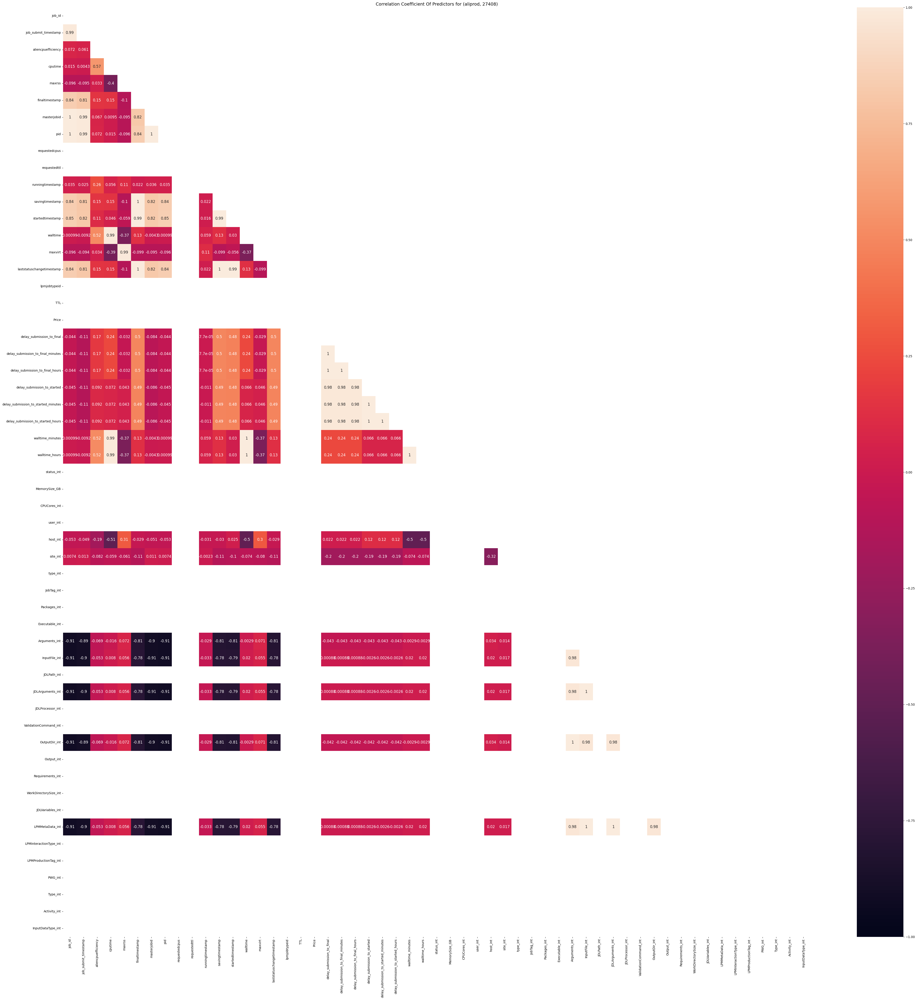

In [66]:
# import seaborn as sns

# set figure size
plt.figure(figsize=(10,7))

# Generate a mask to onlyshow the bottom triangle
mask = np.triu(np.ones_like(job_info_with_trace_with_delay.corr(), dtype=bool))

# generate heatmap
fig, ax = plt.subplots(figsize=(45,45))         # Sample figsize in inches
# corr = job_info_with_trace_with_delay.corr().dropna(axis=1, how='all')


sns.heatmap(job_info_with_trace_with_delay.corr(), annot=True, mask=mask, vmin=-1, vmax=1, ax=ax)
plt.title('Correlation Coefficient Of Predictors for (aliprod, 27408)')
save_fig("Correlation Coefficient Of Predictors for (aliprod, 27408)")
plt.show()


In [67]:
job_info_with_trace_with_delay.corr()['walltime_hours'].sort_values(ascending=False)

walltime                               1.000000
walltime_hours                         1.000000
walltime_minutes                       1.000000
cputime                                0.986817
aliencpuefficiency                     0.519394
delay_submission_to_final_minutes      0.237043
delay_submission_to_final              0.237043
delay_submission_to_final_hours        0.237043
savingtimestamp                        0.132406
laststatuschangetimestamp              0.132358
finaltimestamp                         0.132354
delay_submission_to_started_hours      0.065524
delay_submission_to_started_minutes    0.065524
delay_submission_to_started            0.065524
runningtimestamp                       0.059281
startedtimestamp                       0.029966
InputFile_int                          0.020447
JDLArguments_int                       0.020447
LPMMetaData_int                        0.020447
pid                                    0.000990
job_id                                 0

In [68]:
# craete walltime hours categories

job_info_with_trace_with_delay["walltime_hours_cat"] = pd.cut(job_info_with_trace_with_delay["walltime_hours"],
                               bins=[0., 5.0, 7.5, 10, 12.5, 15, 17.5, 20, 24. , np.inf],
                               labels=[1, 2, 3, 4, 5,6,7,8,9])

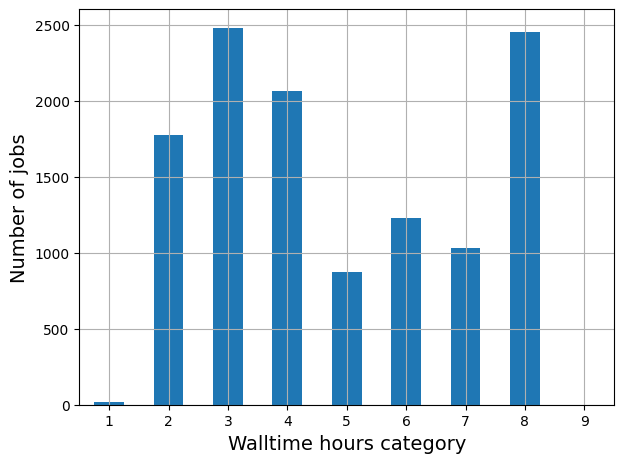

In [69]:
job_info_with_trace_with_delay["walltime_hours_cat"].value_counts().sort_index().plot.bar(rot=0, grid=True)
plt.xlabel("Walltime hours category")
plt.ylabel("Number of jobs")
save_fig("Walltime hours category for (aliprod, 27408)")
plt.show()

In [70]:
job_info_with_trace_with_delay[['cputime']].sort_values(ascending=False, by='cputime') 

,cputime
1619,72137.50
354,72127.02
2610,72121.45
357,72117.09
283,72082.11
...,...
4797,-1.00
5090,-1.00
3600,-1.00
7074,-1.00


In [71]:


job_info_with_trace_with_delay["cputime_cat"] = pd.cut(job_info_with_trace_with_delay["cputime"],
                               bins=[0., 10000, 20000, 30000, 40000, 50000, 60000, 70000, 80000. , np.inf],
                               labels=[1, 2, 3, 4, 5,6,7,8,9])

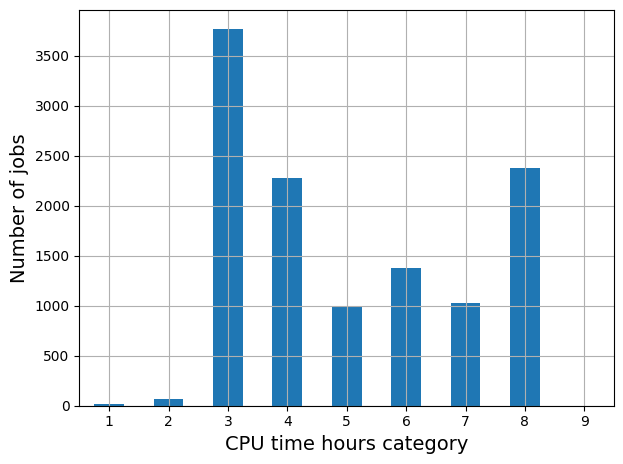

In [72]:
job_info_with_trace_with_delay["cputime_cat"].value_counts().sort_index().plot.bar(rot=0, grid=True)
plt.xlabel("CPU time hours category")
plt.ylabel("Number of jobs")
save_fig("CPUtime category for (aliprod, 27408)")
plt.show()

In [73]:
# use one hot encoder for categories

from sklearn.preprocessing import OneHotEncoder

# host, site, InputFile_int
job_info_with_trace_with_delay_host_int_cat = job_info_with_trace_with_delay[["host"]]

cat_encoder = OneHotEncoder()
host_cat_1hot = cat_encoder.fit_transform(job_info_with_trace_with_delay_host_int_cat)
host_cat_1hot
# cat_encoder.categories_
# cat_encoder.feature_names_in_
# cat_encoder.get_feature_names_out()




<11966x1649 sparse matrix of type '<class 'numpy.float64'>'
	with 11966 stored elements in Compressed Sparse Row format>

In [74]:
# remove NaNs


job_info_with_trace_with_delay = job_info_with_trace_with_delay.dropna(axis=0)

# job_info_with_trace_with_delay.isna().sum().sum()
# job_info_with_trace_with_delay.isna().sum().sum()
# job_info_with_trace_with_delay.count()

In [75]:
job_info_with_trace_with_delay

,job_id,jdl_set,trace_set,status,job_submit_timestamp,last_update,aliencpuefficiency,cputime,host,maxrss,cpuefficiency,finaltimestamp,masterjobid,pid,requestedcpus,requestedttl,runningtimestamp,savingtimestamp,startedtimestamp,walltime,maxvirt,site,laststatuschangetimestamp,lpmjobtypeid,full_jdl,User,JobTag,Packages,Executable,Arguments,InputFile,JDLPath,JDLArguments,JDLProcessor,ValidationCommand,OutputDir,Output,OutputErrorE,Requirements,TTL,Price,MemorySize,WorkDirectorySize,MasterJobID,LPMChainID,LPMJobTypeID,JDLVariables,LPMAnchorPassName,LPMMetaData,LPMRunNumber,LPMProductionType,LPMInteractionType,LPMProductionTag,CPUCores,PWG,Type,Activity,OCDBReferenceProduction,InputDataType,delay_submission_to_final,delay_submission_to_final_minutes,delay_submission_to_final_hours,delay_submission_to_started,delay_submission_to_started_minutes,delay_submission_to_started_hours,walltime_minutes,walltime_hours,status_int,MemorySize_GB,CPUCores_int,user_int,host_int,site_int,type_int,JobTag_joined,JobTag_int,Packages_joined,Packages_int,Executable_joined,Executable_int,Arguments_joined,Arguments_int,InputFile_joined,InputFile_int,JDLPath_joined,JDLPath_int,JDLArguments_joined,JDLArguments_int,JDLProcessor_joined,JDLProcessor_int,ValidationCommand_joined,ValidationCommand_int,OutputDir_joined,OutputDir_int,Output_joined,Output_int,Requirements_joined,Requirements_int,WorkDirectorySize_joined,WorkDirectorySize_int,JDLVariables_joined,JDLVariables_int,LPMMetaData_joined,LPMMetaData_int,LPMInteractionType_joined,LPMInteractionType_int,LPMProductionTag_joined,LPMProductionTag_int,PWG_joined,PWG_int,Type_joined,Type_int,Activity_joined,Activity_int,InputDataType_joined,InputDataType_int,walltime_hours_cat,cputime_cat
3890,2.805802e+09,t,t,DONE,1.676808e+09,2023-02-20 16:08:53.150797,55.64,40497.070,lxbk1154.gsi.de,1695744.0,55.64%,1.676974e+12,2.805752e+09,2.805802e+09,1.0,72000.0,1.676901e+12,1.676974e+12,1.676901e+12,72780.0,1695744.0,ALICE::GSI::GSI_8Core,1.676974e+12,27408.0,"{\n ""User"":""aliprod"",\n ""JobTag"":[\n ""comment:pp, 13 TeV - Pythia-8 Geant4 extra""\n ],\n ""Packages"":[\n ""VO_ALICE@AliDPG::prod-202203-02-1"",\n ""VO_ALICE@AliPhysics::v5-09-56l-01-1"",\n ""VO_ALICE@jemalloc::latest""\n ],\n ""Executable"":""\/alice\/cern.ch\/user\/a\/aliprod\/bin\/aliroot_dpgsim.sh"",\n ""Arguments"":"" --run 263691 --mode full --uid 17585 --nevents 500 --generator PWGLF:Pythia8_Monash2013_Str002 --geant4 --its-material kSPDSiChip=1.3,kSPDSiSens=1.3,kSPDAlBus=1.3,kSPDCoolPipes=1.3,kSDDSiAll=1.12"",\n ""InputFile"":[\n ""LF:\/alice\/sim\/2021\/LHC21l6\/OCDB\/263691\/OCDBsim.root"",\n ""LF:\/alice\/sim\/2021\/LHC21l6\/OCDB\/263691\/OCDBrec.root""\n ],\n ""JDLPath"":""\/alice\/cern.ch\/user\/a\/aliprod\/LHC22e1\/JDL_2"",\n ""JDLArguments"":""263691 1 19975 0 0 0 0"",\n ""JDLProcessor"":""alien.lpm.RunList"",\n ""ValidationCommand"":""\/alice\/validation\/validation.sh"",\n ""OutputDir"":""\/alice\/sim\/2022\/LHC22e1_extra_3\/263691\/17585"",\n ""Output"":[\n ""log_archive:stderr.log,stdout.log@disk=1"",\n ""FilterEvents_Trees*.root@disk=1""\n ],\n ""OutputErrorE"":[\n ""log_archive.zip:*.log@disk=1""\n ],\n ""Requirements"":""( member(other.Packages,\""VO_ALICE@AliDPG::prod-202203-02-1\"") ) && ( member(other.Packages,\""VO_ALICE@AliPhysics::v5-09-56l-01-1\"") ) && ( member(other.Packages,\""VO_ALICE@jemalloc::latest\"") ) && ( other.TTL > 72000 ) && ( other.Price <= 11 ) && ( other.CVMFS_Revision >= 11993 ) && ( ( other.LocalDiskSpace > 6144000 ) )"",\n ""TTL"":72000,\n ""Price"":11.0,\n ""MemorySize"":""8GB"",\n ""WorkDirectorySize"":[\n ""6000MB""\n ],\n ""MasterJobID"":""2805752031"",\n ""LPMChainID"":""288531"",\n ""LPMJobTypeID"":""27408"",\n ""JDLVariables"":[\n ""Packages"",\n ""OutputDir"",\n ""LPMAnchorPassName"",\n ""LPMMetaData"",\n ""LPMRunNumber"",\n ""LPMProductionType"",\n ""LPMInteractionType"",\n ""LPMProductionTag"",\n ""LPMJobTypeID"",\n ""CPUCores""\n ],\n ""LPMAnchorPassName"":""pass2"",\n ""LPMMetaData"":""Packages=[VO

In [76]:
job_info_with_trace_with_delay['host'].count()

11880

In [77]:
job_info_with_trace_with_delay.groupby(['CPUCores'])['CPUCores'].count().sort_values(ascending=False) 

CPUCores
1    11880
Name: CPUCores, dtype: int64

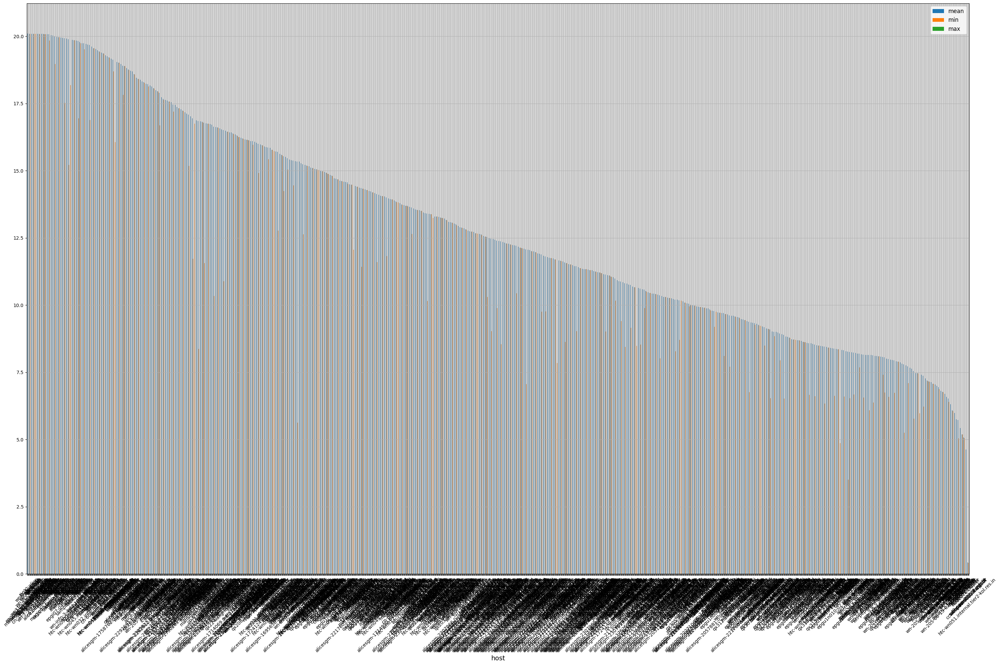

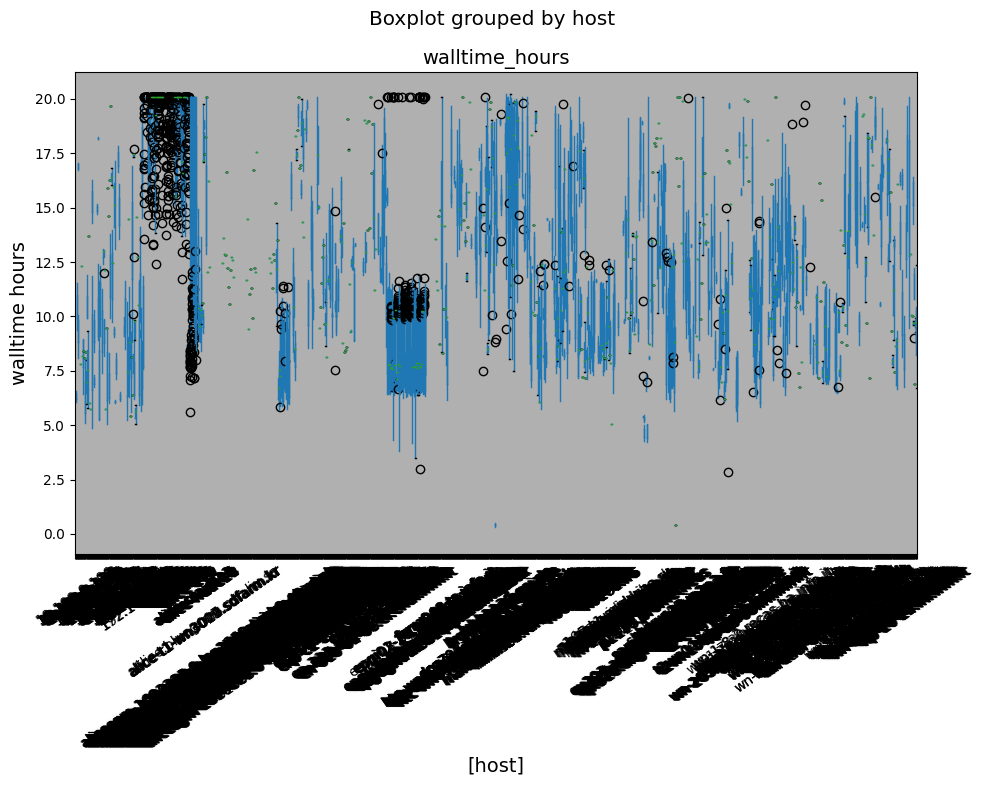

In [78]:
job_info_walltime_per_host = job_info_with_trace_with_delay.groupby(['host'])['walltime_hours'].agg(['mean', 'min', 'max'])\
.sort_values(['mean'], ascending=False) 


job_info_walltime_per_host.plot.bar(figsize=(30,20), rot=45, grid=True)
save_fig("mean_walltime_per_host [HOURS] (aliprod, 27408)")


fig, ax = plt.subplots(figsize=(10,8))
plt.suptitle('walltime_per_host (aliprod, 27408)')
ax.set_xlabel('host')
ax.set_ylabel('walltime hours')
job_info_with_trace_with_delay.boxplot(figsize=(50,50), by=['host'], column=['walltime_hours'], ax=ax, rot=35)
save_fig("walltime_per_host [Hours] (aliprod, 27408)")

In [79]:
# corr for ALIPROD

job_info_with_trace_with_delay_with_host = job_info_with_trace_with_delay.set_index("host", drop = False).join(hosts_parsed.set_index('hostname'), how='inner').reset_index()


# when flags contain tag ht, it means its hyper-threading
# the most important ones are cpu_info.cpu_flags['ht'] (is_hyper_threading), cpu_info.cpu_model, cpu_info.cpu_cores

job_info_with_trace_with_delay_with_host = categorize_string_list('cpu_info.CPU_flags', job_info_with_trace_with_delay_with_host)

job_info_with_trace_with_delay_with_host['is_hyper_threading_int'] = pd.Categorical(job_info_with_trace_with_delay_with_host['is_hyper_threading']).codes


corr_matrix = job_info_with_trace_with_delay_with_host.corr()

corr_matrix.head

corr_matrix["host_int"].sort_values(ascending=False)

host_int                                              1.000000
ulimit.ulimit_current_stack_size                      0.700835
singularity_debug.SINGULARITY_LOCAL_SUPPORTED_BOOL    0.647019
ram_info.RAM_kB_KReclaimable                          0.638180
ulimit.ulimit_current_max_user_processes              0.480789
taskset_own_process.USING_PINNING                     0.474519
cpu_info.CPU_flags_int                                0.463504
cpu_info.CPU_bogomips                                 0.457231
lhcbmarks.LHCbMarks                                   0.443001
ram_info.RAM_kB_Slab                                  0.424615
taskset_own_process.PERCENTAGE_PINNED                 0.419245
ulimit.ulimit_current_max_locked_memory               0.410119
ulimit.ulimit_current_core_file_size                  0.393562
ram_info.RAM_kB_SReclaimable                          0.386933
ram_info.RAM_kB_Cached                                0.367784
cpu_info.CPU_cpu_family                               0

In [80]:
corr_matrix["walltime_hours"].sort_values(ascending=False)

walltime_minutes                                      1.000000
walltime_hours                                        1.000000
walltime                                              1.000000
cputime                                               0.988014
ulimit.ulimit_hard_max_memory_size                    0.706107
ulimit.ulimit_current_max_memory_size                 0.706107
cpuset_checking.EXITCODE                              0.693013
aliencpuefficiency                                    0.575799
lhcbmarks.EXECUTION_TIME                              0.551043
connectivity.IPv6_ICMP_avg_rtt                        0.399903
last_updated                                          0.360458
ram_info.RAM_kB_SwapTotal                             0.349986
ram_info.RAM_kB_SwapFree                              0.347791
cpu_info.CPU_cpu_MHz                                  0.319292
ram_info.RAM_kB_KReclaimable                          0.272623
delay_submission_to_final_minutes                     0

In [81]:
corr_matrix["site_int"].sort_values(ascending=False)

site_int                                              1.000000
ulimit.ulimit_hard_open_files                         0.608286
ulimit.ulimit_current_open_files                      0.608286
ulimit.ulimit_hard_max_locked_memory                  0.564912
loop_devices.EXITCODE                                 0.440250
cpu_info.CPU_stepping                                 0.434571
ulimit.ulimit_hard_stack_size                         0.245797
connectivity.IPv4_ICMP_Status                         0.242155
ulimit.ulimit_current_core_file_size                  0.221019
ulimit.ulimit_hard_file_size                          0.202756
connectivity.IPv4_ICMP_avg_rtt                        0.191289
cpu_info.CPU_bogomips                                 0.180039
ulimit.ulimit_current_max_locked_memory               0.173169
max_namespaces.MAX_NAMESPACES                         0.169870
singularity_debug.SINGULARITY_CVMFS_SUPPORTED_BOOL    0.158264
ram_info.RAM_kB_Buffers                               0

In [82]:
pd.set_option('display.max_rows', 500)

In [113]:
job_info_with_trace_with_delay_with_host.to_csv("./job_info_with_trace_with_delay_with_host.csv")

In [83]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
     job_info_with_trace_with_delay_with_host, job_info_with_trace_with_delay_with_host["walltime_hours"])

In [105]:


# # create e2e pipeline (ideal model)
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler


job_info_without_labels = X_train.drop("walltime_hours", axis=1)
job_info_with_labels = X_train["walltime_hours"].copy()
job_info_without_labels_test = X_test.drop("walltime_hours", axis=1)
job_info_with_labels_test = X_test["walltime_hours"].copy()


cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))


default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())


preprocessing = ColumnTransformer([
        ("cat", cat_pipeline, ['status', 'MemorySize', 'User', 'host', 'site', 'Type', 'JobTag_joined','Packages_joined','Executable_joined','Arguments_joined','InputFile_joined','JDLPath_joined','JDLArguments_joined','JDLProcessor_joined','ValidationCommand_joined','OutputDir_joined','Output_joined','Requirements_joined','WorkDirectorySize_joined','JDLVariables_joined','LPMMetaData_joined','LPMInteractionType_joined','LPMProductionTag_joined','PWG_joined','Type_joined','Activity_joined','InputDataType_joined', 'is_hyper_threading']),
        ("numeric", default_num_pipeline, ['aliencpuefficiency', 'cputime', 'maxrss', 'requestedcpus', 'requestedttl', 'maxvirt', 'TTL', 'Price', 'cpu_info.CPU_cpu_cores', 'cpu_info.CPU_model', ])
])  

job_info_prepared = preprocessing.fit_transform(job_info_without_labels)
job_info_prepared.shape
# preprocessing.get_feature_names_out()


(7575, 16456)

In [103]:
job_info_with_labels

8107    10.488889
4801    10.017500
6077    9.918056 
5457    8.493889 
3338    18.512500
          ...    
5734    10.903611
5191    8.580278 
5390    7.816389 
860     20.087222
7270    10.579167
Name: walltime_hours, Length: 7575, dtype: float64

In [104]:
job_info_without_labels.head(1)

,index,job_id,jdl_set,trace_set,status,job_submit_timestamp,last_update,aliencpuefficiency,cputime,host,maxrss,cpuefficiency,finaltimestamp,masterjobid,pid,requestedcpus,requestedttl,runningtimestamp,savingtimestamp,startedtimestamp,walltime,maxvirt,site,laststatuschangetimestamp,lpmjobtypeid,full_jdl,User,JobTag,Packages,Executable,Arguments,InputFile,JDLPath,JDLArguments,JDLProcessor,ValidationCommand,OutputDir,Output,OutputErrorE,Requirements,TTL,Price,MemorySize,WorkDirectorySize,MasterJobID,LPMChainID,LPMJobTypeID,JDLVariables,LPMAnchorPassName,LPMMetaData,LPMRunNumber,LPMProductionType,LPMInteractionType,LPMProductionTag,CPUCores,PWG,Type,Activity,OCDBReferenceProduction,InputDataType,delay_submission_to_final,delay_submission_to_final_minutes,delay_submission_to_final_hours,delay_submission_to_started,delay_submission_to_started_minutes,delay_submission_to_started_hours,walltime_minutes,status_int,MemorySize_GB,CPUCores_int,user_int,host_int,site_int,type_int,JobTag_joined,JobTag_int,Packages_joined,Packages_int,Executable_joined,Executable_int,Arguments_joined,Arguments_int,InputFile_joined,InputFile_int,JDLPath_joined,JDLPath_int,JDLArguments_joined,JDLArguments_int,JDLProcessor_joined,JDLProcessor_int,ValidationCommand_joined,ValidationCommand_int,OutputDir_joined,OutputDir_int,Output_joined,Output_int,Requirements_joined,Requirements_int,WorkDirectorySize_joined,WorkDirectorySize_int,JDLVariables_joined,JDLVariables_int,LPMMetaData_joined,LPMMetaData_int,LPMInteractionType_joined,LPMInteractionType_int,LPMProductionTag_joined,LPMProductionTag_int,PWG_joined,PWG_int,Type_joined,Type_int,Activity_joined,Activity_int,InputDataType_joined,InputDataType_int,walltime_hours_cat,cputime_cat,host_id,ce_name,addr,last_updated,taskset_own_process.TASKSET,taskset_own_process.EXITCODE,taskset_own_process.USING_PINNING,taskset_own_process.EXECUTION_TIME,taskset_own_process.PERCENTAGE_PINNED,lhcbmarks.EXITCODE,lhcbmarks.LHCbMarks,lhcbmarks.EXECUTION_TIME,os.OS_ID,os.OS_NAME,os.EXITCODE,os.OS_ID_LIKE,os.OS_VERSION,os.OS_CPE_NAME,os.OS_HOME_URL,os.OS_ANSI_COLOR,os.OS_VERSION_ID,os.EXECUTION_TIME,os.OS_PRETTY_NAME,os.OS_BUG_REPORT_URL,os.OS_REDHAT_SUPPORT_PRODUCT,os.OS_CENTOS_MANTISBT_PROJECT,os.OS_REDHAT_SUPPORT_PRODUCT_VERSION,os.OS_CENTOS_MANTISBT_PROJECT_VERSION,cpulimit_checking.CGROUP,cpulimit_checking.EXITCODE,cpulimit_checking.ACCOUNTING,cpulimit_checking.ACCESS_QUOTA,cpulimit_checking.ACCESS_PERIOD,cpulimit_checking.ALLOCATED_CPUS,cpulimit_checking.EXECUTION_TIME,profiling_checking.EXITCODE,profiling_checking.PTRACE_SCOPE,profiling_checking.EXECUTION_TIME,profiling_checking.PERF_EVENT_PARANOID,profiling_checking.VTUNE_PROFILING_ENABLED,underlay.EXITCODE,underlay.EXECUTION_TIME,underlay.UNDERLAY_ENABLED,uname.UNAME,uname.EXITCODE,uname.EXECUTION_TIME,cvmfs_version.EXITCODE,cvmfs_version.CVMFS_VERSION,cvmfs_version.EXECUTION_TIME,cpuset_checking.EXITCODE,cpuset_checking.CPU_AMOUNT,cpuset_checking.CPUSET_CPUS,cpuset_checking.CPUSET_CGROUP,cpuset_checking.CPUSET_PREFIX,cpuset_checking.CPUSET_ENABLED,cpuset_checking.EXECUTION_TIME,cpu_info.CPU_wp,cpu_info.CPU_fpu,cpu_info.EXITCODE,cpu_info.CPU_flags,cpu_info.CPU_model,cpu_info.CPU_apicid,cpu_info.CPU_core_id,cpu_info.CPU_cpu_MHz,cpu_info.CPU_bogomips,cpu_info.CPU_siblings,cpu_info.CPU_stepping,cpu_info.CPU_cpu_cores,cpu_info.CPU_microcode,cpu_info.CPU_processor,cpu_info.CPU_vendor_id,cpu_info.CPU_cache_size,cpu_info.CPU_cpu_family,cpu_info.CPU_model_name,cpu_info.EXECUTION_TIME,cpu_info.CPU_cpuid_level,cpu_info.CPU_physical_id,cpu_info.CPU_clflush_size,cpu_info.CPU_address_sizes,cpu_info.CPU_fpu_exception,cpu_info.CPU_initial_apicid,cpu_info.CPU_cache_alignment,cpu_info.CPU_processor_count,cpu_info.CPU_power_management,ram_info.EXITCODE,ram_info.RAM_kB_Slab,ram_info.RAM_kB_Dirty,ram_info.RAM_kB_Shmem,ram_info.RAM_kB_Active,ram_info.RAM_kB_Bounce,ram_info.RAM_kB_Cached,ram_info.RAM_kB_Mapped,ram_info.RAM_kB_Percpu,ram_info.EXECUTION_TIME,ram_info.RAM_kB_Buffers,ram_info.RAM_kB_Cma

In [85]:
# train using all categories:

from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(job_info_without_labels, job_info_with_labels)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['status', 'MemorySize',
                                                   'User', 'host', 'site',
                                                   'Type', 'JobTag_joined',
                                                   'Packages_joined',
                                                   'Executable_joined',
                                                   'Arguments_joined',
                                                   'InputFile_joined...
       

In [110]:
job_info_predictions = lin_reg.predict(job_info_without_labels_test)
job_info_predictions[:10]

array([10.12650415,  7.74991338, 17.83032051, 10.79826127, 20.09504615,
       20.11795802, 16.22706797, 10.36896861,  7.83013579, 20.18355298])

In [108]:
job_info_with_labels_test.iloc[:10].values

array([10.21666667,  7.72861111, 17.86277778, 10.66638889, 20.08805556,
       20.08638889, 16.5975    , 10.44333333,  7.77388889, 20.09222222])

In [111]:
from sklearn.metrics import mean_squared_error
lin_rmse = mean_squared_error(job_info_with_labels_test, job_info_predictions,squared=False)
lin_rmse

0.5025825793329753

In [89]:
# Decision tree
from sklearn.tree import DecisionTreeRegressor

tree_reg = make_pipeline(preprocessing, DecisionTreeRegressor(random_state=42))
tree_reg.fit(job_info_without_labels, job_info_with_labels)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['status', 'MemorySize',
                                                   'User', 'host', 'site',
                                                   'Type', 'JobTag_joined',
                                                   'Packages_joined',
                                                   'Executable_joined',
                                                   'Arguments_joined',
                                                   'InputFile_joined...
       

In [90]:
job_info_predictions_tree = tree_reg.predict(job_info_without_labels)
tree_rmse = mean_squared_error(job_info_with_labels, job_info_predictions_tree, squared=False)
tree_rmse

1.2908295224050184e-16

In [91]:
# cross validation of tree model
from sklearn.model_selection import cross_val_score

tree_rmses = -cross_val_score(tree_reg, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(tree_rmses).describe()




count    10.000000
mean     0.407559 
std      0.277262 
min      0.098535 
25%      0.149535 
50%      0.384568 
75%      0.628615 
max      0.812091 
dtype: float64

In [92]:
from sklearn.model_selection import KFold
cross_val_score(tree_reg,
                X_train, y_train, cv=KFold(n_splits=10, shuffle=True, random_state=42))

array([0.97606394, 0.99977783, 0.99967951, 0.97423474, 0.96933488,
       0.98710761, 0.99907194, 0.99878624, 0.97898956, 0.99937718])

In [93]:

from sklearn.model_selection import KFold, RepeatedStratifiedKFold

cross_val_score(tree_reg,
                X_test, y_test, cv=KFold(n_splits=10, shuffle=True, random_state=42))

# cross validation of tree model
from sklearn.model_selection import cross_val_score

tree_rmses = -cross_val_score(tree_reg, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(tree_rmses).describe()

count    10.000000
mean     0.407559 
std      0.277262 
min      0.098535 
25%      0.149535 
50%      0.384568 
75%      0.628615 
max      0.812091 
dtype: float64

In [94]:
from sklearn.metrics import r2_score

r2_score(job_info_with_labels, tree_reg.predict(job_info_without_labels))

1.0

In [95]:
# cross validation of linear regression model
from sklearn.model_selection import cross_val_score

lin_rmses = -cross_val_score(lin_reg, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

count    10.000000
mean     0.502350 
std      0.262962 
min      0.233064 
25%      0.246768 
50%      0.448721 
75%      0.739735 
max      0.903414 
dtype: float64

In [96]:
# random forrest
from sklearn.ensemble import RandomForestRegressor

forest_reg = make_pipeline(preprocessing,
                           RandomForestRegressor(random_state=42))

forest_rmses = -cross_val_score(forest_reg, job_info_without_labels, job_info_with_labels,
                                scoring="neg_root_mean_squared_error", cv=10)
pd.Series(forest_rmses).describe()

KeyboardInterrupt: 

In [ ]:
# different hyperparameters

from sklearn.model_selection import GridSearchCV

from sklearn.pipeline import Pipeline

full_pipeline = Pipeline([
    ("preprocessing", preprocessing),
    ("random_forest", RandomForestRegressor(random_state=42)),
])

param_grid = [
    {'random_forest__max_features': [4, 6, 8]},
    {'random_forest__max_features': [6, 8, 10]},
]

grid_search = GridSearchCV(full_pipeline, param_grid, cv=3,
                           scoring='neg_root_mean_squared_error')
grid_search.fit(job_info_without_labels, job_info_with_labels)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(transformers=[('cat',
                                                                         Pipeline(steps=[('simpleimputer',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('onehotencoder',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['status',
                                                                          'MemorySize',
                                                                          'User',
                                                                          'host',
                             

In [ ]:
grid_search.best_params_

{'random_forest__max_features': 8}

In [ ]:
grid_search.best_estimator_

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['status', 'MemorySize',
                                                   'User', 'host', 'site',
                                                   'Type', 'JobTag_joined',
                                                   'Packages_joined',
                                                   'Executable_joined',
                                                   'Arguments_joined',
                                                   'InputFile_joined',
            

In [ ]:
cv_res = pd.DataFrame(grid_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)
cv_res.head()                  

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_random_forest__max_features,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
2,8.544617,0.044687,0.485603,0.007393,8,{'random_forest__max_features': 8},-1.449603,-1.388697,-1.424586,-1.420962,0.024997,1
4,8.522213,0.019136,0.476747,0.005071,8,{'random_forest__max_features': 8},-1.449603,-1.388697,-1.424586,-1.420962,0.024997,1
5,8.665518,0.060528,0.455278,0.007087,10,{'random_forest__max_features': 10},-1.423874,-1.399945,-1.448887,-1.424235,0.019982,3
1,8.338397,0.023559,0.527973,0.016193,6,{'random_forest__max_features': 6},-1.498746,-1.386262,-1.440448,-1.441819,0.045932,4
3,8.393999,0.018243,0.529729,0.006997,6,{'random_forest__max_features': 6},-1.498746,-1.386262,-1.440448,-1.441819,0.045932,4


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_distribs = {'random_forest__max_features': randint(low=2, high=20)}

rnd_search = RandomizedSearchCV(
    full_pipeline, param_distributions=param_distribs, n_iter=10, cv=3,
    scoring='neg_root_mean_squared_error', random_state=42)

rnd_search.fit(job_info_without_labels, job_info_with_labels)

RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(transformers=[('cat',
                                                                               Pipeline(steps=[('simpleimputer',
                                                                                                SimpleImputer(strategy='most_frequent')),
                                                                                               ('onehotencoder',
                                                                                                OneHotEncoder(handle_unknown='ignore'))]),
                                                                               ['status',
                                                                                'MemorySize',
                                                                                'User',
                                                   

In [ ]:
cv_res = pd.DataFrame(rnd_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)
cv_res.head()  

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_random_forest__max_features,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
1,8.840662,0.035454,0.385746,0.001304,16,{'random_forest__max_features': 16},-1.376422,-1.434832,-1.422155,-1.411136,0.025086,1
2,8.704222,0.008710,0.418169,0.004805,12,{'random_forest__max_features': 12},-1.449406,-1.364466,-1.421795,-1.411889,0.035377,2
5,8.698955,0.027915,0.421730,0.006507,12,{'random_forest__max_features': 12},-1.449406,-1.364466,-1.421795,-1.411889,0.035377,2
6,8.682564,0.015539,0.422113,0.011575,12,{'random_forest__max_features': 12},-1.449406,-1.364466,-1.421795,-1.411889,0.035377,2
0,8.504581,0.034025,0.476914,0.003552,8,{'random_forest__max_features': 8},-1.449603,-1.388697,-1.424586,-1.420962,0.024997,5


In [ ]:
# find importance of features
final_model = rnd_search.best_estimator_ 
feature_importances = final_model["random_forest"].feature_importances_
feature_importances.round(2)

array([0.  , 0.  , 0.  , ..., 0.  , 0.05, 0.07])

In [ ]:
final_predictions = final_model.predict(X_test)

In [ ]:
from sklearn.metrics import r2_score

r2_score(y_test, final_predictions)

0.9344528146554999

In [ ]:
# ------> MEAP error <------

from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y_test, final_predictions)


0.08604793267142216

In [ ]:
from scipy import stats

confidence = 0.95
squared_errors = (final_predictions - y_test) ** 2

np.sqrt(stats.t.interval(confidence, len(squared_errors) - 1,
                            loc=squared_errors.mean(),
                            scale=stats.sem(squared_errors)))
# if we have a confidence theshold set to 0.95, the final_RMSE should be within 
# array([0.88768245, 1.16369627])
# our is 1.0349321568173235 so its within this threshold

array([1.22896102, 1.37504649])

In [ ]:
# publish the model to production
import joblib

joblib.dump(final_model, "random_forrest_with_num_features_16_all_features.pkl")

['random_forrest_with_num_features_16_all_features.pkl']

In [ ]:
# load model 
import joblib
[...]  # import KMeans, BaseEstimator, TransformerMixin, rbf_kernel, etc.

# def column_ratio(X): [...]
# def ratio_name(function_transformer, feature_names_in): [...]
# class ClusterSimilarity(BaseEstimator, TransformerMixin): [...]

final_model_reloaded = joblib.load("random_forrest_with_num_features_16_all_features.pkl")

new_data = X_test  # some new districts to make predictions for
predictions = final_model_reloaded.predict(new_data)
predictions

# Another popular strategy is to deploy your model to the cloud, 
# for example on Google’s Vertex AI (formerly known as Google Cloud AI Platform and Google Cloud ML Engine): 
# just save your model using joblib and upload it to Google Cloud Storage (GCS), 
# then head over to Vertex AI and create a new model version, pointing it to the GCS file. 
# That’s it! This gives you a simple web service that takes care of load balancing and scaling for you. 
# It takes JSON requests containing the input data (e.g., of a district) and returns JSON responses 
# containing the predictions. You can then use this web service in your website (or whatever production
# environment you are using). As you will see in Chapter 19, deploying TensorFlow models on Vertex AI 
# is not much different from deploying Scikit-Learn models.

array([10.17433889,  7.83064722, 18.57815833, ..., 20.0399445 ,
        7.84365   , 16.84981944])

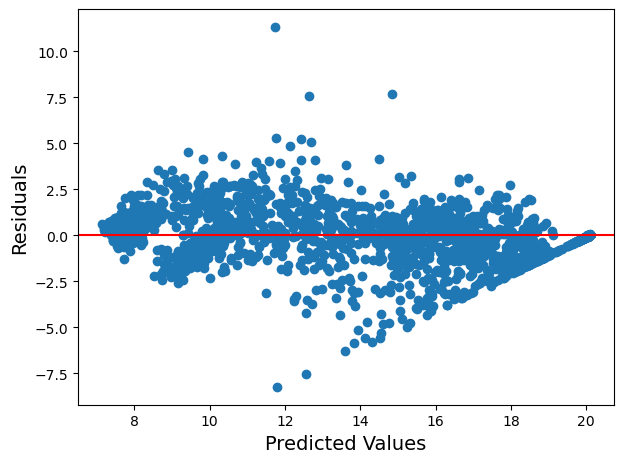

In [ ]:
# draw residuals for test

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# Create some example data
y_pred = final_model.predict(X_test)

# Compute residuals
residuals = y_pred - y_test

# Plot residuals against predicted values
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
save_fig("diff between predicted values vs actual values (ideal model) plot")
plt.show()



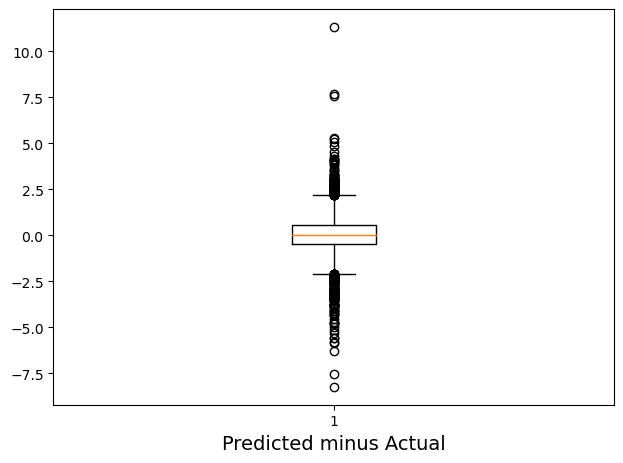

In [ ]:
# box plot
import matplotlib.pyplot as plt
import numpy as np

# Create some example data

y_pred = final_model.predict(X_test)
y = y_test

# Compute difference between predicted and actual values
diff = np.array(y_pred) - np.array(y)

# Plot box plot of the difference
plt.boxplot(diff)
plt.xlabel('Predicted minus Actual')
save_fig("diff between predicted values vs actual values (ideal model) box_plot")
plt.show()



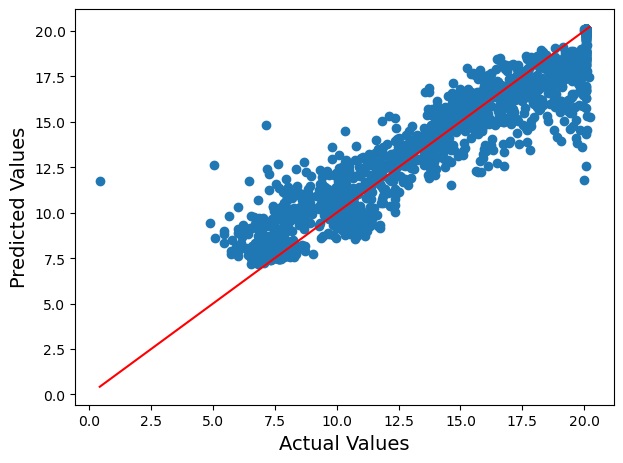

In [ ]:
# test

import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Create some example data
y_pred = final_model.predict(X_test)
y = y_test


# Add regression line
plt.scatter(y, y_pred)
plt.plot([min(y), max(y)], [min(y), max(y)], color='r')
# plt.plot([min(y), max(y)], [reg.predict([[min(y)]]), reg.predict([[max(y)]])], c='y')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
save_fig("predicted values vs actual values (ideal model)")
plt.show()



In [ ]:
job_info_with_trace_with_delay_with_host['cpu_info.CPU_flags_joined'].head()

0    fpu,vme,de,pse,tsc,msr,pae,mce,cx8,apic,sep,mtrr,pge,mca,cmov,pat,pse36,clflush,mmx,fxsr,sse,sse2,ht,syscall,nx,mmxext,fxsr_opt,pdpe1gb,rdtscp,lm,rep_good,nopl,cpuid,extd_apicid,tsc_known_freq,pni,pclmulqdq,ssse3,fma,cx16,sse4_1,sse4_2,x2apic,movbe,popcnt,aes,xsave,avx,f16c,rdrand,hypervisor,lahf_lm,cmp_legacy,cr8_legacy,abm,sse4a,misalignsse,3dnowprefetch,osvw,topoext,vmmcall,fsgsbase,bmi1,avx2,smep,bmi2,rdseed,adx,smap,clflushopt,sha_ni,xsaveopt,xsavec,xgetbv1,arat
1    fpu,vme,de,pse,tsc,msr,pae,mce,cx8,apic,sep,mtrr,pge,mca,cmov,pat,pse36,clflush,mmx,fxsr,sse,sse2,ht,syscall,nx,mmxext,fxsr_opt,pdpe1gb,rdtscp,lm,rep_good,nopl,cpuid,extd_apicid,tsc_known_freq,pni,pclmulqdq,ssse3,fma,cx16,sse4_1,sse4_2,x2apic,movbe,popcnt,aes,xsave,avx,f16c,rdrand,hypervisor,lahf_lm,cmp_legacy,cr8_legacy,abm,sse4a,misalignsse,3dnowprefetch,osvw,topoext,vmmcall,fsgsbase,bmi1,avx2,smep,bmi2,rdseed,adx,smap,clflushopt,sha_ni,xsaveopt,xsavec,xgetbv1,arat
2    fpu,vme,de,pse,tsc,msr,pae,mce,cx8,apic,s

In [ ]:
# baseline model
# # create e2e pipeline without features from Trace but with host info (cpu_info). 
# We will also have site in which the processing is done (not sure if we should use it because it may over-fit - we have only 3 site now)

# ADD:
#
# 'host', 'site'
# 'is_hyper_threading'
#
# 'cpu_info.CPU_cpu_cores', 'cpu_info.CPU_model'
#

from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.preprocessing import FunctionTransformer


# Trace columns to skip:


# Data columns (total 18 columns):
#  #   Column                     Non-Null Count  Dtype  
# ---  ------                     --------------  -----  
#  0   job_id                     11811 non-null  int64  
#  1   aliencpuefficiency         11811 non-null  float64
#  2   cputime                    11811 non-null  float64
#  3   host                       11760 non-null  object 
#  4   maxrss                     11811 non-null  int64  
#  5   cpuefficiency              11792 non-null  object 
#  6   finaltimestamp             11811 non-null  int64  
#  7   masterjobid                11811 non-null  int64  
#  8   pid                        11811 non-null  int64  
#  9   requestedcpus              11811 non-null  int64  
#  10  requestedttl               11811 non-null  int64  
#  11  runningtimestamp           11811 non-null  int64  
#  12  savingtimestamp            11811 non-null  int64  
#  13  startedtimestamp           11811 non-null  int64  
#  14  walltime                   11811 non-null  int64  
#  15  maxvirt                    11811 non-null  int64  
#  16  site                       11692 non-null  object 
#  17  laststatuschangetimestamp  11811 non-null  int64  

# also skip Status

# uses test data
# evaluate model against test data set

# strat_train_set, strat_test_set = strat_splits[0]

job_info_without_labels = X_train.drop("walltime_hours", axis=1)
job_info_with_labels = X_train["walltime_hours"].copy()


cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))


default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())
# preprocessing = ColumnTransformer([
#         ("cat", cat_pipeline, ['host', 'site']),
# ]) 


preprocessing = ColumnTransformer([
        ("cat", cat_pipeline, ['MemorySize', 'CPUCores', 'User', 'host', 'site', 'Type', 'JobTag_joined','Packages_joined','Executable_joined','Arguments_joined','InputFile_joined','JDLPath_joined','JDLArguments_joined','JDLProcessor_joined','ValidationCommand_joined','OutputDir_joined','Output_joined','Requirements_joined','WorkDirectorySize_joined','JDLVariables_joined','LPMMetaData_joined','LPMInteractionType_joined','LPMProductionTag_joined','PWG_joined','Type_joined','Activity_joined','InputDataType_joined', 'is_hyper_threading', 'cpu_info.CPU_flags_joined']),
        ("numeric", default_num_pipeline, [ 'TTL', 'Price', 'cpu_info.CPU_cpu_cores', 'cpu_info.CPU_model'])
])  

job_info_prepared = preprocessing.fit_transform(job_info_without_labels)
job_info_prepared.shape
# preprocessing.get_feature_names_out()



(7575, 16543)

In [ ]:
# train using all categories:

from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(job_info_without_labels, job_info_with_labels)

final_model_for_jdl_only_without_trace = lin_reg


In [ ]:
score = -cross_val_score(final_model_for_jdl_only_without_trace,
                X_train, y_train, scoring="neg_root_mean_squared_error", cv=KFold(n_splits=10, shuffle=True, random_state=42))
score

array([2.14924202, 1.8950737 , 1.95687912, 2.1316326 , 2.21112464,
       2.00111144, 1.97175127, 1.93043169, 2.09756313, 2.20412327])

In [ ]:
# cross validation of linear regression model
from sklearn.model_selection import cross_val_score

lin_rmses = -cross_val_score(lin_reg, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

count    10.000000
mean     2.057162 
std      0.077244 
min      1.959823 
25%      1.990848 
50%      2.039179 
75%      2.126526 
max      2.158548 
dtype: float64

In [ ]:
# cross validation of linear regression model on TEST set
from sklearn.model_selection import cross_val_score


lin_rmses = -cross_val_score(lin_reg, X_test, y_test,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

count    10.000000
mean     2.029529 
std      0.128260 
min      1.882226 
25%      1.953729 
50%      1.989530 
75%      2.084802 
max      2.278662 
dtype: float64

In [ ]:
from sklearn.metrics import r2_score

r2_score(y_test, lin_reg.predict(X_test))

0.8504130872462486

In [ ]:
# cross validation of linear regression model on TEST set
from sklearn.model_selection import cross_val_score


lin_rmses = -cross_val_score(lin_reg, X_test, y_test,
                              scoring="neg_mean_absolute_percentage_error", cv=10)
pd.Series(lin_rmses).describe()

count    10.000000
mean     0.143049 
std      0.044788 
min      0.115567 
25%      0.126457 
50%      0.130546 
75%      0.135680 
max      0.268627 
dtype: float64

In [ ]:
-cross_val_score(lin_reg,
                X_test, y_test, scoring="neg_root_mean_squared_error", cv=KFold(n_splits=10, shuffle=True, random_state=42))

array([2.05585105, 1.97644642, 1.94017339, 2.20202964, 2.05784196,
       2.19359646, 2.02686527, 2.01880989, 1.89203357, 2.13983141])

In [ ]:
final_rmse = mean_squared_error(y_test, lin_reg.predict(X_test), squared=False)
print(final_rmse)  

1.9699915047482057


In [ ]:
from sklearn.metrics import r2_score

r2_score(y_test, lin_reg.predict(X_test))

0.8504130872462486

In [ ]:
# ------> MEAP error <------

from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y_test, lin_reg.predict(X_test))

0.13473628140625338

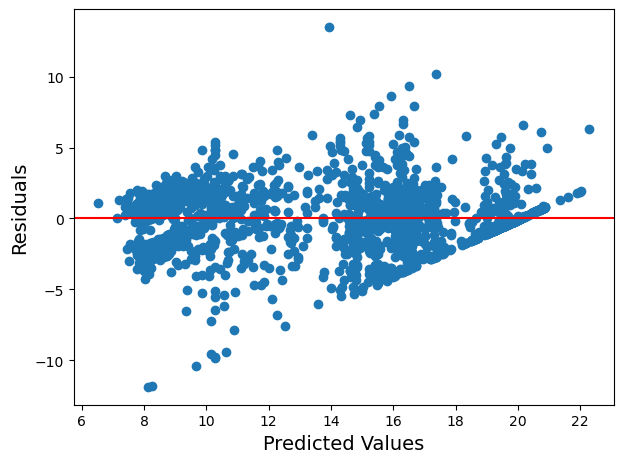

In [ ]:
# draw residuals for test

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# Create some example data
y_pred = lin_reg.predict(X_test)

# Compute residuals
residuals = y_pred - y_test

# Plot residuals against predicted values
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
save_fig("diff between predicted values vs actual values (baseline model) plot")
plt.show()

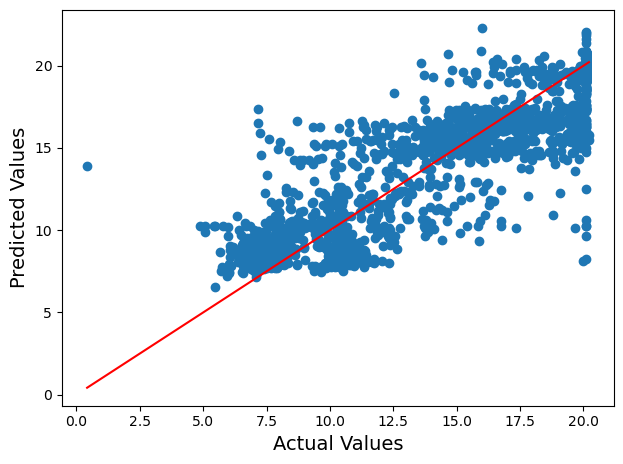

In [ ]:
# test

import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Create some example data
y_pred = lin_reg.predict(X_test)
y = y_test


# Add regression line
plt.scatter(y, y_pred)
plt.plot([min(y), max(y)], [min(y), max(y)], color='r')
# plt.plot([min(y), max(y)], [reg.predict([[min(y)]]), reg.predict([[max(y)]])], c='y')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
save_fig("predicted values vs actual values (baseline model) plot")
plt.show()

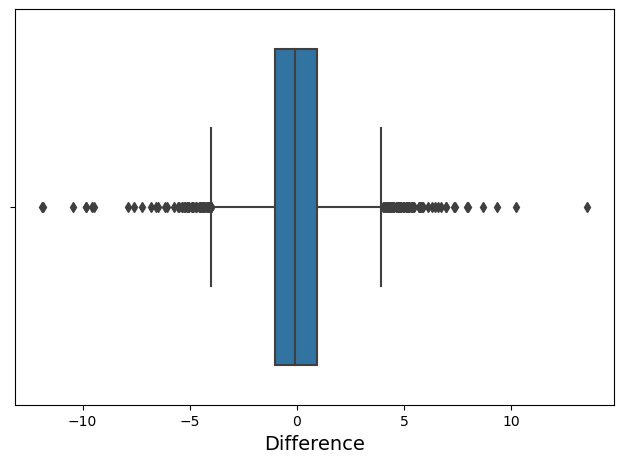

In [ ]:
import seaborn as sns
import pandas as pd

# Create some example data
y_pred = lin_reg.predict(X_test)
y = y_test

# Compute difference between predicted and actual values
diff = pd.DataFrame({'Difference': np.array(y_pred) - np.array(y)})

# Plot box plot of the difference
sns.boxplot(x='Difference', data=diff)
save_fig("difference between predicted values vs actual values (baseline model) boxplot")
plt.show()


In [ ]:
X_test.groupby(['TTL'])['TTL'].count()


TTL
72000.0    2525
Name: TTL, dtype: int64

ValueError: X has 1 features, but ColumnTransformer is expecting 384 features as input.

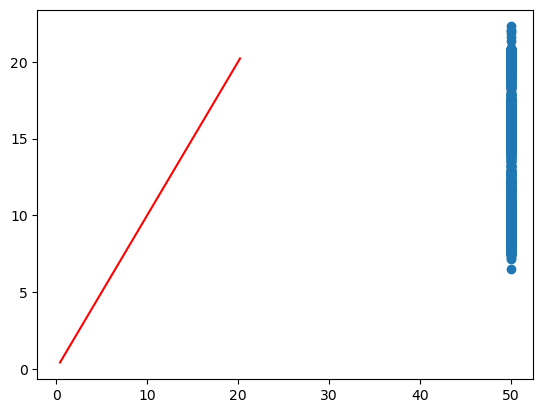

In [ ]:
# TODO wrong TTL
# draw ttl that was put in the JDL by the user

# test

import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Create some example data
y_pred = lin_reg.predict(X_test)
# y = y_test
ttl = X_test['TTL'] / 60 / 24


# Add regression line
plt.scatter(ttl, y_pred, label = 'Predicted')
# plt.scatter(ttl, y, label = 'Actual')

plt.plot([min(y), max(y)], [min(y), max(y)], color='r')
plt.plot([min(y), max(y)], [lin_reg.predict([[min(y)]]), lin_reg.predict([[max(y)]])], c='y')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

In [ ]:
# draw residuals for train

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# Create some example data
y_pred_train = lin_reg.predict(X_train)

# Compute residuals
residuals = y_pred_train - y_train

# Plot residuals against predicted values
plt.scatter(y_pred_train, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

In [ ]:
# train

import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Create some example data
y_pred_train = lin_reg.predict(X_train)
y = y_train


# Add regression line
plt.scatter(y, y_pred_train)
plt.plot([min(y), max(y)], [min(y), max(y)], color='r')
# plt.plot([min(y), max(y)], [lin_reg.predict([[min(y)]]), lin_reg.predict([[max(y)]])], c='y')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
save_fig("predicted values vs actual values TRAIN set (baseline model) plot")
plt.show()

In [ ]:
# box plot train
import matplotlib.pyplot as plt
import numpy as np

# Create some example data

y_pred = lin_reg.predict(X_train)
y = y_train

# Compute difference between predicted and actual values
diff = np.array(y_pred) - np.array(y)

# Plot box plot of the difference
plt.boxplot(diff)
plt.xlabel('Predicted minus Actual')
plt.show()

In [ ]:
# ideal model only with maxvirt and cputime from runtime features

# # create e2e pipeline without features from Trace (keep cputime and maxvirt) (add cpu_info, host, site)
# checking if it worth to consider 2 stage for max virt and cpu time
# does it give us improvement vs baseline?

from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.preprocessing import FunctionTransformer


# Trace columns to skip:


# Data columns (total 18 columns):
#  #   Column                     Non-Null Count  Dtype  
# ---  ------                     --------------  -----  
#  0   job_id                     11811 non-null  int64  
#  1   aliencpuefficiency         11811 non-null  float64
#  2   cputime                    11811 non-null  float64
#  3   host                       11760 non-null  object 
#  4   maxrss                     11811 non-null  int64  
#  5   cpuefficiency              11792 non-null  object 
#  6   finaltimestamp             11811 non-null  int64  
#  7   masterjobid                11811 non-null  int64  
#  8   pid                        11811 non-null  int64  
#  9   requestedcpus              11811 non-null  int64  
#  10  requestedttl               11811 non-null  int64  
#  11  runningtimestamp           11811 non-null  int64  
#  12  savingtimestamp            11811 non-null  int64  
#  13  startedtimestamp           11811 non-null  int64  
#  14  walltime                   11811 non-null  int64  
#  15  maxvirt                    11811 non-null  int64  
#  16  site                       11692 non-null  object 
#  17  laststatuschangetimestamp  11811 non-null  int64  

# also skip Status

cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))


default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())
# preprocessing = ColumnTransformer([
#         ("cat", cat_pipeline, ['host', 'site']),
# ]) 


preprocessing = ColumnTransformer([
        ("cat", cat_pipeline, ['MemorySize', 'CPUCores', 'User', 'Type', 'JobTag_joined','Packages_joined','Executable_joined','Arguments_joined','InputFile_joined','JDLPath_joined','JDLArguments_joined','JDLProcessor_joined','ValidationCommand_joined','OutputDir_joined','Output_joined','Requirements_joined','WorkDirectorySize_joined','JDLVariables_joined','LPMMetaData_joined','LPMInteractionType_joined','LPMProductionTag_joined','PWG_joined','Type_joined','Activity_joined','InputDataType_joined', 'host', 'site', 'cpu_info.CPU_flags_joined']),
        ("numeric", default_num_pipeline, [ 'TTL', 'Price', 'cputime', 'maxvirt', 'cpu_info.CPU_cpu_cores', 'cpu_info.CPU_model'])
])  

job_info_prepared = preprocessing.fit_transform(job_info_without_labels)
job_info_prepared.shape
# preprocessing.get_feature_names_out()

In [ ]:
# train using all categories:

from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(job_info_without_labels, job_info_with_labels)

In [ ]:
job_info_predictions = lin_reg.predict(job_info_without_labels)

In [ ]:
from sklearn.metrics import mean_squared_error
lin_rmse = mean_squared_error(job_info_with_labels, job_info_predictions,squared=False)
lin_rmse

In [ ]:
# Decision tree
from sklearn.tree import DecisionTreeRegressor

tree_reg = make_pipeline(preprocessing, DecisionTreeRegressor(random_state=42))
tree_reg.fit(job_info_without_labels, job_info_with_labels)

In [ ]:
job_info_predictions_tree = tree_reg.predict(job_info_without_labels)
tree_rmse = mean_squared_error(job_info_with_labels, job_info_predictions_tree, squared=False)
tree_rmse

In [ ]:
# cross validation of linear regression model
from sklearn.model_selection import cross_val_score

lin_rmses = -cross_val_score(lin_reg, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

In [ ]:
# cross validation of tree model
from sklearn.model_selection import cross_val_score

tree_rmses = -cross_val_score(tree_reg, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(tree_rmses).describe()

In [ ]:
# random forrest
from sklearn.ensemble import RandomForestRegressor

forest_reg = make_pipeline(preprocessing,
                           RandomForestRegressor(random_state=42))
forest_rmses = -cross_val_score(forest_reg, job_info_without_labels, job_info_with_labels,
                                scoring="neg_root_mean_squared_error", cv=10)
pd.Series(forest_rmses).describe()

In [ ]:
# different hyperparameters

from sklearn.model_selection import GridSearchCV

from sklearn.pipeline import Pipeline

full_pipeline = Pipeline([
    ("preprocessing", preprocessing),
    ("random_forest", RandomForestRegressor(random_state=42)),
])

param_grid = [
    {'random_forest__max_features': [4, 6, 8]},
    {'random_forest__max_features': [6, 8, 10]},
]

grid_search = GridSearchCV(full_pipeline, param_grid, cv=3,
                           scoring='neg_root_mean_squared_error')
grid_search.fit(job_info_without_labels, job_info_with_labels)

In [ ]:
grid_search.best_params_

In [ ]:
grid_search.best_estimator_

In [ ]:
cv_res = pd.DataFrame(grid_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)
cv_res.head()

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_distribs = {'random_forest__max_features': randint(low=2, high=20)}

rnd_search = RandomizedSearchCV(
    full_pipeline, param_distributions=param_distribs, n_iter=10, cv=3,
    scoring='neg_root_mean_squared_error', random_state=42)

rnd_search.fit(job_info_without_labels, job_info_with_labels)

In [ ]:
cv_res = pd.DataFrame(rnd_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)
cv_res.head()  

In [ ]:
# find importance of features
final_model = rnd_search.best_estimator_ 
final_model_for_jdl_and_cputime_and_maxvirt = final_model
feature_importances = final_model["random_forest"].feature_importances_
feature_importances.round(2)

In [ ]:
# features importance sorted
# sorted(zip(feature_importances,
#            final_model["preprocessing"].get_feature_names_out()),
#            reverse=True)

In [ ]:
# evaluate model against test data set
final_predictions = final_model_for_jdl_and_cputime_and_maxvirt.predict(X_test)

final_rmse = mean_squared_error(y_test, final_predictions, squared=False)
print(final_rmse)  

In [ ]:
from scipy import stats

confidence = 0.95
squared_errors = (final_predictions - y_test) ** 2

np.sqrt(stats.t.interval(confidence, len(squared_errors) - 1,
                            loc=squared_errors.mean(),
                            scale=stats.sem(squared_errors)))
# if we have a confidence theshold set to 0.95, the final_RMSE should be within 
# array([0.88768245, 1.16369627])
# our is 1.0349321568173235 so its within this threshold

In [ ]:
from sklearn.metrics import r2_score

r2_score(y_test, final_predictions)

In [ ]:
# ----> 
from sklearn.ensemble import RandomForestRegressor


cross = -cross_val_score(final_model_for_jdl_and_cputime_and_maxvirt, X_test, y_test,
                                scoring="neg_mean_absolute_percentage_error", cv=10)
pd.Series(cross).describe()

In [ ]:
# # create e2e pipeline without features from Trace (keep only maxvirt)
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.preprocessing import FunctionTransformer

# uses test data
# evaluate model against test data set

# strat_train_set, strat_test_set = strat_splits[0]

job_info_without_labels = X_train.drop("walltime_hours", axis=1)

cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))


default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())
# preprocessing = ColumnTransformer([
#         ("cat", cat_pipeline, ['host', 'site']),
# ]) 


preprocessing = ColumnTransformer([
        ("cat", cat_pipeline, ['MemorySize', 'CPUCores', 'User', 'Type', 'JobTag_joined','Packages_joined','Executable_joined','Arguments_joined','InputFile_joined','JDLPath_joined','JDLArguments_joined','JDLProcessor_joined','ValidationCommand_joined','OutputDir_joined','Output_joined','Requirements_joined','WorkDirectorySize_joined','JDLVariables_joined','LPMMetaData_joined','LPMInteractionType_joined','LPMProductionTag_joined','PWG_joined','Type_joined','Activity_joined','InputDataType_joined']),
        ("numeric", default_num_pipeline, [ 'TTL', 'Price', 'maxvirt'])
])  

job_info_prepared = preprocessing.fit_transform(job_info_without_labels)
job_info_prepared.shape
# preprocessing.get_feature_names_out()

In [ ]:
-cross_val_score(final_model_for_jdl_only_without_trace,
                X_train, y_train, scoring="neg_root_mean_squared_error", cv=KFold(n_splits=10, shuffle=True, random_state=42))

In [ ]:
# train using all categories:

from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(job_info_without_labels, job_info_with_labels)
job_info_predictions = lin_reg.predict(job_info_without_labels)
from sklearn.metrics import mean_squared_error
lin_rmse = mean_squared_error(job_info_with_labels, job_info_predictions,squared=False)
lin_rmse
# Decision tree
from sklearn.tree import DecisionTreeRegressor

tree_reg = make_pipeline(preprocessing, DecisionTreeRegressor(random_state=42))
tree_reg.fit(job_info_without_labels, job_info_with_labels)
job_info_predictions_tree = tree_reg.predict(job_info_without_labels)
tree_rmse = mean_squared_error(job_info_with_labels, job_info_predictions_tree, squared=False)
tree_rmse


In [ ]:
# cross validation of linear regression model
from sklearn.model_selection import cross_val_score

lin_rmses = -cross_val_score(lin_reg, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

In [ ]:
# cross validation of tree model
from sklearn.model_selection import cross_val_score

tree_rmses = -cross_val_score(tree_reg, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(tree_rmses).describe()

In [ ]:
# random forrest
from sklearn.ensemble import RandomForestRegressor

forest_reg = make_pipeline(preprocessing,
                           RandomForestRegressor(random_state=42))
forest_rmses = -cross_val_score(forest_reg, job_info_without_labels, job_info_with_labels,
                                scoring="neg_root_mean_squared_error", cv=10)
pd.Series(forest_rmses).describe()

In [ ]:
# different hyperparameters

from sklearn.model_selection import GridSearchCV

from sklearn.pipeline import Pipeline

full_pipeline = Pipeline([
    ("preprocessing", preprocessing),
    ("random_forest", RandomForestRegressor(random_state=42)),
])

param_grid = [
    {'random_forest__max_features': [4, 6, 8]},
    {'random_forest__max_features': [6, 8, 10]},
]

grid_search = GridSearchCV(full_pipeline, param_grid, cv=3,
                           scoring='neg_root_mean_squared_error')
grid_search.fit(job_info_without_labels, job_info_with_labels)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_distribs = {'random_forest__max_features': randint(low=2, high=20)}

rnd_search = RandomizedSearchCV(
    full_pipeline, param_distributions=param_distribs, n_iter=10, cv=3,
    scoring='neg_root_mean_squared_error', random_state=42)

rnd_search.fit(job_info_without_labels, job_info_with_labels)

In [ ]:
# find importance of features
final_model = rnd_search.best_estimator_ 
final_model_for_jdl_only_maxvirt = final_model
feature_importances = final_model["random_forest"].feature_importances_
feature_importances.round(2)

In [ ]:
from sklearn.metrics import r2_score

r2_score(job_info_with_labels, final_model.predict(job_info_without_labels))

In [ ]:
# ----> 
from sklearn.ensemble import RandomForestRegressor


cross = -cross_val_score(final_model, X_test, y_test,
                                scoring="neg_mean_absolute_percentage_error", cv=10)
pd.Series(cross).describe()

In [ ]:

# predict cpu time

# strat_train_set, strat_test_set = strat_splits[0]

# drop labels because we want to predict it
job_info_without_labels = X_train.drop("cputime", axis=1)
job_info_with_labels = X_train["cputime"].copy()


# # create e2e pipeline without features from Trace
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.preprocessing import FunctionTransformer


cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))


default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())
# preprocessing = ColumnTransformer([
#         ("cat", cat_pipeline, ['host', 'site']),
# ]) 


preprocessing = ColumnTransformer([
        ("cat", cat_pipeline, ['MemorySize', 'CPUCores', 'User', 'Type', 'JobTag_joined','Packages_joined','Executable_joined','Arguments_joined','InputFile_joined','JDLPath_joined','JDLArguments_joined','JDLProcessor_joined','ValidationCommand_joined','OutputDir_joined','Output_joined','Requirements_joined','WorkDirectorySize_joined','JDLVariables_joined','LPMMetaData_joined','LPMInteractionType_joined','LPMProductionTag_joined','PWG_joined','Type_joined','Activity_joined','InputDataType_joined', 'host', 'site', 'cpu_info.CPU_flags_joined']),
        ("numeric", default_num_pipeline, [ 'TTL', 'Price', 'cpu_info.CPU_cpu_cores', 'cpu_info.CPU_model'])
])  

job_info_prepared = preprocessing.fit_transform(job_info_without_labels)
job_info_prepared.shape
# preprocessing.get_feature_names_out()

In [ ]:
# # train using all categories:

# from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(job_info_without_labels, job_info_with_labels)


job_info_predictions = lin_reg.predict(job_info_without_labels)
cpu_time_job_info_predictions = job_info_predictions


# train using all categories:

from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(job_info_without_labels, job_info_with_labels)


-cross_val_score(lin_reg,
                job_info_without_labels, job_info_with_labels, scoring="neg_root_mean_squared_error", cv=KFold(n_splits=10, shuffle=True, random_state=42))




In [ ]:
final_model_for_cpu_prediction = lin_reg

In [ ]:
# job_info_without_labels['cpu_time_predicted'] = job_info_predictions
# job_info_without_labels

In [ ]:
from sklearn.metrics import mean_squared_error
lin_rmse = mean_squared_error(job_info_with_labels, final_model_for_cpu_prediction.predict(job_info_without_labels) ,squared=False)
lin_rmse

In [ ]:
# # Decision tree
from sklearn.tree import DecisionTreeRegressor
tree_reg = make_pipeline(preprocessing, DecisionTreeRegressor(random_state=42))
tree_reg.fit(job_info_without_labels, job_info_with_labels)

job_info_predictions_tree = tree_reg.predict(job_info_without_labels)
tree_rmse = mean_squared_error(job_info_with_labels, job_info_predictions_tree, squared=False)
tree_rmse

In [ ]:
# cross validation of linear regression model -->>
from sklearn.model_selection import cross_val_score


lin_rmses = -cross_val_score(lin_reg, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
final_model_for_cpu_prediction = lin_reg

final_model_for_cputime_prediction=lin_reg
pd.Series(lin_rmses).describe()

In [ ]:
from sklearn.metrics import mean_squared_error
lin_rmse = mean_squared_error(job_info_with_labels, final_model_for_cpu_prediction.predict(job_info_without_labels),squared=False)
lin_rmse

In [ ]:
job_info_with_labels.describe()

In [ ]:
# cross validation of linear regression model on test set
X_test_cpu_time = X_test.drop(["cputime"], axis=1)
y_test_cpu_time_label = X_test["cputime"].copy()

cpu_test_predictions = final_model_for_cpu_prediction.predict(X_test_cpu_time);

final_rmse = mean_squared_error(y_test_cpu_time_label, cpu_test_predictions, squared=False)
print(final_rmse)  


In [ ]:
# cross validation of linear regression model
from sklearn.model_selection import cross_val_score

lin_rmses = -cross_val_score(lin_reg, X_test_cpu_time, y_test_cpu_time_label,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

In [ ]:
# todo add r2
from sklearn.metrics import r2_score

r2_score(y_test_cpu_time_label, lin_reg.predict(X_test_cpu_time))

In [ ]:
# todo add r2
from sklearn.metrics import r2_score

r2_score(job_info_with_labels, lin_reg.predict(job_info_without_labels))

In [ ]:
# ------> MEAP error <------

from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y_test_cpu_time_label, lin_reg.predict(X_test_cpu_time))

In [ ]:
# ------> MEAP error <------

from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(job_info_with_labels, lin_reg.predict(job_info_without_labels))

In [ ]:
# ----> 
from sklearn.ensemble import RandomForestRegressor


cross = -cross_val_score(lin_reg, X_test_cpu_time, y_test_cpu_time_label,
                                scoring="neg_mean_absolute_percentage_error", cv=10)
pd.Series(cross).describe()

In [ ]:
# train using all categories:

from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(job_info_without_labels, job_info_with_labels)


-cross_val_score(lin_reg,
                X_train, y_train, scoring="neg_root_mean_squared_error", cv=KFold(n_splits=10, shuffle=True, random_state=42))

In [ ]:
# ------> MEAP error <------

from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y_test_cpu_time_label, lin_reg.predict(X_test_cpu_time))

In [ ]:
# cross vall tree on test set
from sklearn.model_selection import cross_val_score

tree_rmses = -cross_val_score(tree_reg, X_test_cpu_time, y_test_cpu_time_label,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(tree_rmses).describe()

In [ ]:
from sklearn.metrics import r2_score

r2_score(y_test_cpu_time_label, tree_reg.predict(X_test_cpu_time))

In [ ]:

# random forrest
from sklearn.ensemble import RandomForestRegressor

forest_reg = make_pipeline(preprocessing,
                           RandomForestRegressor(random_state=42))
forest_rmses = -cross_val_score(forest_reg, job_info_without_labels, job_info_with_labels,
                                scoring="neg_root_mean_squared_error", cv=10)
pd.Series(forest_rmses).describe()


In [ ]:
grid_search.best_params_

In [ ]:
grid_search.best_estimator_

In [ ]:
cv_res = pd.DataFrame(grid_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)
cv_res.head()

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_distribs = {'random_forest__max_features': randint(low=2, high=20)}

rnd_search = RandomizedSearchCV(
    full_pipeline, param_distributions=param_distribs, n_iter=10, cv=3,
    scoring='neg_root_mean_squared_error', random_state=42)

rnd_search.fit(job_info_without_labels, job_info_with_labels)

In [ ]:
cv_res = pd.DataFrame(rnd_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)
cv_res.head()  

In [ ]:
# find importance of features
final_model = rnd_search.best_estimator_ 
feature_importances = final_model["random_forest"].feature_importances_
feature_importances.round(2)

In [ ]:
# features importance sorted
# sorted(zip(feature_importances,
#            final_model["preprocessing"].get_feature_names_out()),
#            reverse=True)

In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.preprocessing import FunctionTransformer

# predict maxvirt plus hosts and cpu_info

# strat_train_set, strat_test_set = strat_splits[0]

# drop labels because we want to predict it
job_info_without_labels = X_train.drop("maxvirt", axis=1)
job_info_with_labels = X_train["maxvirt"].copy()


cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))


default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())

preprocessing = ColumnTransformer([
        ("cat", cat_pipeline, ['MemorySize', 'CPUCores', 'User', 'Type', 'JobTag_joined','Packages_joined','Executable_joined','Arguments_joined','InputFile_joined','JDLPath_joined','JDLArguments_joined','JDLProcessor_joined','ValidationCommand_joined','OutputDir_joined','Output_joined','Requirements_joined','WorkDirectorySize_joined','JDLVariables_joined','LPMMetaData_joined','LPMInteractionType_joined','LPMProductionTag_joined','PWG_joined','Type_joined','Activity_joined','InputDataType_joined', 'host', 'site', 'cpu_info.CPU_flags_joined']),
        ("numeric", default_num_pipeline, [ 'TTL', 'Price', 'cpu_info.CPU_cpu_cores', 'cpu_info.CPU_model'])
])  

preprocessing_only_trace = preprocessing 

job_info_prepared = preprocessing.fit_transform(job_info_without_labels)
job_info_prepared.shape
# preprocessing.get_feature_names_out()

# train using all categories:

from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(job_info_without_labels, job_info_with_labels)


final_model_for_maxvirt_prediction=lin_reg

job_info_predictions = lin_reg.predict(job_info_without_labels)
max_virt_job_info_predictions = job_info_predictions

# cross validation of linear regression model
from sklearn.model_selection import cross_val_score

lin_rmses = -cross_val_score(lin_reg, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

In [ ]:
-cross_val_score(final_model_for_maxvirt_prediction,
                job_info_without_labels, job_info_with_labels, scoring="neg_root_mean_squared_error", cv=KFold(n_splits=10, shuffle=True, random_state=42))

In [ ]:
X_test_max_virt = X_test.drop("maxvirt", axis=1)
Y_test_max_virt = X_test["maxvirt"].copy()


predictions = lin_reg.predict(X_test_max_virt);
final_rmse = mean_squared_error(Y_test_max_virt, predictions, squared=False)

print(final_rmse) 

In [ ]:
# todo add r2
from sklearn.metrics import r2_score

r2_score(Y_test_max_virt, final_model_for_maxvirt_prediction.predict(X_test_max_virt))

In [ ]:
# ------> MEAP error <------

from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(Y_test_max_virt, final_model_for_maxvirt_prediction.predict(X_test_max_virt))

In [ ]:
# ----> 
from sklearn.ensemble import RandomForestRegressor


cross = -cross_val_score(lin_reg, X_test, y_test,
                                scoring="neg_mean_absolute_percentage_error", cv=10)
pd.Series(cross).describe()

In [ ]:
pd.set_option('display.float_format', lambda x: '%.5f' % x)

job_info_with_labels.describe()

In [ ]:
# cross validation of linear regression model on test set
X_test_maxvirt = X_test.drop(["maxvirt"], axis=1)
y_test_maxvirt_label = X_test["maxvirt"].copy()

maxvirt_test_predictions = final_model_for_maxvirt_prediction.predict(X_test_maxvirt);

final_rmse = mean_squared_error(y_test_maxvirt_label, maxvirt_test_predictions, squared=False)
print(final_rmse)  

In [ ]:
# cross validation of tree model
from sklearn.model_selection import cross_val_score

tree_rmses = -cross_val_score(final_model_for_maxvirt_prediction, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(tree_rmses).describe()


In [ ]:

# random forrest
from sklearn.ensemble import RandomForestRegressor

forest_reg = make_pipeline(preprocessing,
                           RandomForestRegressor(random_state=42))
forest_rmses = -cross_val_score(forest_reg, job_info_without_labels, job_info_with_labels,
                                scoring="neg_root_mean_squared_error", cv=10)
pd.Series(forest_rmses).describe()

In [ ]:
from sklearn.metrics import r2_score

r2_score(job_info_with_labels, final_model_for_maxvirt_prediction.predict(job_info_without_labels))

In [ ]:
# ------> MEAP error <------

from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y_test_maxvirt_label, final_model_for_maxvirt_prediction.predict(X_test_maxvirt))

In [ ]:
# ----> 
from sklearn.ensemble import RandomForestRegressor


cross = -cross_val_score(final_model_for_maxvirt_prediction, X_test_maxvirt, y_test_maxvirt_label,
                                scoring="neg_mean_absolute_percentage_error", cv=10)
pd.Series(cross).describe()

In [ ]:
# 2 stage learning using predictions from cputime and maxvirt models

# drop features that are used by the final_model_for_jdl_and_cputime_and_maxvirt 
# and are calculated via the final_model_for_cpu_prediction and final_model_for_maxvirt_prediction

# strat_train_set, strat_test_set = strat_splits[0]

job_info_without_labels = X_train.drop(["walltime_hours", "cputime", "maxvirt"], axis=1)

# job_info_without_labels = strat_train_set.drop("cputime", axis=1)
# job_info_without_labels = strat_train_set.drop("maxvirt", axis=1)

# get label that needs to be predicted
job_info_with_labels = X_train["walltime_hours"].copy()

# add predicted cputime and maxvirt to the input data 
job_info_without_labels['cputime'] = cpu_time_job_info_predictions
job_info_without_labels['maxvirt'] = max_virt_job_info_predictions



In [ ]:

# TODO wrong because uses the train data
# cross validation of linear regression model
from sklearn.model_selection import cross_val_score

lin_rmses = -cross_val_score(final_model_for_jdl_and_cputime_and_maxvirt, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

In [ ]:
from sklearn.metrics import r2_score

r2_score(job_info_with_labels, final_model_for_jdl_and_cputime_and_maxvirt.predict(job_info_without_labels))

In [ ]:
# ------> MEAP error <------

from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(job_info_with_labels, final_model_for_jdl_and_cputime_and_maxvirt.predict(job_info_without_labels))

In [ ]:
# FULL 2-stage approach

# uses test data
# evaluate model against test data set
X_test_walltime = X_test.drop(["walltime_hours",'cputime','maxvirt'], axis=1)
y_test_walltime_label = X_test["walltime_hours"].copy()
X_test_cpu_time = X_test.drop(["cputime"], axis=1)
X_test_max_virt = X_test.drop(["maxvirt"], axis=1)

cpu_test_predictions = final_model_for_cpu_prediction.predict(X_test_cpu_time);

max_virt_test_predictions = final_model_for_maxvirt_prediction.predict(X_test_max_virt);


X_test_walltime['cputime'] = cpu_test_predictions
X_test_walltime['maxvirt'] = max_virt_test_predictions

final_predictions = final_model_for_jdl_and_cputime_and_maxvirt.predict(X_test_walltime)

final_rmse = mean_squared_error(y_test_walltime_label, final_predictions, squared=False)
print(final_rmse)  

# X_test_walltime[['cputime','maxvirt']]


In [ ]:
-cross_val_score(final_model_for_jdl_and_cputime_and_maxvirt,
                X_test_walltime, y_test_walltime_label, scoring="neg_root_mean_squared_error", cv=KFold(n_splits=10, shuffle=True, random_state=42))

In [ ]:
from sklearn.metrics import r2_score

r2_score(y_test_walltime_label, final_model_for_jdl_and_cputime_and_maxvirt.predict(X_test_walltime))

In [ ]:
# uses test data
# cross validation of linear regression model
from sklearn.model_selection import cross_val_score

lin_rmses = -cross_val_score(final_model_for_jdl_and_cputime_and_maxvirt, X_test_walltime, y_test_walltime_label,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

In [ ]:
from sklearn.metrics import r2_score

r2_score(y_test_walltime_label, final_model_for_jdl_and_cputime_and_maxvirt.predict(X_test_walltime))

In [ ]:
# ------> MEAP error <------

from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y_test_walltime_label, final_model_for_jdl_and_cputime_and_maxvirt.predict(X_test_walltime))

In [ ]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
     job_info_with_trace_with_delay_with_host, job_info_with_trace_with_delay_with_host["walltime_hours"])

In [ ]:
# 2 stage learning using predictions from maxvirt models

# drop features that are used by the final_model_for_jdl_and_cputime_and_maxvirt 
# and are calculated via the final_model_for_cpu_prediction and final_model_for_maxvirt_prediction

# strat_train_set, strat_test_set = strat_splits[0]

job_info_without_labels = X_train.drop(["walltime_hours", "maxvirt"], axis=1)

# job_info_without_labels = strat_train_set.drop("cputime", axis=1)
# job_info_without_labels = strat_train_set.drop("maxvirt", axis=1)

# get label that needs to be predicted
job_info_with_labels = X_train["walltime_hours"].copy()

max_virt_test_predictions = final_model_for_maxvirt_prediction.predict(job_info_without_labels);

# add predicted cputime and maxvirt to the input data 
job_info_without_labels['maxvirt'] = max_virt_job_info_predictions


# TODO wrong because uses the train data
# cross validation of linear regression model
from sklearn.model_selection import cross_val_score

lin_rmses = -cross_val_score(final_model_for_jdl_only_maxvirt, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

In [ ]:
#cross val

# test using only final_model_for_jdl_only_maxvirt
# uses test data
# evaluate model against test data set


# TODO HERE
# strat_train_set, strat_test_set = strat_splits[1]

X_test_walltime = X_train.drop(["walltime_hours"], axis=1)
y_test_walltime_label = X_train["walltime_hours"].copy()
X_test_max_virt = X_train.drop(['maxvirt'], axis=1)

# cpu_test_predictions = final_model_for_jdl_only_maxvirt.predict(X_test_cpu_time);

max_virt_test_predictions = final_model_for_maxvirt_prediction.predict(X_test_max_virt);


# X_test_walltime['cputime'] = cpu_test_predictions
X_test_walltime['maxvirt'] = max_virt_test_predictions

final_predictions = final_model_for_jdl_only_maxvirt.predict(X_test_walltime)

final_rmse = mean_squared_error(y_test_walltime_label, final_predictions, squared=False)
print(final_rmse)  

# X_test_walltime[['cputime','maxvirt']]

from sklearn.model_selection import KFold, RepeatedStratifiedKFold

-cross_val_score(final_model_for_jdl_only_maxvirt,
                X_test_walltime, y_test_walltime_label, scoring="neg_root_mean_squared_error", cv=KFold(n_splits=10, shuffle=True, random_state=42))

In [ ]:
# test using only final_model_for_jdl_only_maxvirt
# uses test data
# evaluate model against test data set



# TODO HERE

X_test_walltime = X_test.drop(["walltime_hours"], axis=1)
y_test_walltime_label = X_test["walltime_hours"].copy()
# X_test_cpu_time = strat_test_set.drop(["cputime"], axis=1)
X_test_max_virt = X_test.drop(['maxvirt'], axis=1)

# cpu_test_predictions = final_model_for_jdl_only_maxvirt.predict(X_test_cpu_time);

max_virt_test_predictions = final_model_for_maxvirt_prediction.predict(X_test_max_virt);


# X_test_walltime['cputime'] = cpu_test_predictions
X_test_walltime['maxvirt'] = max_virt_test_predictions

final_predictions = final_model_for_jdl_only_maxvirt.predict(X_test_walltime)

final_rmse = mean_squared_error(y_test_walltime_label, final_predictions, squared=False)
print(final_rmse)  

# X_test_walltime[['cputime','maxvirt']]


from sklearn.model_selection import KFold, RepeatedStratifiedKFold


scores = cross_val_score(final_model_for_jdl_only_maxvirt,
                X_test_walltime, y_test_walltime_label, cv=KFold(n_splits=10, shuffle=True, random_state=42))

print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))


In [ ]:
# uses test data
# cross validation of linear regression model
from sklearn.model_selection import cross_val_score

lin_rmses = -cross_val_score(final_model_for_jdl_only_maxvirt, X_test_walltime, y_test_walltime_label,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

In [ ]:
from sklearn.metrics import r2_score


r2_score(y_test_walltime_label, final_model_for_jdl_only_maxvirt.predict(X_test_walltime))


In [ ]:
# ------> MEAP error <------

from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y_test_walltime_label, final_model_for_jdl_only_maxvirt.predict(X_test_walltime))

In [ ]:
# 2 stage learning using predictions from cputime models

# drop features that are used by the final_model_for_jdl_and_cputime_and_maxvirt 
# and are calculated via the final_model_for_cpu_prediction and final_model_for_maxvirt_prediction

# strat_train_set, strat_test_set = strat_splits[0]

job_info_without_labels = X_train.drop(["walltime_hours", "cputime"], axis=1)

# job_info_without_labels = strat_train_set.drop("cputime", axis=1)
# job_info_without_labels = strat_train_set.drop("maxvirt", axis=1)

# get label that needs to be predicted
job_info_with_labels = X_train["walltime_hours"].copy()

cputime_test_predictions = final_model_for_cpu_prediction.predict(job_info_without_labels);

# add predicted cputime and maxvirt to the input data 
job_info_without_labels['cputime'] = cputime_test_predictions


# TODO wrong because uses the train data
# cross validation of linear regression model
from sklearn.model_selection import cross_val_score

lin_rmses = -cross_val_score(final_model_for_jdl_only_maxvirt, job_info_without_labels, job_info_with_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

In [ ]:
#cross val

# test using only final_model_for_jdl_only_maxvirt
# uses test data
# evaluate model against test data set


# TODO HERE
# strat_train_set, strat_test_set = strat_splits[1]

X_test_walltime = X_train.drop(["walltime_hours"], axis=1)
y_test_walltime_label = X_train["walltime_hours"].copy()
X_test_cput_time = X_train.drop(['cputime'], axis=1)

# cpu_test_predictions = final_model_for_jdl_only_maxvirt.predict(X_test_cpu_time);

cpu_test_predictions = final_model_for_cpu_prediction.predict(X_test_cput_time);


# X_test_walltime['cputime'] = cpu_test_predictions
X_test_walltime['cputime'] = cpu_test_predictions

final_predictions = final_model_for_jdl_only_maxvirt.predict(X_test_walltime)

final_rmse = mean_squared_error(y_test_walltime_label, final_predictions, squared=False)
print(final_rmse)  

# X_test_walltime[['cputime','maxvirt']]

from sklearn.model_selection import KFold, RepeatedStratifiedKFold

-cross_val_score(final_model_for_jdl_only_maxvirt,
                X_test_walltime, y_test_walltime_label, scoring="neg_root_mean_squared_error", cv=KFold(n_splits=10, shuffle=True, random_state=42))

In [ ]:
from sklearn.metrics import r2_score


r2_score(y_test_walltime_label, final_model_for_jdl_only_maxvirt.predict(X_test_walltime))


In [ ]:
# ------> MEAP error <------

from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y_test_walltime_label, final_model_for_jdl_only_maxvirt.predict(X_test_walltime))